# EDA - HDB Resale

## Table of Contents
- [EDA - HDB Resale](#eda---hdb-resale)
  - [Table of Contents](#table-of-contents)
    - [Import Environment Modules and Data](#import-environment-modules-and-data)
    - [Load Data](#load-data)
  - [Problem Statement](#problem-statement)
  - [Original Data Dictionary](#original-data-dictionary)
  - [Basic Data Exploration](#basic-data-exploration)
      - [Detecting Duplicates](#detecting-duplicates)
      - [Detecting Missing Values](#detecting-missing-values)
    - [Data Structure Analysis](#data-structure-analysis)
      - [Data Anomaly Analysis for Numerical Columns](#data-anomaly-analysis-for-numerical-columns)
      - [Data Structure Anomaly Analysis for Categorical Columns](#data-structure-anomaly-analysis-for-categorical-columns)
  - [Data Cleaning For EDA](#data-cleaning-for-eda)
  - [Data Imputation for Analysis](#data-imputation-for-analysis)
  - [Target Analysis](#target-analysis)
    - [Skewness Analysis](#skewness-analysis)
    - [Outliers Analysis](#outliers-analysis)
      - [Million Dollar Flats by Year (Outliers in Layman Conext)](#million-dollar-flats-by-year-outliers-in-layman-conext)
  - [Feature Analysis (Univariate)](#feature-analysis-univariate)
      - [Numerical Feature Column: Floor Area (square meters)](#numerical-feature-column-floor-area-square-meters)
      - [Numerical Feature Column: Lease Commence Date](#numerical-feature-column-lease-commence-date)
    - [Categorical Columns](#categorical-columns)
      - [Categorical Feature Column: Month](#categorical-feature-column-month)
      - [Categorical Feature Column: Town](#categorical-feature-column-town)
      - [Categorical Feature Column: Flat type](#categorical-feature-column-flat-type)
      - [Categorical Feature Column: Storey Range](#categorical-feature-column-storey-range)
      - [Categorical Feature Column: Flat Model](#categorical-feature-column-flat-model)
      - [Categorical Feature Column: Remaining Lease](#categorical-feature-column-remaining-lease)
  - [Bivariate Analysis: Feature vs Target](#bivariate-analysis-feature-vs-target)
    - [Numerical Bivariate Analysis](#numerical-bivariate-analysis)
      - [Numerical Feature Column: Storey Range with HDB Resale Price](#numerical-feature-column-storey-range-with-hdb-resale-price)
      - [Numerical Feature Column: Floor Area Square Meter with HDB Resale Price](#numerical-feature-column-floor-area-square-meter-with-hdb-resale-price)
      - [Numerical Feature Column: Lease Commence Date with HDB Resale Price](#numerical-feature-column-lease-commence-date-with-hdb-resale-price)
      - [Numerical Feature Column: Transaction Year with HDB Resale Price](#numerical-feature-column-transaction-year-with-hdb-resale-price)
      - [Numerical Feature Column: Transaction Month with HDB Resale Price](#numerical-feature-column-transaction-month-with-hdb-resale-price)
      - [Numerical Feature Column: Remaining Lease by Month with HDB Resale Price](#numerical-feature-column-remaining-lease-by-month-with-hdb-resale-price)
      - [Categorical Bivariate Analysis](#categorical-bivariate-analysis)
      - [Categorical Feature Column: Town with HDB Resale Price](#categorical-feature-column-town-with-hdb-resale-price)
      - [Categorical Feature Column: Flat Type with HDB Resale Price](#categorical-feature-column-flat-type-with-hdb-resale-price)
      - [Additional Plot](#additional-plot)
      - [Categorical Feature Column: Flat Model with HDB Resale Price](#categorical-feature-column-flat-model-with-hdb-resale-price)
    - [Temporal Feature Bivariate Analysis](#temporal-feature-bivariate-analysis)
      - [Temporal Feature Column: Month with HDB Resale Price](#temporal-feature-column-month-with-hdb-resale-price)
    - [Additional Analysis](#additional-analysis)
    - [Cyclical Analysis of Resale Transaction](#cyclical-analysis-of-resale-transaction)
  - [Multivariate Analysis - Pair Plot](#multivariate-analysis---pair-plot)
  - [Multivariate Analysis - Additional Analysis](#multivariate-analysis---additional-analysis)
    - [Flat Type and Floor Area](#flat-type-and-floor-area)
    - [Average Resale Price By Town, Type and Model Analysis](#average-resale-price-by-town-type-and-model-analysis)
    - [Selected Break Down of Resale Price](#selected-break-down-of-resale-price)
      - [4 ROOM with Model A by Town](#4-room-with-model-a-by-town)
    - [Correlation Analysis](#correlation-analysis)
    - [Analysis of Floor Area and Resale Price](#analysis-of-floor-area-and-resale-price)
  - [Transformed Data Dictionary](#transformed-data-dictionary)
  - [EDA Findings](#eda-findings)
    - [Conclusion](#conclusion)
    - [Model Selection](#model-selection)
  - [END](#end)


### Import Environment Modules and Data

In [ ]:
### Import Python Modules

## System Modules
import os
import warnings

## Essential Modules
import numpy as np
import pandas as pd

## Graphical Modules
import seaborn as sns
import matplotlib.pyplot as plt

## Statistical Tests
import scipy.stats as st
from scipy.stats.mstats import kruskalwallis # Kruskal-Wallis

import statsmodels.api as sm
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statsmodels.stats.weightstats import DescrStatsW
from statsmodels.tsa.seasonal import STL                                    # trend‑seasonality split  
from statsmodels.tsa.stattools import adfuller                              # stationarity test     
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf               # autocorr lenses 
from statsmodels.stats.outliers_influence import variance_inflation_factor  # VIF for correlation among features

## Pipeline and Train Test Split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import RFECV 
from sklearn.model_selection import train_test_split, KFold

## SciKit Learning Preprocessing  
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, PowerTransformer
from sklearn.preprocessing import OneHotEncoder

### SciKit Learn ML Models

## Linear Models
from sklearn.linear_model import LinearRegression, HuberRegressor, QuantileRegressor
from sklearn.linear_model import Ridge, Lasso
from sklearn.compose import TransformedTargetRegressor

## Tree Based Linear Models
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor


## Performance Metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error, root_mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score


### Hyper-parameter Tuning

## GridSearch CV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score

## explicitly require this experimental feature
from sklearn.experimental import enable_halving_search_cv # noqa
# now you can import normally from model_selection
from sklearn.model_selection import HalvingRandomSearchCV # type: ignore

## Optuna for Hyperparameter Tuning
from optuna.integration import OptunaSearchCV
from optuna.distributions import IntDistribution, FloatDistribution

### Load Data

The following is a temporary placeholder. In a real end to end project, we need to connect to BigQuery and download the data from BigQuery using SQL extraction.

In [3]:
# Load the dataset
df = pd.read_csv('./data/hdb_resale_price.csv')

In [4]:
# give an indication on how large the dataset is
len(df)

211086

## Problem Statement

**We work for a property consultancy company. This company want to develop an end to end machine learning pipeline that could deliver housing price prediction to customer.**

**Our task is to develop a machine learning model that could accurately predict the resale prices of HDB resale flats. This model will assist buyers or sellers in planning their budgets more effectively and set realistic expectations. This model also need to help buyers determine the type of flat they can afford and in which location. This model also should provide sellers with valuable information regarding the potential market value of their property.**

## Data Dictionary

Data Source
- https://data.gov.sg/datasets?query=hdb+resale&resultId=d_8b84c4ee58e3cfc0ece0d773c8ca6abc&page=1

**Data Dictionary**
| Description | Feature Names  | Data Type | Examples & Remarks |
| ------------- |:-------------:| :-----: | :----------------| 
| Month | month | string | Format (YYYY-MM) `2017-01` |
| Town | town | string | `ANG MO KIO` |
| Flat Type | flat_type | string | `3 ROOM`, `4 ROOM` etc|
| Block | block | string |  `108`, `602` etc|
| Street Name | street_name | string | `ANG MO KIO AVE 4`, `ANG MO KIO AVE 10`  |
| Storey Range | storey_range | string | `01 TO 03`, `07 TO 09` etc |
| Floor Area Sqm| floor_area_sqm | float | `68`, `82` etc |
| Flat Model | flat_model | string | `Model A`, `New Generation` etc |
| Lease Commence Date | lease_commence_date | integer | `1977`, `1981` |
| Remaining Lease | remaining_lease | string | `60 years 07 months`, `63 years` |
| Resale Price | resale_price | float | `328000`, `366000` |

## Basic Data Exploration

In [5]:
# Peek on the first 5 rows of the dataset
df.head()

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
0,2017-01,ANG MO KIO,2 ROOM,406,ANG MO KIO AVE 10,10 TO 12,44.0,Improved,1979,61 years 04 months,232000.0
1,2017-01,ANG MO KIO,3 ROOM,108,ANG MO KIO AVE 4,01 TO 03,67.0,New Generation,1978,60 years 07 months,250000.0
2,2017-01,ANG MO KIO,3 ROOM,602,ANG MO KIO AVE 5,01 TO 03,67.0,New Generation,1980,62 years 05 months,262000.0
3,2017-01,ANG MO KIO,3 ROOM,465,ANG MO KIO AVE 10,04 TO 06,68.0,New Generation,1980,62 years 01 month,265000.0
4,2017-01,ANG MO KIO,3 ROOM,601,ANG MO KIO AVE 5,01 TO 03,67.0,New Generation,1980,62 years 05 months,265000.0


#### Detecting Duplicates

In [6]:
# check if there are any duplicates in the dataset
df.duplicated().sum()

np.int64(304)

**There are 304 duplicates.**

In [7]:
# Show the duplicates for visual inspection
df[df.duplicated(keep=False)].sort_values(by=list(df.columns))

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
224,2017-01,BUKIT MERAH,4 ROOM,106,HENDERSON CRES,07 TO 09,81.0,Improved,1975,57 years,470000.0
243,2017-01,BUKIT MERAH,4 ROOM,106,HENDERSON CRES,07 TO 09,81.0,Improved,1975,57 years,470000.0
304,2017-01,CENTRAL AREA,3 ROOM,271,QUEEN ST,16 TO 18,68.0,Improved,1979,61 years 02 months,470000.0
305,2017-01,CENTRAL AREA,3 ROOM,271,QUEEN ST,16 TO 18,68.0,Improved,1979,61 years 02 months,470000.0
505,2017-01,JURONG EAST,4 ROOM,265,TOH GUAN RD,04 TO 06,101.0,Model A,1998,80 years 09 months,470000.0
...,...,...,...,...,...,...,...,...,...,...,...
201755,2025-05,HOUGANG,4 ROOM,994C,BUANGKOK LINK,10 TO 12,93.0,Model A,2021,94 years 09 months,675000.0
210480,2025-05,YISHUN,4 ROOM,426B,YISHUN AVE 11,10 TO 12,92.0,Model A,2015,88 years 11 months,595000.0
210483,2025-05,YISHUN,4 ROOM,426B,YISHUN AVE 11,10 TO 12,92.0,Model A,2015,88 years 11 months,595000.0
205461,2025-06,SEMBAWANG,2 ROOM,103A,CANBERRA ST,04 TO 06,38.0,2-room,2020,94 years 07 months,350000.0


**There could be two possible reasons for duplications. The first reason is duplicate submission to the system. The second reason is there is a very slim possibility that there could be a similar sales at the same location, same type, within the same 3 storey range and sell at a same price.**

In [8]:
# compute the percentage of duplicates in the dataset
duplicates_percentage = df.duplicated().sum() / len(df) * 100
print(f'The number of duplicates is {df.duplicated().sum()}, which is {duplicates_percentage:.2f}% of the entire dataset. ')

The number of duplicates is 304, which is 0.14% of the entire dataset. 


**Since duplicated data is less than 1% of the entire dataset, we will remove the duplicates as it would not have impacted our analysis or prediction.**

In [9]:
# Remove duplicates
df = df.drop_duplicates()

In [10]:
# check if there are any duplicates in the dataset for confirmation
df.duplicated().sum()

np.int64(0)

In [11]:
# size of the dataset after removing duplicates
len(df)

210782

#### Detecting Missing Values

In [12]:
# check if there are any missing values in the dataset
df.isnull().sum()

month                  0
town                   0
flat_type              0
block                  0
street_name            0
storey_range           0
floor_area_sqm         0
flat_model             0
lease_commence_date    0
remaining_lease        0
resale_price           0
dtype: int64

**No missing values.**

### Data Structure Analysis

In [13]:
# display the information and data structure of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 210782 entries, 0 to 211085
Data columns (total 11 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   month                210782 non-null  object 
 1   town                 210782 non-null  object 
 2   flat_type            210782 non-null  object 
 3   block                210782 non-null  object 
 4   street_name          210782 non-null  object 
 5   storey_range         210782 non-null  object 
 6   floor_area_sqm       210782 non-null  float64
 7   flat_model           210782 non-null  object 
 8   lease_commence_date  210782 non-null  int64  
 9   remaining_lease      210782 non-null  object 
 10  resale_price         210782 non-null  float64
dtypes: float64(2), int64(1), object(8)
memory usage: 19.3+ MB


In [14]:
df.head()

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
0,2017-01,ANG MO KIO,2 ROOM,406,ANG MO KIO AVE 10,10 TO 12,44.0,Improved,1979,61 years 04 months,232000.0
1,2017-01,ANG MO KIO,3 ROOM,108,ANG MO KIO AVE 4,01 TO 03,67.0,New Generation,1978,60 years 07 months,250000.0
2,2017-01,ANG MO KIO,3 ROOM,602,ANG MO KIO AVE 5,01 TO 03,67.0,New Generation,1980,62 years 05 months,262000.0
3,2017-01,ANG MO KIO,3 ROOM,465,ANG MO KIO AVE 10,04 TO 06,68.0,New Generation,1980,62 years 01 month,265000.0
4,2017-01,ANG MO KIO,3 ROOM,601,ANG MO KIO AVE 5,01 TO 03,67.0,New Generation,1980,62 years 05 months,265000.0


In [15]:
# Get numerical columns names and categorical columns names
numerical_columns = df.select_dtypes(include=['number']).columns
categorical_columns = df.select_dtypes(include=['object']).columns
temporal_columns = df.select_dtypes(include=['datetime']).columns

# Print the numerical and categorical columns
print("Numerical columns:", numerical_columns)
print("Categorical columns:", categorical_columns)
print("Temporal columns:", temporal_columns)

Numerical columns: Index(['floor_area_sqm', 'lease_commence_date', 'resale_price'], dtype='object')
Categorical columns: Index(['month', 'town', 'flat_type', 'block', 'street_name', 'storey_range',
       'flat_model', 'remaining_lease'],
      dtype='object')
Temporal columns: Index([], dtype='object')


#### Data Anomaly Analysis for Numerical Columns

In [16]:
# anomaly analysis for numerical columns
df[numerical_columns].describe()

,floor_area_sqm,lease_commence_date,resale_price
count,210782.000000,210782.000000,2.107820e+05
mean,96.860812,1996.336770,5.176226e+05
std,24.038202,14.241823,1.828416e+05
min,31.000000,1966.000000,1.400000e+05
25%,82.000000,1985.000000,3.800000e+05
50%,93.000000,1996.000000,4.850000e+05
75%,112.000000,2011.000000,6.200000e+05
max,366.700000,2022.000000,1.658888e+06


**There are no anaomaly, the minimum and maximum falls within expected range. For resale flat that has commencement date on 2022, there are some exception to the MOP rules especially for SERS holders.**

https://www.hdb.gov.sg/residential/living-in-an-hdb-flat/sers-and-upgrading-programmes/sers/sers-flat-owners/rehousing-options

#### Data Structure Anomaly Analysis for Categorical Columns

In [17]:
# check the unique values of the month column
df['month'].unique()

array(['2017-01', '2017-02', '2017-03', '2017-04', '2017-05', '2017-06',
       '2017-07', '2017-08', '2017-09', '2017-10', '2017-11', '2017-12',
       '2018-01', '2018-02', '2018-03', '2018-04', '2018-05', '2018-06',
       '2018-07', '2018-08', '2018-09', '2018-10', '2018-11', '2018-12',
       '2019-01', '2019-02', '2019-03', '2019-04', '2019-05', '2019-06',
       '2019-07', '2019-08', '2019-09', '2019-10', '2019-11', '2019-12',
       '2020-01', '2020-02', '2020-03', '2020-04', '2020-05', '2020-06',
       '2020-07', '2020-08', '2020-09', '2020-10', '2020-11', '2020-12',
       '2021-01', '2021-02', '2021-03', '2021-04', '2021-05', '2021-06',
       '2021-07', '2021-08', '2021-09', '2021-10', '2021-11', '2021-12',
       '2022-01', '2022-02', '2022-03', '2022-04', '2022-05', '2022-06',
       '2022-07', '2022-08', '2022-09', '2022-10', '2022-11', '2022-12',
       '2023-01', '2023-02', '2023-03', '2023-04', '2023-05', '2023-06',
       '2023-07', '2023-08', '2023-09', '2023-10', 

**We can convert `month` to datetime format and convert it to year and month column. Then we set year as numeric and month as categorical.**

In [18]:
# check the unique values of the town column
df['town'].unique()

array(['ANG MO KIO', 'BEDOK', 'BISHAN', 'BUKIT BATOK', 'BUKIT MERAH',
       'BUKIT PANJANG', 'BUKIT TIMAH', 'CENTRAL AREA', 'CHOA CHU KANG',
       'CLEMENTI', 'GEYLANG', 'HOUGANG', 'JURONG EAST', 'JURONG WEST',
       'KALLANG/WHAMPOA', 'MARINE PARADE', 'PASIR RIS', 'PUNGGOL',
       'QUEENSTOWN', 'SEMBAWANG', 'SENGKANG', 'SERANGOON', 'TAMPINES',
       'TOA PAYOH', 'WOODLANDS', 'YISHUN'], dtype=object)

**We can use one-hot encoding for town.**

In [19]:
# check the unique values of the flat_type column
df['flat_type'].unique()

array(['2 ROOM', '3 ROOM', '4 ROOM', '5 ROOM', 'EXECUTIVE', '1 ROOM',
       'MULTI-GENERATION'], dtype=object)

**We can use ordinal encoding or one-hot encoding for flat_type.**

In [20]:
# check the unique values of the block column
df['block'].unique()

array(['406', '108', '602', ..., '478A', '479B', '479C'],
      shape=(2743,), dtype=object)

**We will use block number for future enhancement, for now we will remove them first.**

In [21]:
# check the unique values of the street_name column
df['street_name'].unique()

array(['ANG MO KIO AVE 10', 'ANG MO KIO AVE 4', 'ANG MO KIO AVE 5',
       'ANG MO KIO AVE 1', 'ANG MO KIO AVE 3', 'ANG MO KIO AVE 9',
       'ANG MO KIO AVE 8', 'ANG MO KIO AVE 6', 'ANG MO KIO ST 52',
       'BEDOK NTH AVE 4', 'BEDOK NTH AVE 1', 'BEDOK NTH RD',
       'BEDOK STH AVE 1', 'BEDOK RESERVOIR RD', 'CHAI CHEE ST',
       'BEDOK NTH ST 3', 'BEDOK STH RD', 'CHAI CHEE AVE',
       'NEW UPP CHANGI RD', 'CHAI CHEE DR', 'BEDOK STH AVE 2',
       'BEDOK NTH AVE 3', 'BEDOK RESERVOIR VIEW', 'CHAI CHEE RD',
       'LENGKONG TIGA', 'BEDOK CTRL', 'JLN DAMAI', 'BEDOK NTH AVE 2',
       'BEDOK STH AVE 3', 'SIN MING RD', 'SIN MING AVE', 'BISHAN ST 12',
       'BISHAN ST 13', 'BISHAN ST 22', 'BISHAN ST 24', 'BISHAN ST 23',
       'BRIGHT HILL DR', 'SHUNFU RD', 'BT BATOK ST 34', 'BT BATOK ST 51',
       'BT BATOK ST 11', 'BT BATOK ST 52', 'BT BATOK ST 21',
       'BT BATOK EAST AVE 5', 'BT BATOK WEST AVE 6', 'BT BATOK CTRL',
       'BT BATOK WEST AVE 8', 'BT BATOK EAST AVE 4', 'BT BATOK ST 3

**We will use street name for future enhancement, for now we will remove them first.**

In [22]:
# check the unique values of the storey_range column
df['storey_range'].unique()

array(['10 TO 12', '01 TO 03', '04 TO 06', '07 TO 09', '13 TO 15',
       '19 TO 21', '22 TO 24', '16 TO 18', '34 TO 36', '28 TO 30',
       '37 TO 39', '49 TO 51', '25 TO 27', '40 TO 42', '31 TO 33',
       '46 TO 48', '43 TO 45'], dtype=object)

**We can convert them to numerical number by taking the average between the 2 numbers.**

In [23]:
# check the unique values of the flat_model column
df['flat_model'].unique()

array(['Improved', 'New Generation', 'DBSS', 'Standard', 'Apartment',
       'Simplified', 'Model A', 'Premium Apartment', 'Adjoined flat',
       'Model A-Maisonette', 'Maisonette', 'Type S1', 'Type S2',
       'Model A2', 'Terrace', 'Improved-Maisonette', 'Premium Maisonette',
       'Multi Generation', 'Premium Apartment Loft', '2-room', '3Gen'],
      dtype=object)

**We can use one-hot encoding for `flat_model`.**

In [24]:
# check the unique values of the remaining_lease column
df['remaining_lease'].unique()

array(['61 years 04 months', '60 years 07 months', '62 years 05 months',
       '62 years 01 month', '63 years', '61 years 06 months',
       '58 years 04 months', '59 years 08 months', '59 years 06 months',
       '60 years', '62 years 08 months', '61 years', '60 years 10 months',
       '59 years 03 months', '61 years 05 months', '60 years 04 months',
       '62 years', '60 years 03 months', '63 years 09 months',
       '61 years 01 month', '61 years 10 months', '58 years 06 months',
       '59 years 04 months', '62 years 11 months', '60 years 08 months',
       '93 years 08 months', '93 years 07 months', '60 years 01 month',
       '94 years 08 months', '78 years 04 months', '60 years 06 months',
       '62 years 06 months', '58 years', '70 years 08 months',
       '63 years 04 months', '63 years 06 months', '67 years 07 months',
       '61 years 07 months', '68 years 02 months', '68 years 03 months',
       '56 years', '67 years 09 months', '67 years 05 months',
       '63 years 07

**We can convert remaining lease from years and months into numerical months only.**

## Data Cleaning For EDA

In [25]:
# Removing unwanted columns for analysis
# Removing unwanted rows for analysis
# Correct obvious error for numerical data
# Correct categorical naming errors and merge or reclassified categorical data 

**There are no data cleaning or changes required before target and feature analysis. However, we will drop location features as these are not in our scope of analysis.**

In [26]:
categorical_columns

Index(['month', 'town', 'flat_type', 'block', 'street_name', 'storey_range',
       'flat_model', 'remaining_lease'],
      dtype='object')

In [27]:
# drop columns `block` and `street_name`
df = df.drop(columns=['block', 'street_name'])

In [28]:
# get numerical columns names
numerical_columns = df.select_dtypes(include=['number']).columns
numerical_columns

Index(['floor_area_sqm', 'lease_commence_date', 'resale_price'], dtype='object')

In [29]:
# get categorical columns names
categorical_columns = df.select_dtypes(include=['object']).columns
categorical_columns

Index(['month', 'town', 'flat_type', 'storey_range', 'flat_model',
       'remaining_lease'],
      dtype='object')

In [30]:
# get temporal columns names
temporal_columns = df.select_dtypes(include=['datetime64[ns]']).columns
temporal_columns

Index([], dtype='object')

#### Plots Size and Style

In [31]:
sns.set_style('whitegrid')
plot_fig_size = (12,6)
plot_heatmap = (15,15)

## Data Imputation for Analysis

**There is no missing data. Therefore, there is nothing to impute.**

## Target Analysis

In [32]:
# Resale price Date Range
end = df['month'].max() 
start = df['month'].min()
print(f'The resale price data starts from {start} and end on {end}')

The resale price data starts from 2017-01 and end on 2025-07


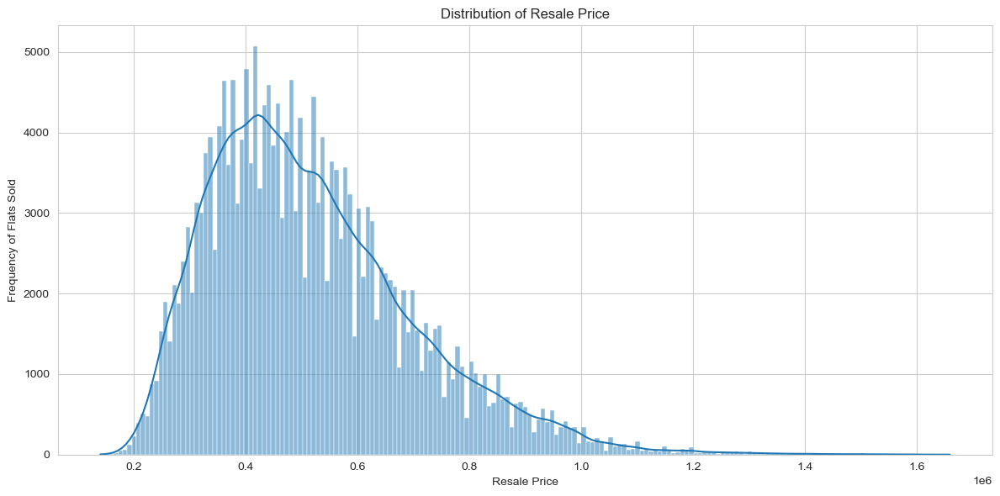

In [33]:
# Resale price distribution
fig, ax = plt.subplots(figsize=plot_fig_size)  


sns.set_style('whitegrid')
sns.histplot(data=df, x='resale_price', kde=True, ax=ax)

ax.set_title('Distribution of Resale Price')
ax.set_xlabel('Resale Price')
ax.set_ylabel('Frequency of Flats Sold')

plt.tight_layout()
plt.show()

In [34]:
# display the statistical summary of the resale price
df['resale_price'].describe()

count    2.107820e+05
mean     5.176226e+05
std      1.828416e+05
min      1.400000e+05
25%      3.800000e+05
50%      4.850000e+05
75%      6.200000e+05
max      1.658888e+06
Name: resale_price, dtype: float64

In [35]:
# Compute interquartile range of resale price
q1, q3 = df['resale_price'].quantile([0.25, 0.75])
resale_price_iqr = q3 - q1
print(f'The interquartile range of resale price is {resale_price_iqr:,.2f}. It ranges from {q1:,.2f} to {q3:,.2f}. ')

The interquartile range of resale price is 240,000.00. It ranges from 380,000.00 to 620,000.00. 


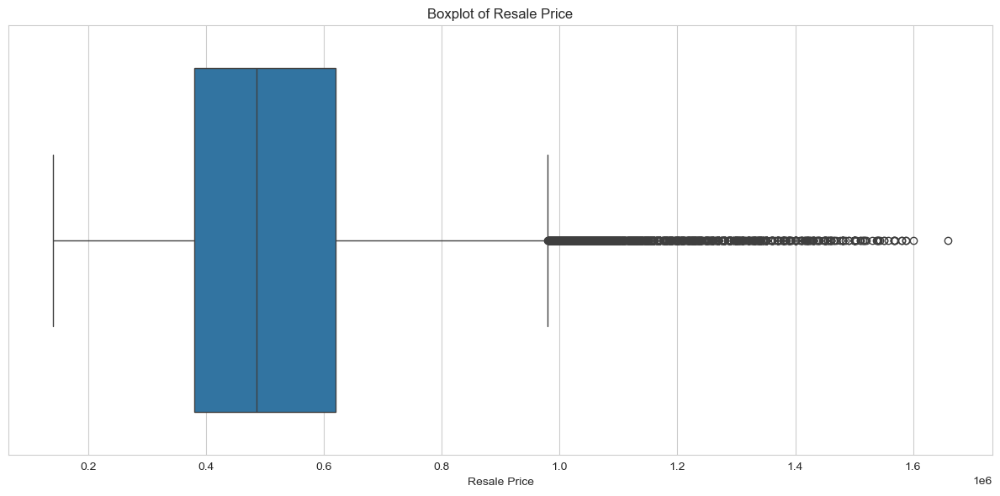

In [36]:
# boxplot the distribution of the resale price
fig, ax = plt.subplots(figsize=plot_fig_size)  

sns.boxplot(data=df, x='resale_price', vert=False)

ax.set_title('Boxplot of Resale Price')
ax.set_xlabel('Resale Price')

plt.tight_layout()
plt.show()

**The mean resale price is approximately $516K, while the median is about $485K. Transaction prices range from roughly $140K to $1.65M. The distribution is slightly right-skewed, indicating a tail of higher-priced flats. Lower-priced units cluster more tightly around the median. A standard deviation of about $182K shows how much prices typically deviate from the mean. Since IQR = Q3 – Q1 = 620 000 – 380 000 = SGD 240 000, the central half of resale-flat transactions falls within a $240 k band. In other words, the "middle 50 %" of prices lie between $380 k and $620 k.**

### Skewness Analysis

In [37]:
# Compute skewness of resale price
skewness = df['resale_price'].skew()
print(f"Skewness of Resale Price: {skewness:.2f}")
if skewness > 0.5: # type: ignore[arg-type]
    print("The distribution is positively skewed.")
elif skewness < -0.5: # type: ignore[arg-type]
    print("The distribution is negatively skewed.")
else:
    print("The distribution is approximately symmetric.")

# Compute kurtosis of resale price
kurtosis = df['resale_price'].kurt()
print(f"Kurtosis of Resale Price: {kurtosis:.2f}")
if kurtosis > 3: # type: ignore[arg-type]
    print("The distribution is leptokurtic.")
elif kurtosis < 3: # type: ignore[arg-type]
    print("The distribution is platykurtic.")
else:
    print("The distribution is mesokurtic.")

Skewness of Resale Price: 0.94
The distribution is positively skewed.
Kurtosis of Resale Price: 1.14
The distribution is platykurtic.


**Based on a skewness of 0.95, the HDB resale-price distribution is moderately right-skewed, indicating some high-price outliers are pulling the mean above the median. Although below 1.0, this skewness can still affect models that assume normal residuals, so we should check residual plots (e.g., residuals vs. fitted, Q–Q) and consider a log or Box–Cox transformation if needed.**

**With a kurtosis of 1.15 (< 3), the distribution is platykurtic, meaning it’s flatter-topped with thinner tails than a normal curve—there are less extreme values since the tail is thinner than those under Gaussian assumptions**

**Together, these measures reveal a fairly even spread of resale prices with a moderate right tail. For predictive modeling, we recommend running residual diagnostics and experimenting with a log(price) transform or robust regression techniques to ensure our assumptions hold.**

https://www.investopedia.com/terms/p/platykurtic.asp#:~:text=The%20term%20%22platykurtic%22%20refers%20to,extreme%20positive%20or%20negative%20events.

### Outliers Analysis

In [38]:
# outliers detection using IQR 
resale_price_iqr_q1 = df['resale_price'].quantile(0.25)
resale_price_iqr_q3 = df['resale_price'].quantile(0.75)

resale_price_iqr_outliers_left = df[(df['resale_price'] < resale_price_iqr_q1 - 1.5 * resale_price_iqr)]
print(f'The number of outliers (IQR) in the left distribution of resale price is {len(resale_price_iqr_outliers_left)}')
resale_price_iqr_outliers_right = df[(df['resale_price'] > resale_price_iqr_q3 + 1.5 * resale_price_iqr)]
print(f'The number of outliers (IQR) in the right distribution of resale price is {len(resale_price_iqr_outliers_right)}')

resale_price_iqr_outliers = pd.concat([resale_price_iqr_outliers_left,resale_price_iqr_outliers_right], ignore_index=True, axis=0)
print(f'The total number of outliers (IQR) in the resale price is {len(resale_price_iqr_outliers)}')

# percentage of outliers in the resale price
resale_price_iqr_outliers_percentage = len(resale_price_iqr_outliers) / len(df) * 100
print(f'Total number of transactions is {len(df)}')
print(f'The percentage of outliers (IQR) in the resale price is {resale_price_iqr_outliers_percentage:.2f}%')

The number of outliers (IQR) in the left distribution of resale price is 0
The number of outliers (IQR) in the right distribution of resale price is 3738
The total number of outliers (IQR) in the resale price is 3738
Total number of transactions is 210782
The percentage of outliers (IQR) in the resale price is 1.77%


In [39]:
# outliers detection using Z-score
resale_price_z_score = (df['resale_price'] - df['resale_price'].mean()) / df['resale_price'].std()
resale_price_z_score_threshold = 3
resale_price_z_score_outliers_left = df[resale_price_z_score < np.negative(resale_price_z_score_threshold)]
print(f'The number of outliers (z-score) in the left distribution of resale price is {len(resale_price_z_score_outliers_left)}')
resale_price_z_score_outliers_right = df[resale_price_z_score > resale_price_z_score_threshold]
print(f'The number of outliers (z-score) in the right distribution of resale price is {len(resale_price_z_score_outliers_right)}')

resale_price_z_score_outliers = pd.concat([resale_price_z_score_outliers_left, resale_price_z_score_outliers_right], axis=0, ignore_index=True)
print(f'The total number of outliers (z-score) in the resale price is {len(resale_price_z_score_outliers)}')

# percentage of outliers in the resale price
resale_price_z_score_outliers_percentage = len(resale_price_z_score_outliers) / len(df) * 100
print(f'Total number of transactions is {len(df)}')
print(f'The percentage of outliers (z-score) in the resale price is {resale_price_z_score_outliers_percentage:.2f}%')

The number of outliers (z-score) in the left distribution of resale price is 0
The number of outliers (z-score) in the right distribution of resale price is 1791
The total number of outliers (z-score) in the resale price is 1791
Total number of transactions is 210782
The percentage of outliers (z-score) in the resale price is 0.85%


**Using IQR method, there are 1.74% of transactions lie beyond 1.5 times of the third quartiles, so extreme HDB resale prices are fairly uncommon but not very rare.**

**Using z-score method, there are 0.84% of transactions lie beyond +3 $\sigma$. Compared to a Gaussian distribution, where 0.27% of data lies beyond ±3 σ, this 0.84% indicates a heavier right tail than expected under normal assumptions, suggesting the presence of significant high-value transactions, despite the overall platykurtic nature of the distribution (which implies thinner tails in general compared to a normal curve).** 

**The reason, z-score method detect less outliers because extreme values impacted its means and standard deviation. With elevated means and standard deviation, z-score method is only able to detect very extreme values. In a skewed distribution, the better method is using IQR method, as it is less sensitive to outliers. We will be adopting the percentage of outliers as 1.74% based on IQR method.**

In [40]:
# Descriptive statistics of outliers
print("Descriptive statistics of detected outliers:")
print(resale_price_iqr_outliers['resale_price'].describe())

Descriptive statistics of detected outliers:
count    3.738000e+03
mean     1.099328e+06
std      1.166306e+05
min      9.800880e+05
25%      1.010000e+06
50%      1.060000e+06
75%      1.150000e+06
max      1.658888e+06
Name: resale_price, dtype: float64


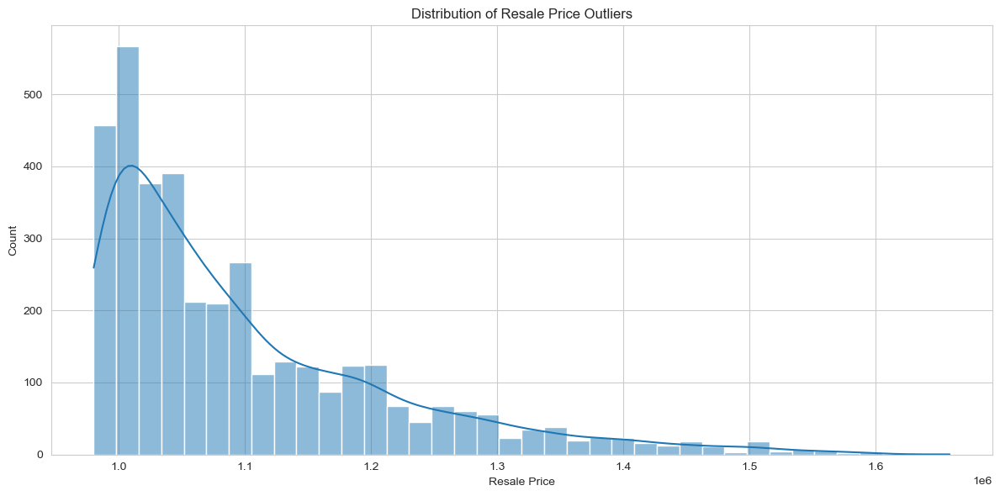

In [41]:
# plot the distribution of the outliers of resale price
fig, ax = plt.subplots(figsize=plot_fig_size)  

sns.histplot(data=resale_price_iqr_outliers, x='resale_price', kde=True)


ax.set_title('Distribution of Resale Price Outliers')
ax.set_xlabel('Resale Price')

plt.tight_layout()
plt.show()

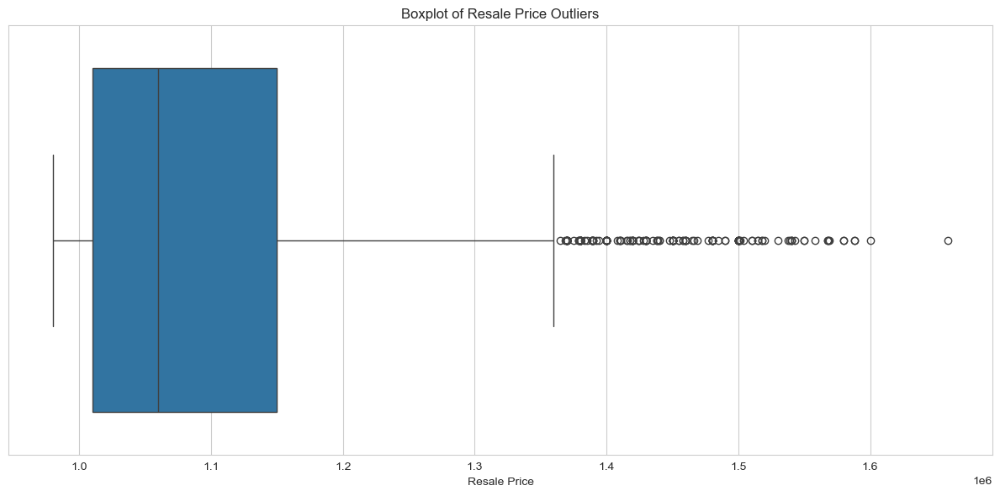

In [42]:
# boxplot the distribution of the outliers of resale price
fig, ax = plt.subplots(figsize=plot_fig_size)  

sns.boxplot(data=resale_price_iqr_outliers, x='resale_price', vert=False)


ax.set_title('Boxplot of Resale Price Outliers')
ax.set_xlabel('Resale Price')

plt.tight_layout()
plt.show()

**Even among the 3,643 detected outliers, the distribution of resale prices is right-skewed (mean $1.098M vs. median $1.06M). This indicates that within this outlier segment, there are still a few significantly higher-value transactions that exert disproportional influence on this segment's mean and standard deviation.**

**These most extreme transactions within the outlier group are the ones that will have the greatest impact on the overall mean and standard deviation of the full HDB resale price dataset.** 

#### Million Dollar Flats by Year (Outliers in Layman Conext)

In [43]:
# Extract resale price that is more than 1 million 
million_dollars_flats = df[df['resale_price'] >= 1000000].copy()
million_dollars_flats['month'] = pd.to_datetime(million_dollars_flats['month'])

# add year column 
million_dollars_flats['year'] = million_dollars_flats['month'].dt.year


# print the number of flats with resale price above 1 million
print(f"Number of flats with resale price with 1 million and above: {len(million_dollars_flats)}")

# calculate the percentage of high resale price flats against total flats
high_price_percentage = (len(million_dollars_flats) / len(df)) * 100
print(f"Percentage of flats with resale price above 1 million: {high_price_percentage:.2f}%") 

Number of flats with resale price with 1 million and above: 3218
Percentage of flats with resale price above 1 million: 1.53%


In [44]:
# Group by year and count the number of flats with resale price above 1 million
# excluding 2025
million_dollars_flats_by_year = million_dollars_flats.groupby('year').size()
million_dollars_flats_by_year


year
2017      46
2018      71
2019      64
2020      82
2021     259
2022     369
2023     468
2024    1035
2025     824
dtype: int64

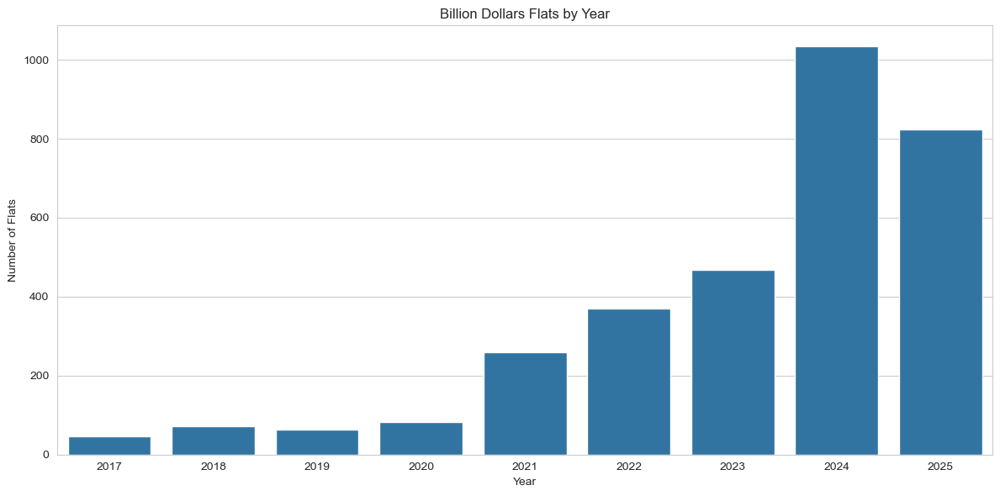

In [45]:
# plot the million dollars flats by year
fig, ax = plt.subplots(figsize=plot_fig_size)


sns.barplot(x=million_dollars_flats_by_year.index, y=million_dollars_flats_by_year.values)

ax.set_title('Billion Dollars Flats by Year')
ax.set_xlabel('Year')
ax.set_ylabel('Number of Flats')


plt.tight_layout()
plt.show()


In [46]:
million_dollars_flats.loc[million_dollars_flats['resale_price'].sort_values(ascending=False).index]

,month,town,flat_type,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,year
205379,2025-06-01,QUEENSTOWN,5 ROOM,22 TO 24,122.0,Premium Apartment Loft,2016,89 years 11 months,1658888.0,2025
209050,2025-01-01,TOA PAYOH,5 ROOM,19 TO 21,117.0,DBSS,2012,86 years 06 months,1600000.0,2025
174503,2024-06-01,BUKIT MERAH,5 ROOM,34 TO 36,112.0,Improved,2016,90 years 08 months,1588000.0,2024
174551,2024-06-01,BUKIT MERAH,5 ROOM,46 TO 48,113.0,Improved,2019,94 years,1588000.0,2024
200256,2025-06-01,CENTRAL AREA,5 ROOM,34 TO 36,105.0,Type S2,2011,84 years 08 months,1580000.0,2025
...,...,...,...,...,...,...,...,...,...,...
201307,2025-01-01,GEYLANG,4 ROOM,13 TO 15,93.0,Model A,2020,94 years 06 months,1000000.0,2025
8210,2017-06-01,BISHAN,5 ROOM,19 TO 21,120.0,DBSS,2011,93 years 03 months,1000000.0,2017
103001,2021-07-01,QUEENSTOWN,5 ROOM,10 TO 12,104.0,Premium Apartment,2016,94 years 02 months,1000000.0,2021
138878,2022-03-01,TOA PAYOH,5 ROOM,25 TO 27,110.0,Improved,2009,86 years 02 months,1000000.0,2022


Base on the outliers analysis above, we have the following strategies:

**Method 1 : Transform the target (or rely on Huber regression)**

Apply a log or Box-Cox transform so resale prices approximate a normal distribution. This stabilizes variance and usually trims RMSE, but back-transforming compresses the right tail, so million-dollar flats are systematically under-predicted. Skipping the transform and fitting a Huber regressor instead keeps the target in dollars while down-weighting extreme residuals via its piece-wise (quadratic ↦ linear) loss.

<sub>Refs: Box & Cox 1964; Huber 1964.</sub>

**Method 2 : Winsorise the most extreme outliers**

Cap, rather than delete, the top (say) 0.5 % of sale prices at the 99.5th percentile. Our leverage plot shows a handful of points far beyond the main tail; capping them removes their undue influence while preserving rank information.

<sub>Ref: Tukey 1962.</sub>

**Method 3: Segment the market and fit specialized models**

Train a classifier that flags "premium-location" transactions (e.g. postal code, distance to CBD). Fit separate regressors for the luxury and mainstream segments, then stack or blend their predictions. The luxury regressor can learn high-end drivers (view corridor, penthouse level) that a single global model would treat as noise.

<sub>Ref: Breiman 1996, “Stacked Regressions”.</sub>

**Method 4: Quantile regression**

Minimize the pinball loss at chosen quantiles (e.g. 50th, 90th). Because the method doesn’t assume Gaussian errors, it is naturally robust to heavy tails and produces prediction intervals without bootstrapping.

<sub>Ref: Koenker & Bassett 1978.</sub>

**Tree-based ensembles (Random Forest, Gradient Boosting, XGBoost/LightGBM)**

Decision trees split on features, so a handful of ultra-high prices are isolated in tiny terminal nodes instead of skewing every split. Ensembles average (Random Forest) or stage-wise correct (GBM) those trees, giving high bias-variance control and built-in outlier tolerance.

Pros:
- Capture complex non-linearities and interactions without manual feature engineering.
- Handle heterogeneous variance (“price heteroskedasticity”) gracefully.

Cons:
- Still optimize squared-error inside each leaf, so extreme targets inside the same leaf can inflate loss; tune max_depth and min_samples_leaf to avoid this.
- Feature importance can be biased toward high-cardinality categorical splits; apply permutation importance or SHAP to audit.

<sub>Refs: Breiman 2001 (Random Forest); Friedman 2001 (GBM); Chen & Guestrin 2016 (XGBoost); Ke et al. 2017 (LightGBM).</sub>

**Since the resale price is skewed, a robust model is a right candidate. However, we need further analysis on the features and we also need to perform bivariate and multivariate analysis to collect more evidence. If only the target is skewed, we may adopt transformation instead of a robust model.**

## Feature Analysis (Univariate)

In [47]:
numerical_columns

Index(['floor_area_sqm', 'lease_commence_date', 'resale_price'], dtype='object')

In [48]:
numerical_features = numerical_columns[:2]
numerical_features

Index(['floor_area_sqm', 'lease_commence_date'], dtype='object')

In [49]:
def plot_numerical_column(df: pd.DataFrame, each_column: str):
    """    Feature Analysis of Numerical Columns
    """
    print('========================================')
    print('Feature Analysis of', each_column)
    print('========================================')
    print(df[each_column].describe())

    # plot the distribution of the column
    fig, ax = plt.subplots(figsize=plot_fig_size) 
    sns.histplot(data=df, x=each_column, kde=True)
    
    ax.set_title(f'Distribution of {each_column}')
    ax.set_xlabel(each_column)
    ax.set_ylabel('Frequency')
    plt.show()

    # Compute skewness of floor_area_sqm
    skewness = df[each_column].skew()
    print(f"Skewness of {each_column}: {skewness:.2f}")
    if skewness > 0.5: # type: ignore[arg-type]
        print("The distribution is positively skewed.")
    elif skewness < -0.5: # type: ignore[arg-type]
        print("The distribution is negatively skewed.")
    else:
        print("The distribution is approximately symmetric.")

    # Compute kurtosis of resale price
    kurtosis = df[each_column].kurt()
    print(f"Kurtosis of {each_column}: {kurtosis:.2f}")
    if kurtosis > 3: # type: ignore[arg-type]
        print("The distribution is leptokurtic.")
    elif kurtosis < 3: # type: ignore[arg-type]
        print("The distribution is platykurtic.")
    else:
        print("The distribution is mesokurtic.")
    


#### Numerical Feature Column: Floor Area (square meters)

Feature Analysis of floor_area_sqm
count    210782.000000
mean         96.860812
std          24.038202
min          31.000000
25%          82.000000
50%          93.000000
75%         112.000000
max         366.700000
Name: floor_area_sqm, dtype: float64


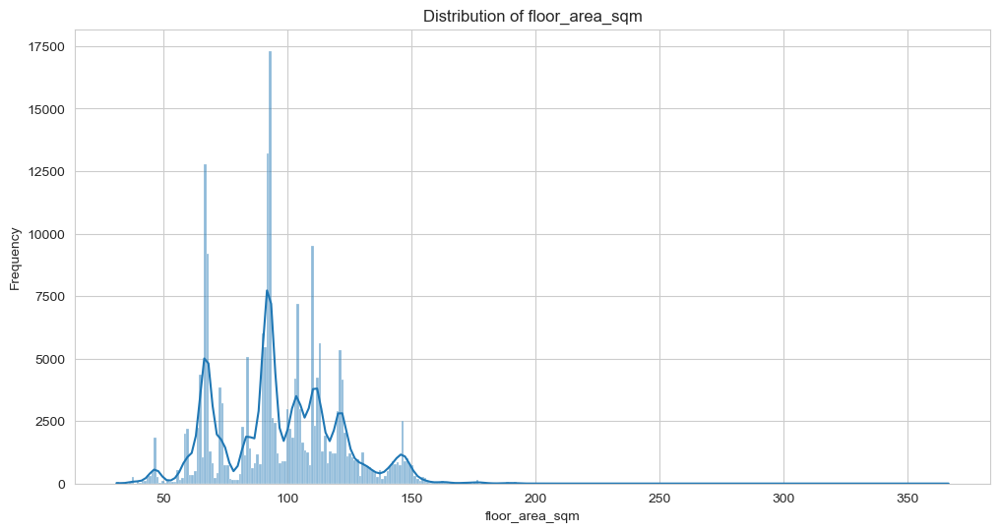

Skewness of floor_area_sqm: 0.26
The distribution is approximately symmetric.
Kurtosis of floor_area_sqm: 0.01
The distribution is platykurtic.


In [50]:
plot_numerical_column(df, 'floor_area_sqm')

**While the skewness of `floor_area_sqm` is low at 0.26, statistically suggesting an approximately symmetric distribution, visual inspection of the data reveals a long extension to the very right, with a maximum value of 366.7 sqm significantly higher than the 75th percentile of 112 sqm.**

**The relatively low skewness, despite this visible right tail, is likely due to the bulk of the distribution being quite symmetric around its central tendency, thus tempering the overall skewness metric. Furthermore, the likely multimodal nature of floor_area_sqm (reflecting distinct HDB flat types/sizes, such as 3-room, 4-room, 5-room, and executive flats) also contributes to lowering the aggregate skewness.**

**For linear regression models, we will not apply a direct transformation to floor_area_sqm based on its low overall skewness. However, we will carefully examine residual plots to ensure assumptions of linearity and homoscedasticity hold, as the long right tail and distinct modes could still subtly influence model behavior.**

**Conversely, tree-based models (such as Random Forest or Gradient Boosting) are inherently well-suited to handle multimodal feature distributions without requiring explicit transformations. Their ability to make splits based on thresholds allows them to naturally segment and learn from distinct peaks in the data.**

#### Numerical Feature Column: Lease Commence Date

Feature Analysis of lease_commence_date
count    210782.000000
mean       1996.336770
std          14.241823
min        1966.000000
25%        1985.000000
50%        1996.000000
75%        2011.000000
max        2022.000000
Name: lease_commence_date, dtype: float64


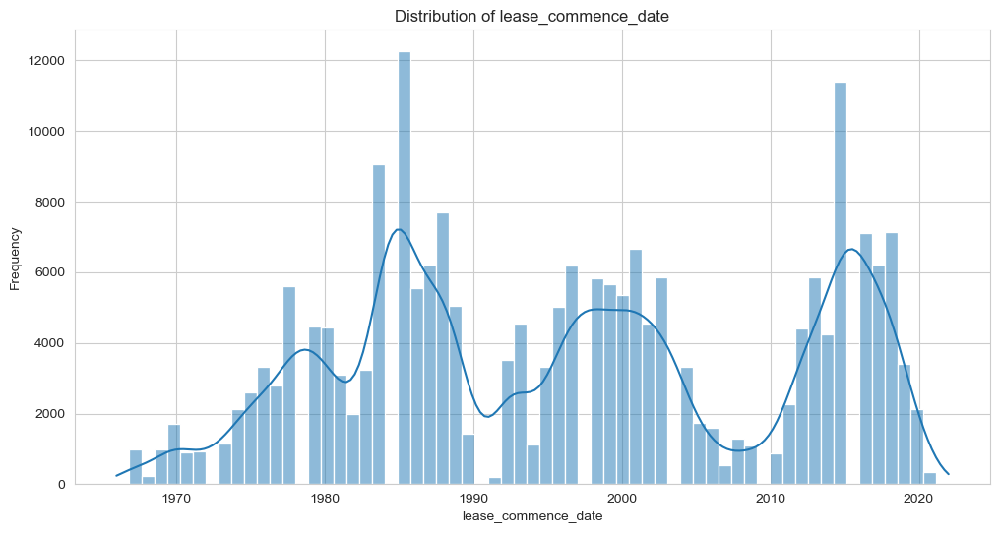

Skewness of lease_commence_date: 0.07
The distribution is approximately symmetric.
Kurtosis of lease_commence_date: -1.17
The distribution is platykurtic.


In [51]:
plot_numerical_column(df, 'lease_commence_date')

**Skewness of `lease_commerce_date` is low at 0.07, suggesting an symmetric distribution. Visual inspection of the chart reveals a multimodal distributions.**

**We will consider tree-based models (such as Random Forest or Gradient Boosting) are inherently well-suited to handle multimodal feature distributions.**

### Categorical Columns

In [52]:
categorical_columns

Index(['month', 'town', 'flat_type', 'storey_range', 'flat_model',
       'remaining_lease'],
      dtype='object')

In [53]:
def plot_categorical_column(df: pd.DataFrame, column_name: str, rare_threshold: float = 0.01): # 0.01 (1%) is the default threshold for rare values
    """
    Display the statistics of the column
    Countplot of the column sorted by the value counts with highest value counts on top (horizontal view)
    Value counts sorted by the value counts with weights in percentage
    """
    # Display the column name
    print('========================================')
    print(column_name)
    print('--------------------------------')

    # Display the statistics of the column
    print(f'{column_name} describe:')
    print(df[column_name].describe())

    print('--------------------------------')
    # countplot of the column sorted by the value counts with highest value counts on top
    fig, ax = plt.subplots(figsize=plot_fig_size)  

    sns.set_style("whitegrid")
    sns.countplot(data=df, y=column_name, order=df[column_name].value_counts().index)

    ax.set_title(f'Count of {column_name}')
    ax.set_xlabel('Count')
    ax.set_ylabel(column_name)
    ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation = 90)

    plt.tight_layout()
    plt.show()

    # Display the value counts with percentage
    value_counts = df[column_name].value_counts(dropna=False)
    value_counts_percentage = value_counts/len(df[column_name])
    value_count_rare_df = pd.DataFrame({
        "value_count"   : value_counts,
        "percent" : value_counts_percentage
    })
    value_count_rare_df["is_rare"] = value_count_rare_df["percent"] < rare_threshold

    print('--------------------------------')
    print(f'Rare threshold of {rare_threshold * 100}%')
    print(value_count_rare_df)
    print('========================================')

#### Categorical Feature Column: Month

month
--------------------------------
month describe:
count      210782
unique        103
top       2024-07
freq         3036
Name: month, dtype: object
--------------------------------


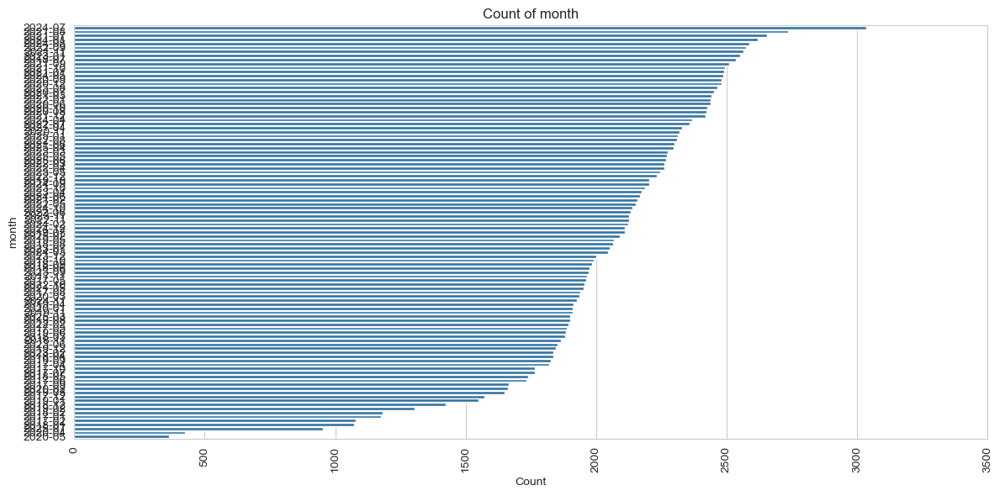

--------------------------------
Rare threshold of 1.0%
         value_count   percent  is_rare
month                                  
2024-07         3036  0.014404    False
2021-08         2735  0.012975    False
2021-07         2655  0.012596    False
2024-01         2620  0.012430    False
2024-08         2588  0.012278    False
...              ...       ...      ...
2017-02         1080  0.005124     True
2018-01         1072  0.005086     True
2025-07          952  0.004517     True
2020-04          423  0.002007     True
2020-05          363  0.001722     True

[103 rows x 3 columns]


In [54]:
plot_categorical_column(df,'month')

**The feature `month`, need to convert to datetime format. However, ML models could not interpret datetime, therefore we need to convert them to numerical features in `transaction_year` and `transaction_month`. We will use `transaction_year` as ordinal numerical features. For `transaction_month`, this is seasonal, therefore we can either use one-hot encoding or cyclic sine/cosine pair (two columns that preserve the circular nature).**

**To simplified feature engineering, we will use one-hot encoding for `transaction_month`.**

In [55]:
def convert_month_to_year_month(df: pd.DataFrame, 
                              month: str = 'month',
                              transaction_year: str = 'transaction_year',
                              transaction_month: str = 'transaction_month') -> pd.DataFrame:
    """
    Convert month column to separate year and month columns.
    
    Parameters:
    -----------
    df : pd.DataFrame
        Input dataframe containing the month column
    month : str, default 'month'
        Name of the column containing month data
    transaction_year : str, default 'transaction_year'
        Name of the output year column
    month_out_col : str, default 'transaction_month'
        Name of the output month column
    
    Returns:
    --------
    pd.DataFrame
        Modified dataframe
    
    Raises:
    -------
    ValueError
        If month_col doesn't exist in the dataframe
    TypeError
        If df is not a pandas DataFrame
    """
    
    # Input validation
    if not isinstance(df, pd.DataFrame):
        raise TypeError("Input must be a pandas DataFrame")
    
    # Check if dataframe is empty
    if df.empty:
        warnings.warn("Input dataframe is empty", UserWarning)
        return df.copy()
    
    # Check if month column exists
    if month not in df.columns:
        raise ValueError(f"Column '{month}' not found in dataframe")
    
    # Work on copy
    df = df.copy()
    
    # Convert to datetime with error handling
    try:
        df[month] = pd.to_datetime(df[month], format='%Y-%m', errors='coerce')
    except (ValueError, TypeError) as e:
        raise ValueError(f"Cannot convert column '{month}' to datetime: {str(e)}")
    
    # Extract year and month
    df[transaction_year] = df[month].dt.year
    df[transaction_month] = df[month].dt.month
    
    # Return dataframe
    return df

In [56]:
# =============================================================================
# SIMPLE TESTS - Run these in your notebook
# =============================================================================

def test_basic_functionality():
    """Test that the function works with normal data"""
    # Create test data
    test_df = pd.DataFrame({
        'month': ['2023-01', '2023-02', '2023-03'],
        'value': [100, 200, 300]
    })
    
    # Run function
    result = convert_month_to_year_month(test_df)
    
    # Check results
    assert 'transaction_year' in result.columns
    assert 'transaction_month' in result.columns
    assert result['transaction_year'].tolist() == [2023, 2023, 2023]
    assert result['transaction_month'].tolist() == [1, 2, 3]
    
    print("✓ Basic functionality test passed!")


test_basic_functionality()

✓ Basic functionality test passed!


In [57]:

def test_different_date_formats():
    """Test with different date formats"""
    test_df = pd.DataFrame({
        'month': ['2023-01', '2023-02', '2023-03'],
        'value': [100, 200, 300]
    })
    
    result = convert_month_to_year_month(test_df)
    
    assert result['transaction_year'].iloc[0] == 2023
    assert result['transaction_month'].iloc[0] == 1
    
    print("✓ Different date formats test passed!")

test_different_date_formats()

✓ Different date formats test passed!


In [58]:

def test_with_nulls():
    """Test with null values"""
    test_df = pd.DataFrame({
        'month': ['2023-01', None, '2023-03'],
        'value': [100, 200, 300]
    })
    
    result = convert_month_to_year_month(test_df)
    
    # First and third rows should work
    assert result['transaction_year'].iloc[0] == 2023
    assert result['transaction_month'].iloc[0] == 1
    
    print("✓ Null values test passed!")

test_with_nulls()

✓ Null values test passed!


In [59]:
def test_original_unchanged():
    """Test that original dataframe is not modified"""
    original_df = pd.DataFrame({
        'month': ['2023-01', '2023-02'],
        'value': [100, 200]
    })
    
    # Store original state
    original_columns = original_df.columns.tolist()
    
    # Run function
    result = convert_month_to_year_month(original_df)
    
    # Check original is unchanged
    assert original_df.columns.tolist() == original_columns
    assert 'transaction_year' not in original_df.columns
    
    # Check result has new columns
    assert 'transaction_year' in result.columns
    
    print("✓ Original unchanged test passed!")

test_original_unchanged()

✓ Original unchanged test passed!


In [60]:
df = convert_month_to_year_month(df)

#### Categorical Feature Column: Town

town
--------------------------------
town describe:
count       210782
unique          26
top       SENGKANG
freq         17295
Name: town, dtype: object
--------------------------------


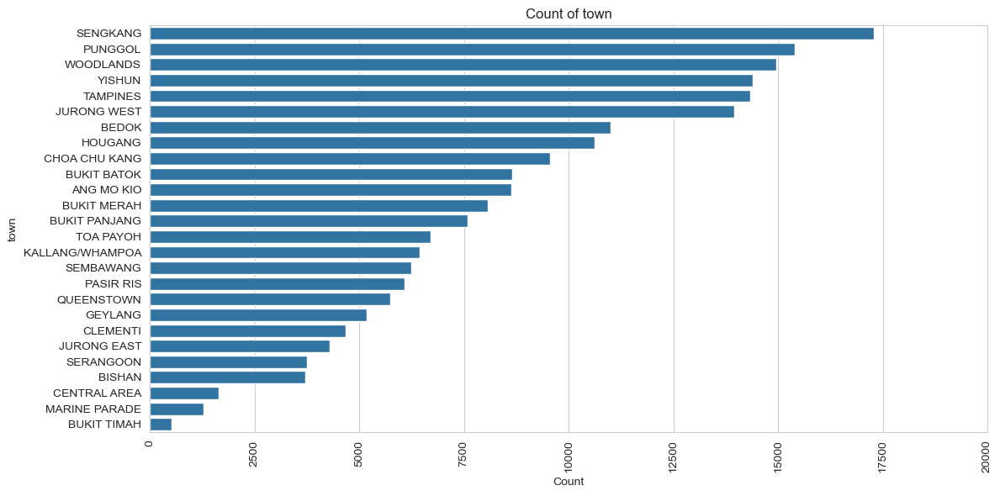

--------------------------------
Rare threshold of 1.0%
                 value_count   percent  is_rare
town                                           
SENGKANG               17295  0.082052    False
PUNGGOL                15399  0.073057    False
WOODLANDS              14959  0.070969    False
YISHUN                 14395  0.068293    False
TAMPINES               14339  0.068028    False
JURONG WEST            13949  0.066177    False
BEDOK                  11008  0.052225    False
HOUGANG                10619  0.050379    False
CHOA CHU KANG           9566  0.045383    False
BUKIT BATOK             8663  0.041099    False
ANG MO KIO              8629  0.040938    False
BUKIT MERAH             8070  0.038286    False
BUKIT PANJANG           7580  0.035961    False
TOA PAYOH               6710  0.031834    False
KALLANG/WHAMPOA         6444  0.030572    False
SEMBAWANG               6252  0.029661    False
PASIR RIS               6087  0.028878    False
QUEENSTOWN              5749  0.

In [61]:
plot_categorical_column(df,'town')

**The feature `town` has 26 unique values. Since town is a nominal categorical variable and not ordinal, we will use one-hot encoding. The top 3 towns with the highest transaction turnover are SENGKANG, PUNGGOL, and WOODLANDS.**

**The towns CENTRAL AREA, MARINE PARADE, and BUKIT TIMAH have transaction counts that are less than 1% of the total transactions. Due to their rare occurrence, these categories might potentially impact predictive power, particularly for models sensitive to sparsity. One option to address this could be to group these three towns into a single "RARE" or "PREMIUM" category to potentially improve predictive capabilities.**

**However, grouping them may distort valuable information if there are changes to the trends or characteristics of these specific towns in future data. Therefore, we have decided to keep all towns as separate categories with one-hot encoding. We will be using tree-based models, which are robust to rare categories and high-cardinality features, to handle these less frequent occurrences effectively.**

#### Categorical Feature Column: Flat type

flat_type
--------------------------------
flat_type describe:
count     210782
unique         7
top       4 ROOM
freq       89112
Name: flat_type, dtype: object
--------------------------------


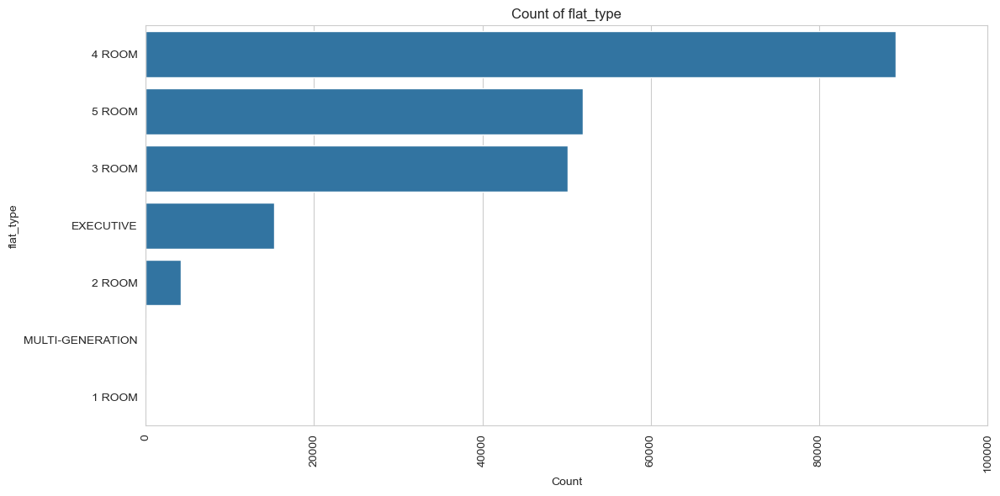

--------------------------------
Rare threshold of 1.0%
                  value_count   percent  is_rare
flat_type                                       
4 ROOM                  89112  0.422769    False
5 ROOM                  51888  0.246169    False
3 ROOM                  50179  0.238061    False
EXECUTIVE               15299  0.072582    False
2 ROOM                   4143  0.019655    False
MULTI-GENERATION           84  0.000399     True
1 ROOM                     77  0.000365     True


In [62]:
plot_categorical_column(df, 'flat_type')

**Analysis of `flat_type` Feature:**

**The `flat_type` feature contains 7 unique categories. The most popular resale flat types are 4 ROOM (42.27%), followed by 5 ROOM (24.63%) and 3 ROOM (23.80%), collectively accounting for the vast majority of transactions.**

**Given the inherent ordinality of flat types (e.g., 1-room, 2-room, 3-room, 4-room, 5-room, Executive, Multi-Generation typically representing increasing size), we may consider ordinal encoding for models that can leverage this ordered relationship, such as linear models.** 

**However, we discovered that there are exceptions and outliers in 3-room flat with floor area more than 200sqm. This is unusual. We found that during the 1960s, there are terrace flat model which are categorized as 3-room flat, these flats has very high floor area that are more than 200sqm. HDB has stop building such flat. Given the new information, we think that it is best to use one-hot encoding as it avoids assumptions about the linearity of the ordinal relationship.** 

**The MULTI-GENERATION and 1 ROOM flat types each represent less than 0.04% of total transactions, falling below our 1.0% rare threshold. We have decided not to group these sparse categories into an 'Other' type. This is because despite their rare occurrence, these specific flat types likely contain valuable and distinct information (e.g., 1-room flats typically being the smallest/lowest priced, and multi-generation flats being unique, large units). To effectively handle these rare occurrences and capture their potentially unique impact without distortion, we will rely on robust model-level smoothing provided by ensemble models (e.g., Random Forest, Gradient Boosting), which are well-suited for sparse categorical features.**

#### Categorical Feature Column: Storey Range

storey_range
--------------------------------
storey_range describe:
count       210782
unique          17
top       04 TO 06
freq         48405
Name: storey_range, dtype: object
--------------------------------


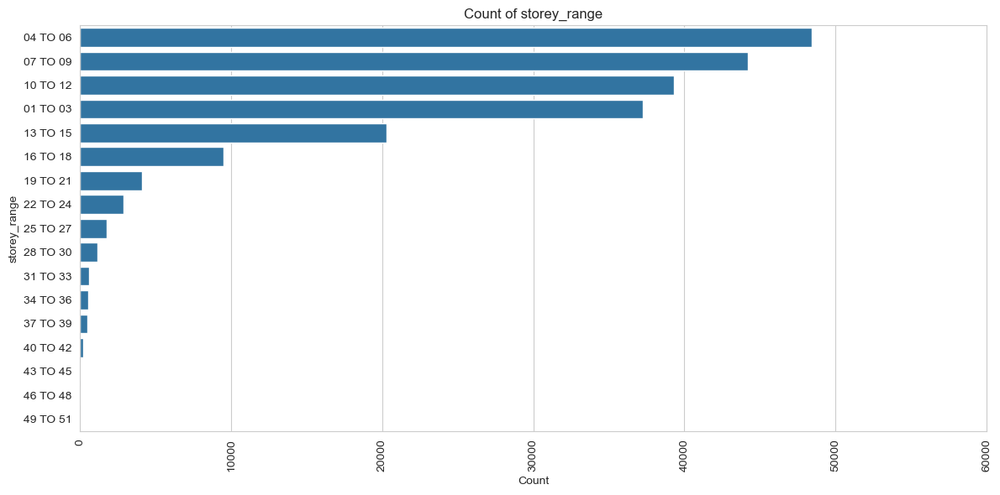

--------------------------------
Rare threshold of 1.0%
              value_count   percent  is_rare
storey_range                                
04 TO 06            48405  0.229645    False
07 TO 09            44184  0.209619    False
10 TO 12            39315  0.186520    False
01 TO 03            37258  0.176761    False
13 TO 15            20290  0.096261    False
16 TO 18             9474  0.044947    False
19 TO 21             4082  0.019366    False
22 TO 24             2862  0.013578    False
25 TO 27             1773  0.008412     True
28 TO 30             1144  0.005427     True
31 TO 33              626  0.002970     True
34 TO 36              558  0.002647     True
37 TO 39              463  0.002197     True
40 TO 42              220  0.001044     True
43 TO 45               65  0.000308     True
46 TO 48               45  0.000213     True
49 TO 51               18  0.000085     True


In [63]:
plot_categorical_column(df, 'storey_range')

**Given its ordinarity nature, we will convert the categories from string to numerical number. We do that by extracting the numerical number and take the average. For example, if storey range is from 7th floor to 9th floor. We will take the middle floor, 8th floor as the indicator.**

In [64]:
def convert_storey_range(storey_range):
    """
    Convert storey range to the numerical average.
    Args:
        storey_range in (str)

    Returns: 
        float

    Example:
        convert_storey_range('07 TO 09') -> 8.0 
    """

    low, high = storey_range.split(' TO ')
    average = (int(low) + int(high)) / 2
    return average

In [65]:
def test_convert_storey_range():
    """Test cases for convert_storey_range function"""
    
    # Basic test case from the example
    assert convert_storey_range('07 TO 09') == 8.0
    
    # Test with single digits
    assert convert_storey_range('1 TO 3') == 2.0
    assert convert_storey_range('5 TO 7') == 6.0
    
    # Test with same storey (no range)
    assert convert_storey_range('05 TO 05') == 5.0
    assert convert_storey_range('10 TO 10') == 10.0
    
    # Test with larger ranges
    assert convert_storey_range('01 TO 05') == 3.0
    assert convert_storey_range('10 TO 20') == 15.0
    
    # Test with double digits
    assert convert_storey_range('12 TO 16') == 14.0
    assert convert_storey_range('25 TO 35') == 30.0
    
    # Test with leading zeros
    assert convert_storey_range('01 TO 03') == 2.0
    assert convert_storey_range('08 TO 12') == 10.0
    
    # Test odd ranges (result should be .5)
    assert convert_storey_range('1 TO 2') == 1.5
    assert convert_storey_range('10 TO 11') == 10.5
    
    # Test with higher floors
    assert convert_storey_range('50 TO 60') == 55.0
    assert convert_storey_range('99 TO 101') == 100.0

    print("All test cases passed!")


test_convert_storey_range()

All test cases passed!


In [66]:

def test_convert_storey_range_edge_cases():
    """Test edge cases and potential error scenarios"""
    
    # Test ground floor scenarios
    assert convert_storey_range('0 TO 2') == 1.0
    assert convert_storey_range('00 TO 01') == 0.5
    
    # Test with mixed formatting
    assert convert_storey_range('5 TO 15') == 10.0
    assert convert_storey_range('02 TO 8') == 5.0

    print("All edge case tests passed!")

test_convert_storey_range_edge_cases()

All edge case tests passed!


In [67]:

import pytest
def test_convert_storey_range_errors():
    """Test error handling scenarios"""
    
    # Test invalid format (should raise ValueError)
    with pytest.raises(ValueError):
        convert_storey_range('invalid format')
    
    with pytest.raises(ValueError):
        convert_storey_range('5-7')  # Wrong separator
    
    with pytest.raises(ValueError):
        convert_storey_range('5 TO')  # Missing high value
    
    with pytest.raises(ValueError):
        convert_storey_range('TO 7')  # Missing low value
    
    # Test non-numeric values
    with pytest.raises(ValueError):
        convert_storey_range('A TO B')
    
    with pytest.raises(ValueError):
        convert_storey_range('1 TO B')

    print("All error handling tests passed!")

test_convert_storey_range_errors()

All error handling tests passed!


In [68]:

# Alternative test format using unittest if you prefer
import unittest

class TestConvertStoreyRange(unittest.TestCase):
    
    def test_basic_functionality(self):
        """Test basic functionality"""
        self.assertEqual(convert_storey_range('07 TO 09'), 8.0)
        self.assertEqual(convert_storey_range('1 TO 3'), 2.0)
        self.assertEqual(convert_storey_range('10 TO 20'), 15.0)
        print("Basic functionality test passed!")
    
    def test_same_storey(self):
        """Test when low and high are the same"""
        self.assertEqual(convert_storey_range('05 TO 05'), 5.0)
        self.assertEqual(convert_storey_range('10 TO 10'), 10.0)
        print("Same storey test passed!")
    
    def test_decimal_results(self):
        """Test cases that result in decimal values"""
        self.assertEqual(convert_storey_range('1 TO 2'), 1.5)
        self.assertEqual(convert_storey_range('10 TO 11'), 10.5)
        print("Decimal results test passed!")
    
    def test_invalid_input(self):
        """Test invalid input handling"""
        with self.assertRaises(ValueError):
            convert_storey_range('invalid')
        with self.assertRaises(ValueError):
            convert_storey_range('A TO B')
        print("Invalid input test passed!")


unit_test = TestConvertStoreyRange()
unit_test.test_basic_functionality()
unit_test.test_same_storey()
unit_test.test_decimal_results()
unit_test.test_invalid_input()

Basic functionality test passed!
Same storey test passed!
Decimal results test passed!
Invalid input test passed!


In [69]:
df.storey_range = df.storey_range.apply(convert_storey_range)
df.storey_range

0         11.0
1          2.0
2          2.0
3          5.0
4          2.0
          ... 
211081     5.0
211082     5.0
211083     5.0
211084     5.0
211085     2.0
Name: storey_range, Length: 210782, dtype: float64

In [70]:
df.storey_range.describe()

count    210782.000000
mean          8.759700
std           5.935456
min           2.000000
25%           5.000000
50%           8.000000
75%          11.000000
max          50.000000
Name: storey_range, dtype: float64

**This feature column has been convert as numerical columns as it contains ordinality and we can take the average as the reference indicator.**

#### Categorical Feature Column: Flat Model

flat_model
--------------------------------
flat_model describe:
count      210782
unique         21
top       Model A
freq        74858
Name: flat_model, dtype: object
--------------------------------


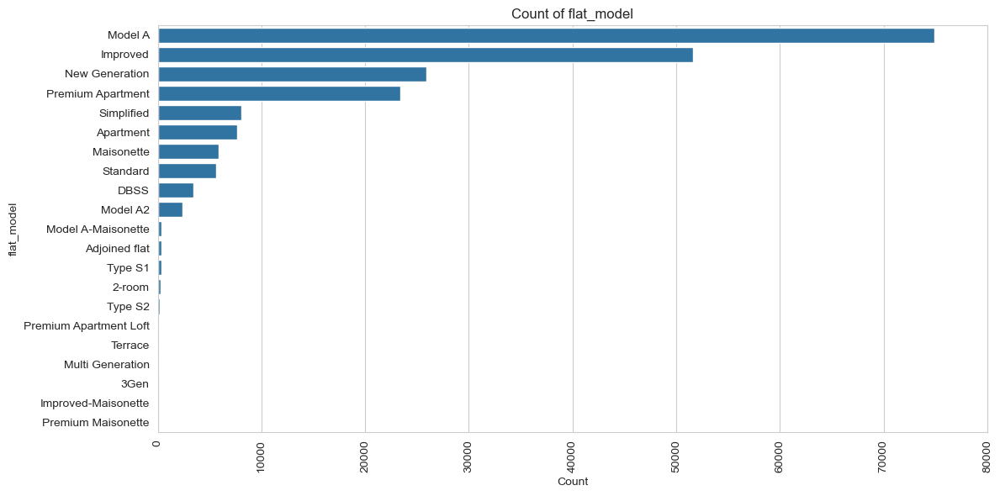

--------------------------------
Rare threshold of 1.0%
                        value_count   percent  is_rare
flat_model                                            
Model A                       74858  0.355144    False
Improved                      51605  0.244826    False
New Generation                25902  0.122885    False
Premium Apartment             23373  0.110887    False
Simplified                     8074  0.038305    False
Apartment                      7676  0.036417    False
Maisonette                     5859  0.027796    False
Standard                       5665  0.026876    False
DBSS                           3409  0.016173    False
Model A2                       2393  0.011353    False
Model A-Maisonette              373  0.001770     True
Adjoined flat                   360  0.001708     True
Type S1                         343  0.001627     True
2-room                          299  0.001419     True
Type S2                         178  0.000844     True
Premium A

In [71]:
plot_categorical_column(df, 'flat_model')

**There are more sparse categories, however, each categories contains its unique information which maybe helpful in differentiating between different type of flats with different model and its different pricing. We will use one-hot encoding since there is no ordinarity in this feature.**

**Examples:**

- Maisonette and Premium Maisonette are duplex units.
- DBSS (Design, Build and Sell Scheme) flats were built by private developers and often have condo-like features.
- Terrace flats are the specific, large 3-room flats build in the 1960s.
- Multi Generation and 3Gen are specific multi-generational living units.

**These are not just "rare" in frequency but "rare" in their type and market position. Grouping them into an "Other" category would likely lead to a significant loss of valuable information.**

**We will be using tree-based ensemble model to handle the sparsity of the features.**

#### Categorical Feature Column: Remaining Lease

remaining_lease
--------------------------------
remaining_lease describe:
count                 210782
unique                   690
top       94 years 10 months
freq                    1861
Name: remaining_lease, dtype: object
--------------------------------


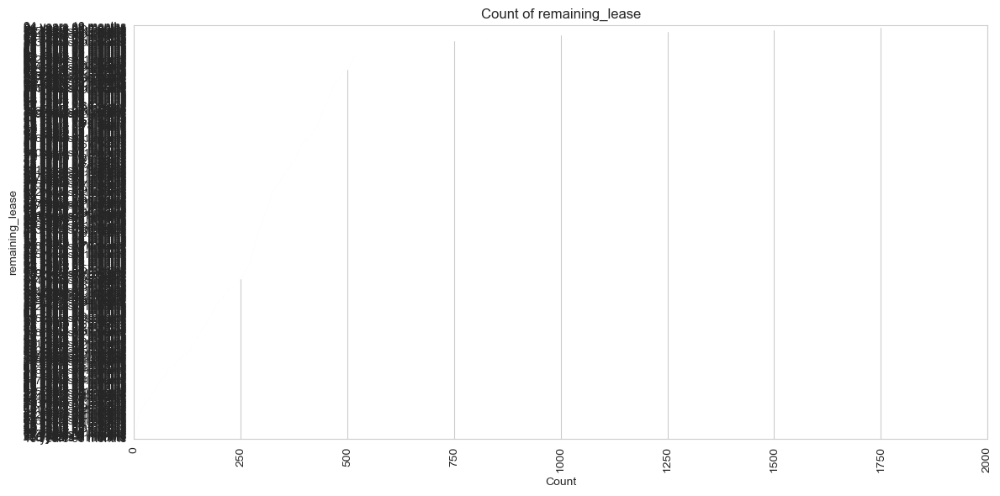

--------------------------------
Rare threshold of 1.0%
                    value_count   percent  is_rare
remaining_lease                                   
94 years 10 months         1861  0.008829     True
94 years 09 months         1835  0.008706     True
94 years 11 months         1809  0.008582     True
94 years 08 months         1700  0.008065     True
94 years 07 months         1603  0.007605     True
...                         ...       ...      ...
97 years 07 months            1  0.000005     True
95 years 0 months             1  0.000005     True
66 years 0 months             1  0.000005     True
40 years 01 month             1  0.000005     True
40 years 05 months            1  0.000005     True

[690 rows x 3 columns]


In [72]:
plot_categorical_column(df, 'remaining_lease')

**With 690 categories, we consider this feature has high cardinality. Thus we will convert this feature from string to numerical column. We will convert the remaining lease into a new column `remaining_lease_by_month`. We will convert the years into months and add to the remaining months. For example, `94 years 10 months` will be converted to 1138 months.**

In [73]:
def convert_lease_to_month(lease):
    """
    Convert remaining lease period from string to total number of months.
    Args:
        remaining_lease in (str)

    Returns: 
        integer

    Example:
        convert_lease_to_month('07 TO 09') -> 8.0  
    """
    str_list = lease.split(' ')
    if ('months' in str_list) | ('month' in str_list):
        year = int(str_list[0])
        month = int(str_list[2])
        t_month = (year * 12) + month 
    elif ('years' in str_list) & (('months' not in str_list) | ('month' not in str_list)):
        year = int(str_list[0])
        t_month = (year * 12)
    else:
        year = int(str_list[0])
        t_month = (year * 12)        
    return t_month

In [74]:

def test_convert_lease_to_month_simple():
    """Simple test cases for convert_lease_to_month function"""
    
    # Test years and months format
    assert convert_lease_to_month('5 years 6 months') == 66  # 5*12 + 6 = 66
    assert convert_lease_to_month('2 years 3 months') == 27  # 2*12 + 3 = 27
    assert convert_lease_to_month('1 years 0 months') == 12  # 1*12 + 0 = 12
    
    # Test years only format
    assert convert_lease_to_month('10 years') == 120  # 10*12 = 120
    assert convert_lease_to_month('5 years') == 60    # 5*12 = 60
    assert convert_lease_to_month('1 years') == 12    # 1*12 = 12
    
    # Test with singular 'month'
    assert convert_lease_to_month('3 years 1 month') == 37   # 3*12 + 1 = 37
    assert convert_lease_to_month('0 years 1 month') == 1    # 0*12 + 1 = 1
    
    # Test just numbers (should default to years)
    assert convert_lease_to_month('5') == 60    # 5*12 = 60
    assert convert_lease_to_month('2') == 24    # 2*12 = 24
    print("All simple test cases passed!")

test_convert_lease_to_month_simple()

All simple test cases passed!


In [75]:

def test_convert_lease_to_month_variations():
    """Test various input formats"""
    
    # Test different plural/singular combinations
    assert convert_lease_to_month('1 year 1 month') == 13    # Should work if 'year' -> 'years'
    assert convert_lease_to_month('10 years 11 months') == 131  # 10*12 + 11 = 131
    
    # Test zero cases
    assert convert_lease_to_month('0 years 6 months') == 6   # 0*12 + 6 = 6
    assert convert_lease_to_month('0 years') == 0      
    print("All variations test cases passed!")

test_convert_lease_to_month_variations()

All variations test cases passed!


In [76]:
df['remaining_lease_by_month'] = df.remaining_lease.apply(convert_lease_to_month)

In [77]:
df['remaining_lease_by_month'].describe()

count    210782.000000
mean        892.319121
std         169.953663
min         481.000000
25%         752.000000
50%         890.000000
75%        1064.000000
max        1173.000000
Name: remaining_lease_by_month, dtype: float64

**By converting this feature from string with year and months into numerical months, we can better manage this feature and this feature column also carry important information of the remaining live of a flat that may impacted the resale price.**

## Bivariate Analysis: Feature vs Target

In [78]:
# capture updated numerical and categorical columns
numerical_columns = df.select_dtypes(include=['number']).columns
categorical_columns = df.select_dtypes(include=['object']).columns  
temporal_columns = df.select_dtypes(include=['datetime']).columns

In [79]:
numerical_columns

Index(['storey_range', 'floor_area_sqm', 'lease_commence_date', 'resale_price',
       'transaction_year', 'transaction_month', 'remaining_lease_by_month'],
      dtype='object')

In [80]:
categorical_columns

Index(['town', 'flat_type', 'flat_model', 'remaining_lease'], dtype='object')

In [81]:
temporal_columns

Index(['month'], dtype='object')

In [82]:
numerical_features = numerical_columns.drop('resale_price')
numerical_features

Index(['storey_range', 'floor_area_sqm', 'lease_commence_date',
       'transaction_year', 'transaction_month', 'remaining_lease_by_month'],
      dtype='object')

In [83]:
target = 'resale_price'

### Numerical Bivariate Analysis  

In [84]:
def plot_numerical_features_with_target(df: pd.DataFrame,
                                        numerical_column: str,
                                        target: str = "resale_price"):
    """
    Extended numeric-vs-target EDA:
    • scatter + LOWESS smooth
    • regplot with linear fit
    • Pearson & Spearman correlations
    • residual plot (checks homoskedasticity / curvature)
    • optional log-target & price-per-sqm transforms
    """

    # ---------- 0. header ----------
    print("="*80)
    print(f"Feature: {numerical_column}   ↔   Target: {target}")
    print("="*80)

    # ---------- 1. scatter + LOWESS ----------
    # Create scatter plot with LOWESS smooth
    # Note: LOWESS is a non-parametric regression method that fits a smooth curve to the data.
    # It is useful for visualizing the relationship between two variables, especially when the relationship is not linear.
    # This is particularly useful for detecting non-linear relationships and outliers.
    fig, ax = plt.subplots(figsize=plot_fig_size)
    sns.scatterplot(data=df, x=numerical_column, y=target, alpha=0.25, ax=ax)

    # LOWESS curve (locally-weighted regression)
    # Note: LOWESS is a non-parametric regression method that fits a smooth curve to the data.
    # It is useful for visualizing the relationship between two variables, especially when the relationship is not linear.
    # This is particularly useful for detecting non-linear relationships and outliers.
    # frac=0.3 means 30% of the data is used to fit each point of the curve.
    # return_sorted=True returns the sorted values of the LOWESS fit.
    lowess = sm.nonparametric.lowess
    lo = lowess(df[target], df[numerical_column], frac=0.3, return_sorted=True)
    ax.plot(lo[:, 0], lo[:, 1], lw=2, label="LOWESS", color='orange')
    ax.set_title(f"{numerical_column} vs {target} with LOWESS")
    ax.legend()
    plt.tight_layout()
    plt.show()

    # ---------- 2. regplot (linear fit) ----------
    # Create a regression plot with a linear fit
    # Note: regplot is a convenience function that combines scatter plot and linear regression fit.
    # It is useful for visualizing the relationship between two variables and the linear fit.
    # The scatter_kws and line_kws parameters are used to customize the appearance of the scatter plot and the regression line.
    # scatter_kws={"alpha": 0.15}
    # line_kws={"lw": 2} sets the line width of the regression line
    fig, ax = plt.subplots(figsize=plot_fig_size)
    sns.regplot(data=df, x=numerical_column, y=target,
                scatter_kws={"alpha": 0.15},
                line_kws={"lw": 2, "color":'orange'}, ax=ax)
    ax.set_title(f"Linear fit of {target} on {numerical_column}")
    plt.tight_layout()
    plt.show()

    # ---------- 3. Residual plot ----------
    # Create a residual plot to check for homoskedasticity and curvature
    # Note: A residual plot shows the residuals (errors) of a regression model against the predicted values.
    # It is useful for checking the assumptions of linear regression, such as homoskedasticity (constant variance of errors) and linearity.
    # A well-behaved residual plot should show no patterns, indicating that the model is appropriate for the data.
    # The lowess=True parameter adds a LOWESS smooth line to the residuals.
    # scatter_kws={"alpha": 0.2} sets the transparency of the scatter points.
    # ax = plt.figure(figsize=(8, 5)).add_subplot(111)
    fig, ax = plt.subplots(figsize=plot_fig_size)
    sns.residplot(data=df, x=numerical_column, y=target,
                  lowess=True, scatter_kws={"alpha": 0.2}, line_kws={'color':'orange'} , ax=ax)
    ax.set_title(f"Residuals: {target} ~ {numerical_column}")
    plt.tight_layout()
    plt.show()

    # ---------- 4. Correlation metrics ----------
    pearson_r, pearson_p = st.pearsonr(df[numerical_column], df[target])
    spearman_r, spearman_p = st.spearmanr(df[numerical_column], df[target], nan_policy="omit")

    print(f"Pearson r = {pearson_r:.3f}  (p={pearson_p:.3g})")
    print(f"Spearman ρ = {spearman_r:.3f}  (p={spearman_p:.3g})")

    # ---------- 5. Simple transform checks ----------
    # A. Log-target
    if (df[target] > 0).all():
        df["_log_price"] = np.log(df[target])
        log_corr = df[[numerical_column, "_log_price"]].corr(method="pearson").iloc[0, 1]
        print(f"Pearson r vs log({target}) = {log_corr:.3f}")

    print("")  # spacer


In [85]:
numerical_features

Index(['storey_range', 'floor_area_sqm', 'lease_commence_date',
       'transaction_year', 'transaction_month', 'remaining_lease_by_month'],
      dtype='object')

#### Numerical Feature Column: Storey Range with HDB Resale Price

Since this is a new feature after feature engineering, we do a simple univariate analysis. 

Feature Analysis of storey_range
count    210782.000000
mean          8.759700
std           5.935456
min           2.000000
25%           5.000000
50%           8.000000
75%          11.000000
max          50.000000
Name: storey_range, dtype: float64


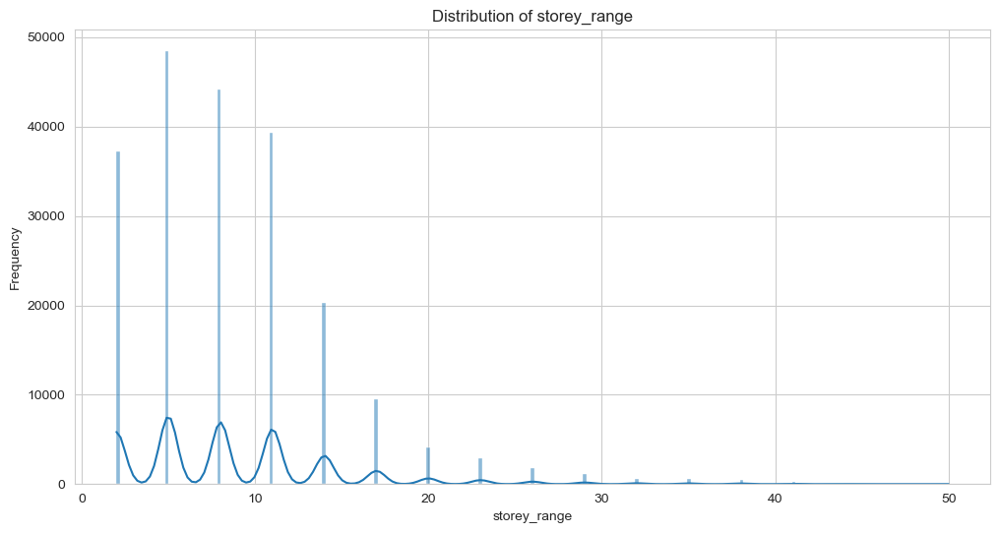

Skewness of storey_range: 1.60
The distribution is positively skewed.
Kurtosis of storey_range: 4.46
The distribution is leptokurtic.


In [86]:
plot_numerical_column(df, 'storey_range')

**The distribution is highly skewed because the is not much high floor flats in the market. The charts also shows multimodal. Kurtosis of 4.46 shows that the distribution is leptokurtic. All these characteristics suggesting that linear model is not a good candidate since the tree-based model can handle skewed data, multimodal distribution and leptokurtic.** 

Feature: storey_range   ↔   Target: resale_price


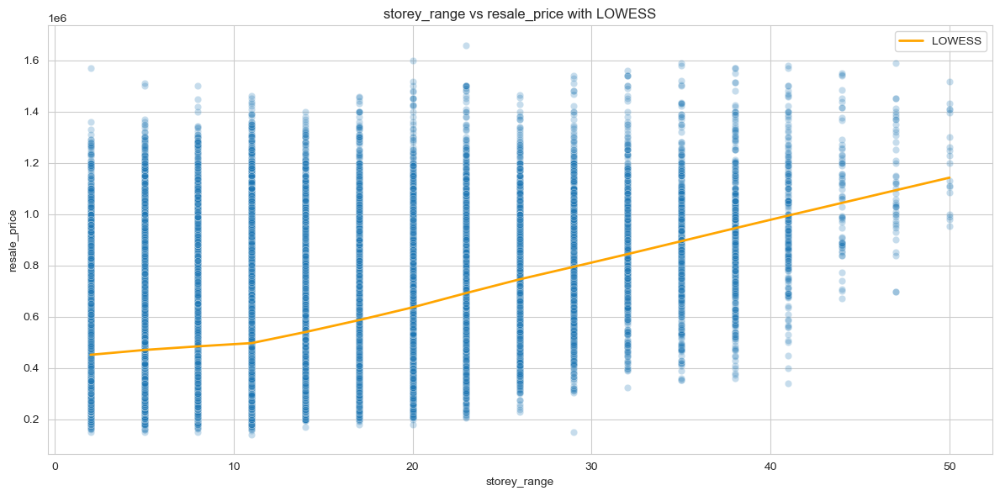

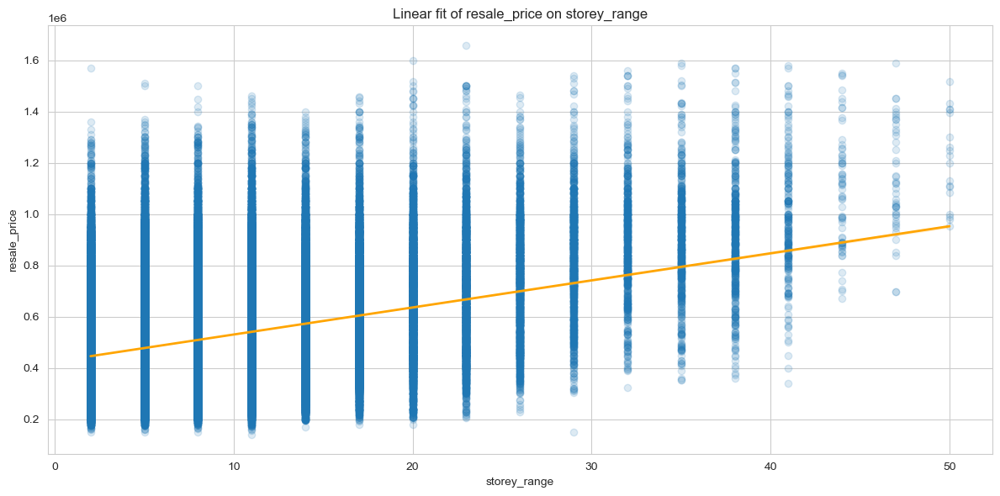

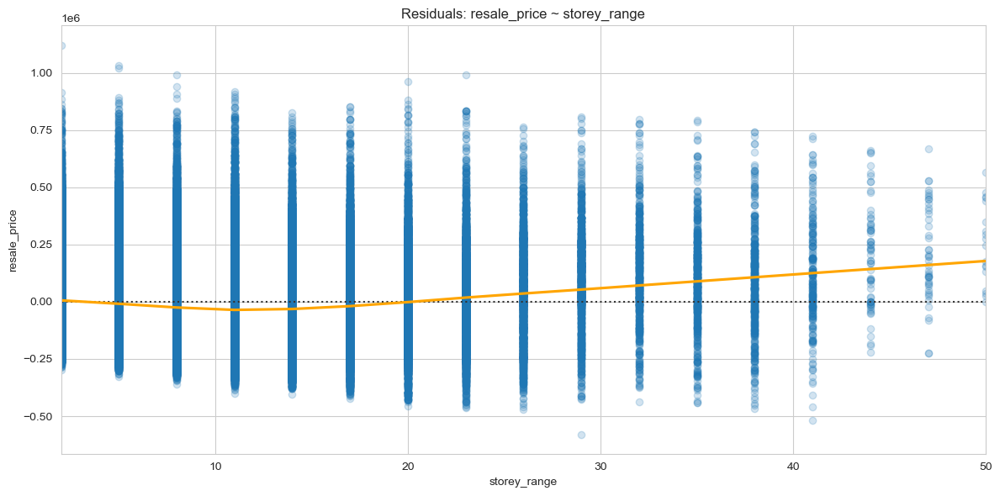

Pearson r = 0.343  (p=0)
Spearman ρ = 0.248  (p=0)
Pearson r vs log(resale_price) = 0.316



In [87]:
plot_numerical_features_with_target(df, 'storey_range')

**Storey range displays a moderate positive association with resale price (Pearson r ≈ 0.34, explaining ~12 % of variance). LOWESS exposes a clear kink above the 10th floor—prices climb much faster once the “view premium” kicks in. The residual plot confirms the straight‑line model under‑fits this curvature. While residual spread widens slightly with height, non‑linearity is the main violation; heteroskedasticity is present but mild.**

**Given the strong evidence of univariate analysis which shows that this distribution is highly skewed, leptokurtic and multimodal. It strong support us to adaopt a tree based mode. A tree‑based model is the right next step because its splits naturally capture this kink without extra feature engineering.**

#### Numerical Feature Column: Floor Area Square Meter with HDB Resale Price

Feature: floor_area_sqm   ↔   Target: resale_price


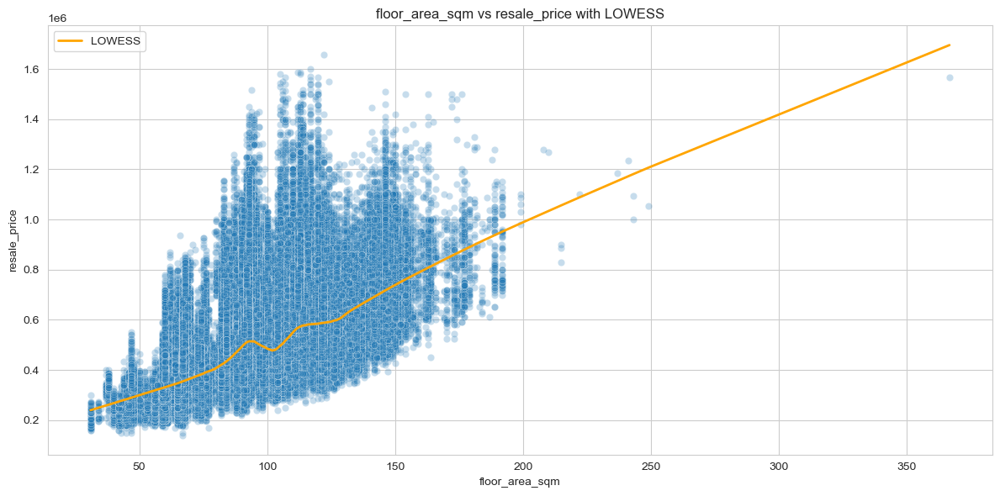

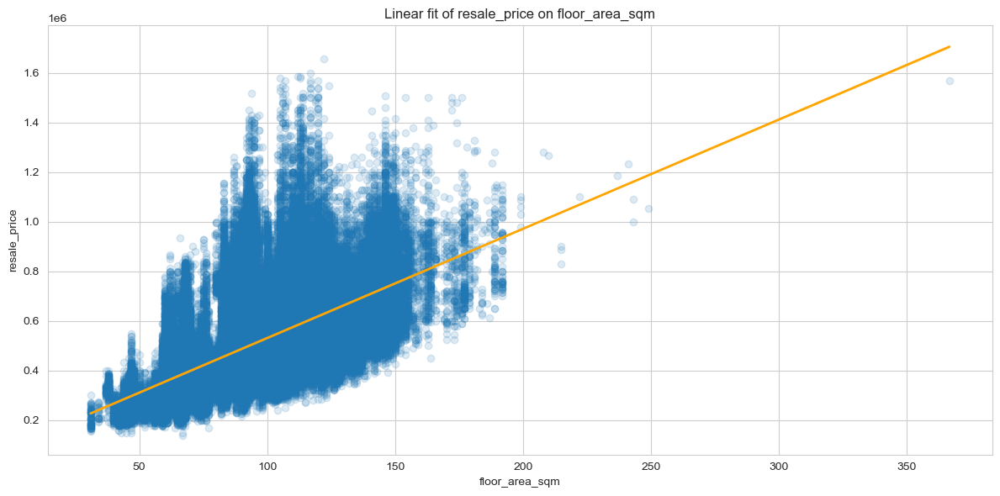

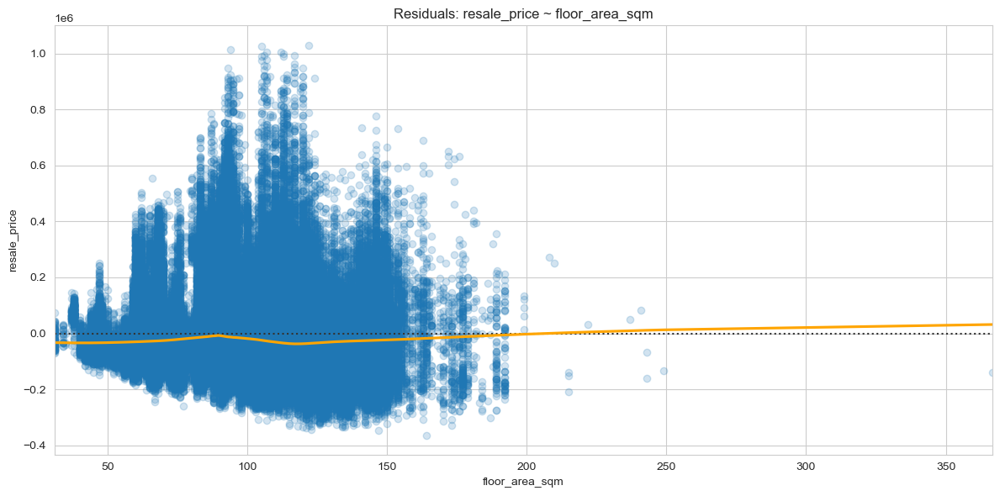

Pearson r = 0.579  (p=0)
Spearman ρ = 0.616  (p=0)
Pearson r vs log(resale_price) = 0.623



In [88]:
plot_numerical_features_with_target(df, 'floor_area_sqm')

**Floor area is the single most informative numeric feature so far (Pearson 0.58 ≈ 34 % R²). The LOWESS curve shows a three‑phase pattern—rapid price gains for very small flats, a plateau around mid‑sizes, then a near‑linear climb for ≥ 130 sqm. Log‑transforming price tightens the linear fit. Residual curvature below 120 sqm indicate we’re missing non‑linear terms.**

**Floor area exhibits the strongest linear signal (r ≈ 0.58), but LOWESS and residuals reveal distinct curvature and flat‑type clustering. We’ll therefore opt for a tree‑based model, which can absorb this non‑linearity alongside similar effects in other features without additional manual transforms.**

#### Numerical Feature Column: Lease Commence Date with HDB Resale Price

Feature: lease_commence_date   ↔   Target: resale_price


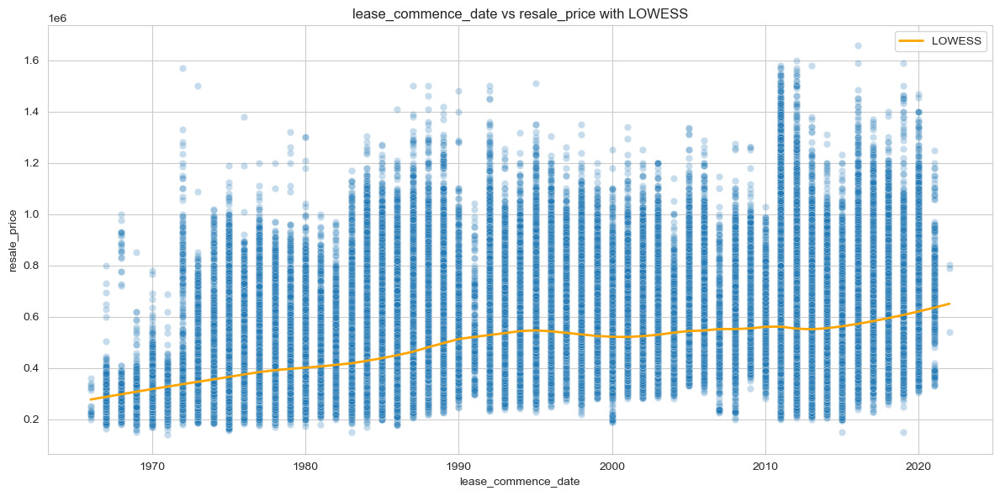

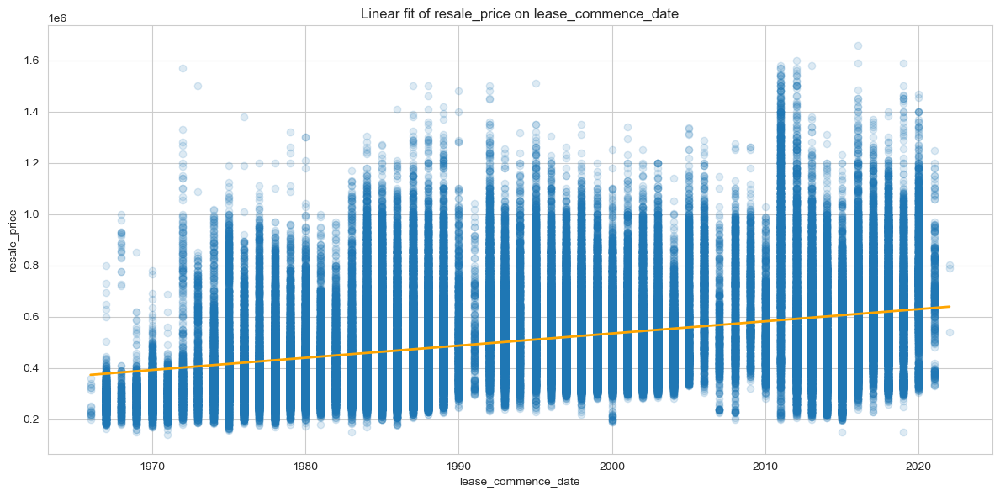

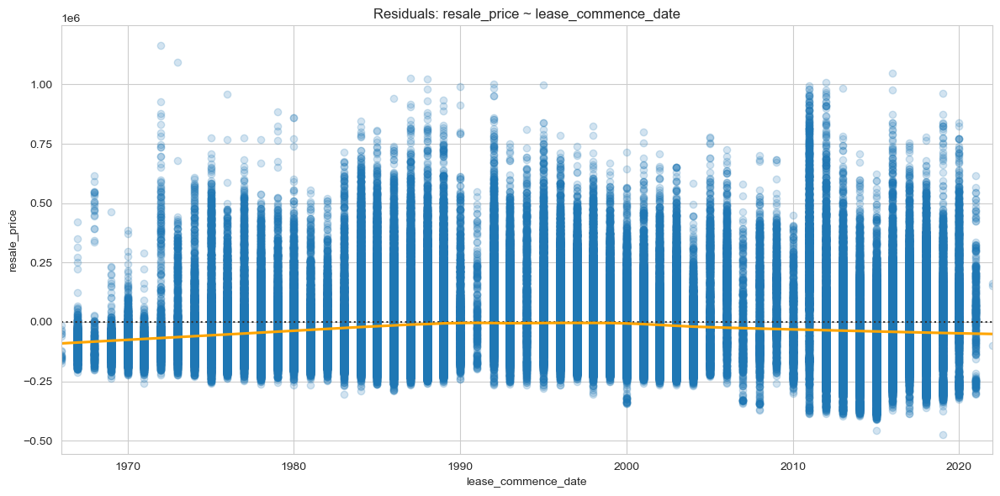

Pearson r = 0.369  (p=0)
Spearman ρ = 0.412  (p=0)
Pearson r vs log(resale_price) = 0.408



In [89]:
# plot numerical_features with target
plot_numerical_features_with_target(df, 'lease_commence_date')

**The variable is multimodal discover during univariate analysis. LOWESS curve shows mild fluctuation indicating gentle non‑linearity.  In residual plot, LOWESS below 0 for the oldest (pre‑1980) and newest (post‑2010) flats, this means that linear model over‑predicts these eras. Pearson corelation (r = 0.37) indicate moderate corelation. Higher Spearman of 0.41 indicate monotonic relationship but not linear. Correlation with log transformation on target improve slightly. The pattern still contains kinks and interactions, so we will proceed with a tree‑based ensemble model.**

#### Numerical Feature Column: Transaction Year with HDB Resale Price

**We will be analyzing transaction year together with our temporal features.**

#### Numerical Feature Column: Transaction Month with HDB Resale Price

**We will be analyzing transaction year together with our temporal features.**

#### Numerical Feature Column: Remaining Lease by Month with HDB Resale Price

Feature Analysis of remaining_lease_by_month
count    210782.000000
mean        892.319121
std         169.953663
min         481.000000
25%         752.000000
50%         890.000000
75%        1064.000000
max        1173.000000
Name: remaining_lease_by_month, dtype: float64


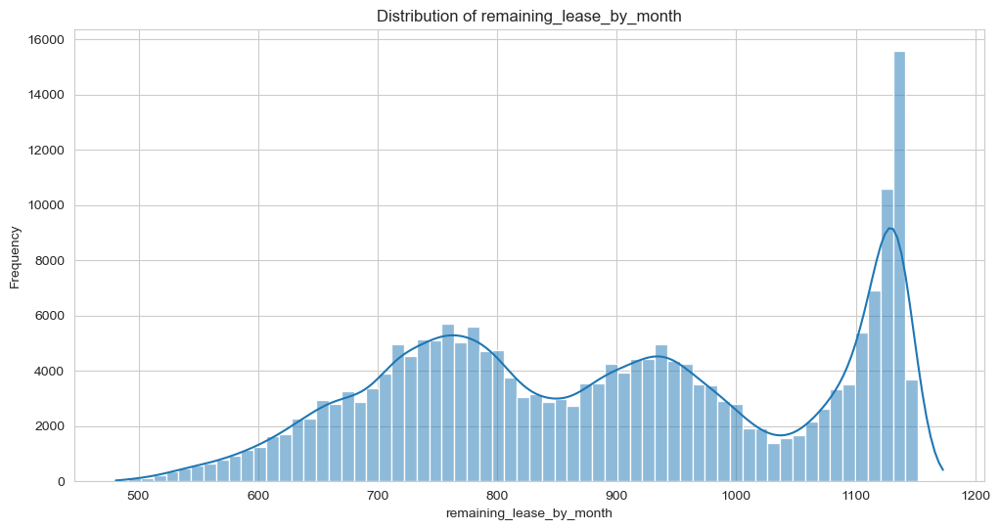

Skewness of remaining_lease_by_month: -0.02
The distribution is approximately symmetric.
Kurtosis of remaining_lease_by_month: -1.17
The distribution is platykurtic.


In [90]:
plot_numerical_column(df, 'remaining_lease_by_month')

**The skewness of -0.02 is telling us that the distribution is symmetry with a slight left skewed. However visual inspection tell us that the chart is multimodal and thus reducing the skewness. The very high peak in for newer home shows that there are more supply for newer homes. The kurtosis indicating that the distribution is platykurtic, indicating that there are fewer outliers and the distribution are more concentrated. We should consider tree-based model that could handle multimodal distribution well.**

Feature: remaining_lease_by_month   ↔   Target: resale_price


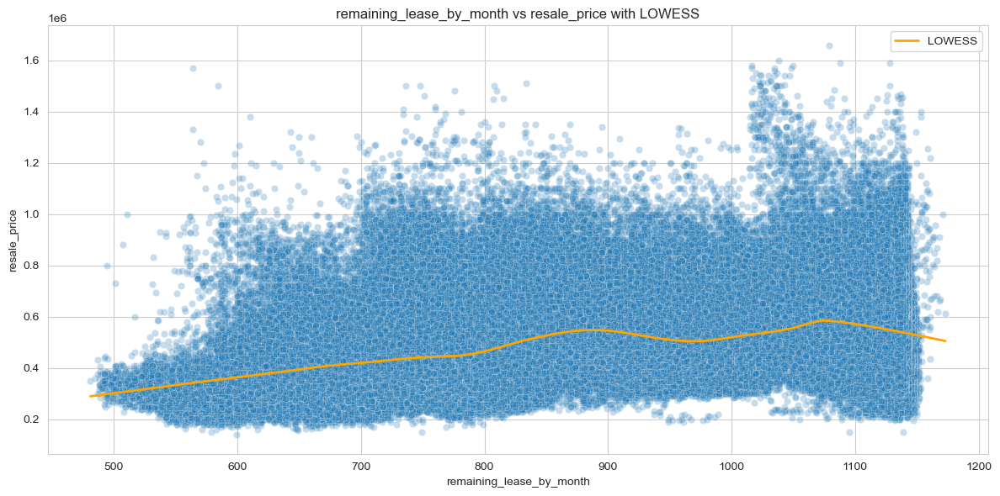

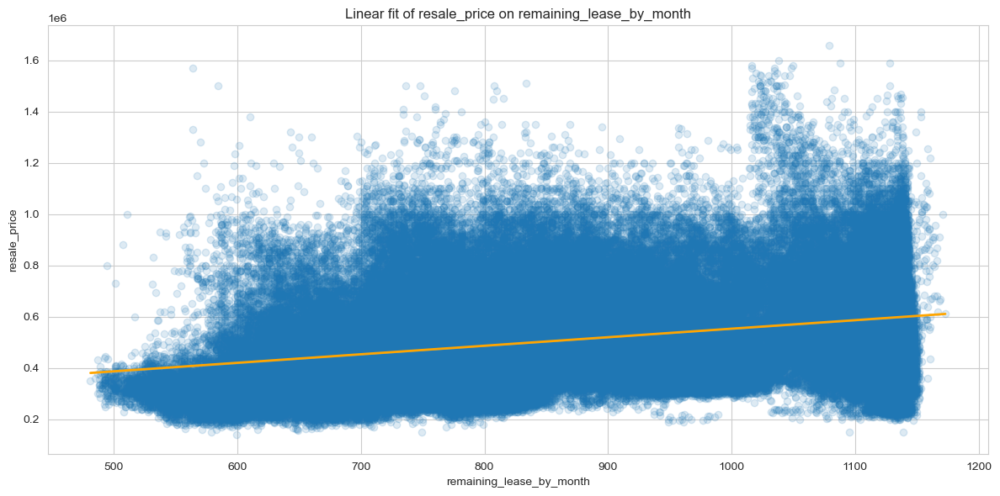

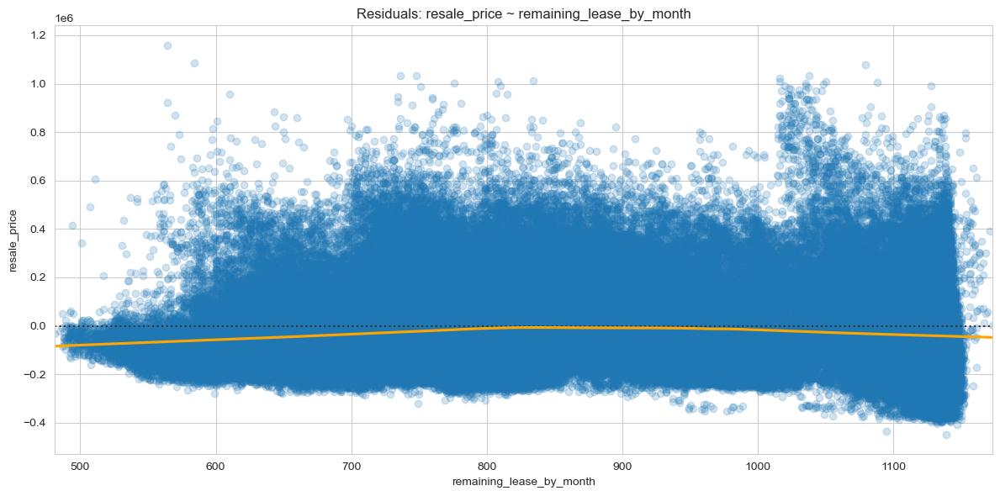

Pearson r = 0.309  (p=0)
Spearman ρ = 0.334  (p=0)
Pearson r vs log(resale_price) = 0.345



In [91]:
plot_numerical_features_with_target(df, 'remaining_lease_by_month')

**LOWESS was linear for older flats that has less than 700 months of remaining lease (approx 58 years). After that the LOWESS line become wavy indicating a non linear trends. LOWESS on the residual plot shows that we over estimate the housing price for those flats that has less than 800 month remaining lease (approx 66.5 years). LOWESS line remain zero for flats with remaining lease of 800 to 950 months. After that the linear model begin to over estimate the newer flats gradually. The curvature indicate non linearity. Pearson correlation of 0.309 shows moderate correlation and a slightly strong Spearman indicating that there is slight non linearity and monotonic. Transformed resale price produce a strong correlation indicating the underlying data that is non-linear and skewed.** 

**Univariate analysis above shows us a multimodal distribution with a very high peak in newer homes. With the evidence in the bivariate analysis, we are strongly inclined to use tree-based model for its ability to handle non-linear and multimodal distribution.**

#### Categorical Bivariate Analysis 

In [92]:
try:
    import scikit_posthocs as sp
    _HAS_SCPH = True
except ImportError:
    _HAS_SCPH = False
    print("⚠️  scikit-posthocs not found → Dunn's test will be skipped. "
          "Install with `pip install scikit-posthocs` if you need it.")

In [93]:
def normality_p(x, alpha=0.05):
    """
    Return a p-value for H₀: data are normal.

        n < 20          : issues a warning & uses Shapiro-Wilk
        20≤n≤5000       : Shapiro-Wilk
        n > 5000        : D'Agostino-Pearson K² (scipy.stats.normaltest)
    """
    n = len(x)
    if n < 20:
        warnings.warn("Very small group (n<20): normality test unstable.",
                      RuntimeWarning)
        return st.shapiro(x).pvalue
    if n > 5000:
        return st.normaltest(x).pvalue
    return st.shapiro(x).pvalue


In [94]:
def plot_categorical_feature_with_target(df: pd.DataFrame,
                                         cat_col: str,
                                         target: str = "resale_price",
                                         alpha: float = 0.05,
                                         rare_thresh: float | None = 0.01,
                                         order_by_mean: bool = True):
    """
    One-stop bivariate EDA for categorical predictors.

    Visuals
    -------
    1. Strip + box plot            2. Bar of group means ±95% CI

    Statistics
    ----------
    • Normality  : group-wise (auto Shapiro / normaltest)
    • Homogeneity: Levene
    • Omnibus    : always runs ANOVA *and* Kruskal-Wallis
      → recommends which to trust.
    • Post-hoc   : Tukey HSD if ANOVA recommended,
                   Dunn (Bonferroni) if Kruskal-Wallis recommended.
    • ANOVA effect size: η², ω²
    • Kruskal-Wallis effect size (ε²)
    """

    # Silence the repetitive SciPy Shapiro notice
    warnings.filterwarnings("ignore",
                        message="scipy.stats.shapiro: For N > 5000,"
                                "computed p-value may not be accurate")

    # ---------- 0. sanity & prep ----------
    ser = df[cat_col].astype("category").cat.remove_unused_categories()

    # --- NEW: collapse only if rare_thresh is truthy ---
    if rare_thresh:
        freq = ser.value_counts(normalize=True)
        rare_levels = freq[freq < rare_thresh].index
        if len(rare_levels):
            df = df.copy()
            df[cat_col] = df[cat_col].replace(rare_levels, "OTHER")
    
    # --- NEW: ensure each group has ≥2 rows (else drop from analysis) ---
    df = df.groupby(cat_col).filter(lambda g: len(g) >= 2)

    groups = [g[target].values for _, g in df.groupby(cat_col)]

    # ---------- 1. distribution plot ----------
    order = (df.groupby(cat_col)[target].median()
               .sort_values().index if order_by_mean else None)
    fig, ax = plt.subplots(figsize=plot_fig_size)
    sns.stripplot(data=df, x=cat_col, y=target,
                  color='k', alpha=0.06, size=2, jitter=.25,
                  zorder=1, order=order, ax=ax)
    sns.boxplot(data=df, x=cat_col, y=target,
                showcaps=False, fliersize=0,
                boxprops={'facecolor':'none', 'edgecolor':'crimson',
                          'linewidth':1.3},
                whiskerprops={'color':'crimson', 'linewidth':1.3},
                medianprops={'color':'crimson', 'linewidth':1.5},
                zorder=3, order=order, ax=ax)
    ax.set_title(f"{cat_col} vs {target}")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout(); plt.show()

    # ---------- 2. mean ±95 % CI ----------
    summary = (df.groupby(cat_col)[target]
               .agg(['count', 'mean', 'std'])
               .assign(se=lambda d: d['std'] / np.sqrt(d['count']),
                       ci_hi=lambda d: d['mean'] + 1.96*d['se'],
                       ci_lo=lambda d: d['mean'] - 1.96*d['se'])
               .sort_values('mean'))
    means   = summary['mean']
    err_lo  = means - summary['ci_lo']
    err_hi  = summary['ci_hi'] - means
    xerr    = np.vstack([err_lo, err_hi])

    fig, ax = plt.subplots(figsize=plot_fig_size)
    means.plot(kind='barh', xerr=xerr, ax=ax, legend=False,
               color='steelblue', alpha=.8)
    ax.set_xlabel(target)
    ax.set_title(f"Group means with 95% CI – {cat_col}")
    plt.tight_layout(); plt.show()

    # ---------- 3. assumption checks & omnibus ----------
    print("=== Assumption checks ===")
    norm_p = [normality_p(g) for g in groups]
    levene_stat, levene_p = st.levene(*groups)
    norm_ok  = all(p > alpha for p in norm_p)
    var_ok   = levene_p > alpha
    print(f"Normality   (min p across groups): {min(norm_p):.4g}"
          f"  → {'OK' if norm_ok else 'NOT normal'}")
    print(f"Homogeneity (Levene p)           : {levene_p:.4g}"
          f"  → {'equal var' if var_ok else 'heteroscedastic'}")

    print("\n=== Omnibus tests ===")
    f_stat, p_a  = st.f_oneway(*groups)
    h_stat, p_kw = st.kruskal(*groups)
    print(f"ANOVA          : F = {f_stat:.3f},  p = {p_a:.4g}")
    print(f"Kruskal‑Wallis : H = {h_stat:.3f},  p = {p_kw:.4g}")

    recommended = "ANOVA" if (norm_ok and var_ok) else "Kruskal‑Wallis"
    print(f"Recommendation : ➜ **{recommended}** at α={alpha}")

    # ---------- 4. post‑hoc ----------
    print("\n=== Post-hoc comparisons ===")
    tukey = None  # initialise for later effect‑size use
    if recommended == "ANOVA":
        tukey = pairwise_tukeyhsd(endog=df[target],
                                  groups=df[cat_col],
                                  alpha=alpha)
        print("▸ Tukey HSD (parametric):")
        print(tukey.summary())
    else:
        if not _HAS_SCPH:
            print("Dunn skipped - install scikit-posthocs to enable.")
        else:
            dunn = sp.posthoc_dunn(df, val_col=target, group_col=cat_col,
                                   p_adjust='bonferroni')
            print("▸ Dunn (Bonferroni-adjusted):")
            try:
                from IPython.display import display  # notebook nicety
                fig, ax = plt.subplots(figsize=plot_heatmap)
                sns.heatmap(dunn, annot=True, fmt=".2f",
                            cmap="coolwarm", cbar_kws={"label": "p-value"},
                            vmin=0, vmax=1, linewidths=.5)
                plt.title("Dunn's test p-values")
                plt.tight_layout(); plt.show()
                #display(dunn)
            except ImportError:
                print(dunn)

    # ---------- 5. effect size ----------
    print("\n=== Effect size ===")
    grand_mean = df[target].mean()
    ss_between = sum(len(g)*(g.mean() - grand_mean)**2 for g in groups)
    ss_total   = ((df[target] - grand_mean)**2).sum()
    eta_sq = ss_between / ss_total

    # variance estimate for ω²
    if tukey is not None:
        var_est = tukey.meandiffs.var(ddof=1)
    else:
        # use overall variance when Tukey not run
        var_est = df[target].var(ddof=1)

    k = len(groups)
    omega_sq = (ss_between - (k-1)*var_est) / (ss_total + var_est)
    print(f"η² = {eta_sq:.3f}   ω² = {omega_sq:.3f}   (≈0.01 ⇒ small, ≈0.06 ⇒ medium, ≈0.14 ⇒ large)")

    # Kruskal-Wallis effect size (ε²)
    print("\n--- Kruskal-Wallis Effect Size ---")
        
    # Run Kruskal-Wallis test
    H, kw_p = kruskalwallis(*groups)
    
    # Calculate epsilon-squared (ε²)
    n = len(df)
    k = len(groups)
    epsilon_sq = (H - k + 1) / (n - k)
    
    # Effect size interpretation for ε²
    if epsilon_sq >= 0.14:
        kw_interpretation = "large"
    elif epsilon_sq >= 0.06:
        kw_interpretation = "medium" 
    else:
        kw_interpretation = "small"
    
    print(f"Kruskal-Wallis H = {H:.3f}, p = {kw_p:.3f}")
    print(f"ε² = {epsilon_sq:.3f}   ({kw_interpretation} effect) (≈0.01 ⇒ small, ≈0.06 ⇒ medium, ≈0.14 ⇒ large)")
    
    # Alternative: η²H (eta-squared based on H-statistic)
    eta_sq_H = H / (n - 1)
    print(f"η²H = {eta_sq_H:.3f}   (alternative non-parametric effect size)")



In [95]:
categorical_columns

Index(['town', 'flat_type', 'flat_model', 'remaining_lease'], dtype='object')

#### Categorical Feature Column: Town with HDB Resale Price

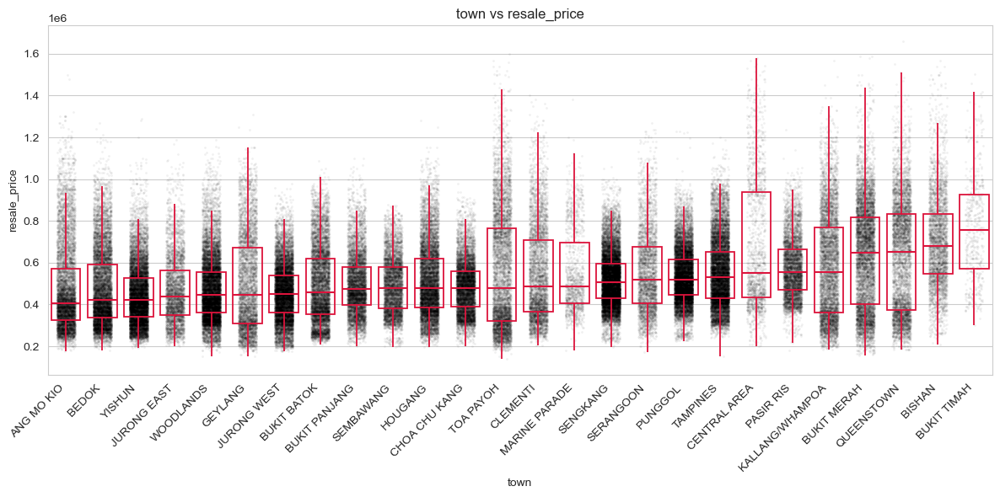

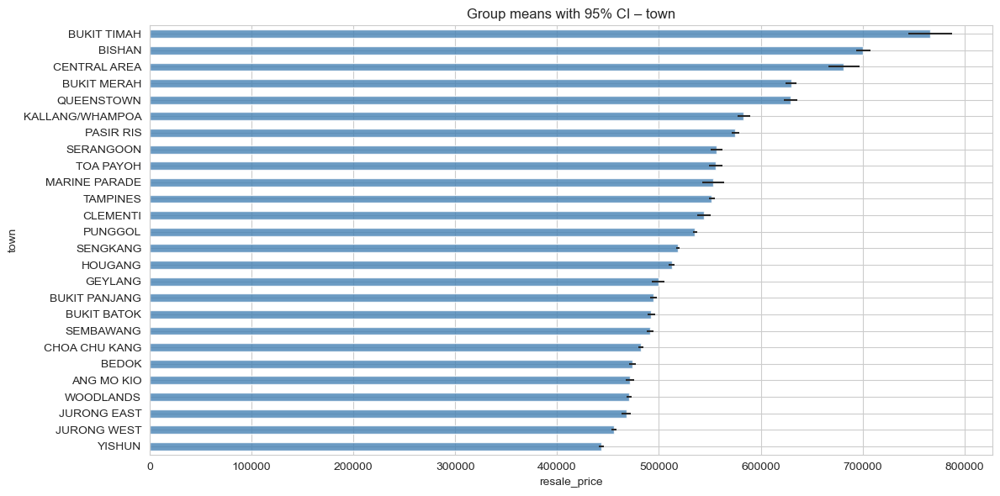

=== Assumption checks ===
Normality   (min p across groups): 0  → NOT normal
Homogeneity (Levene p)           : 0  → heteroscedastic

=== Omnibus tests ===
ANOVA          : F = 940.814,  p = 0
Kruskal‑Wallis : H = 17262.279,  p = 0
Recommendation : ➜ **Kruskal‑Wallis** at α=0.05

=== Post-hoc comparisons ===
▸ Dunn (Bonferroni-adjusted):


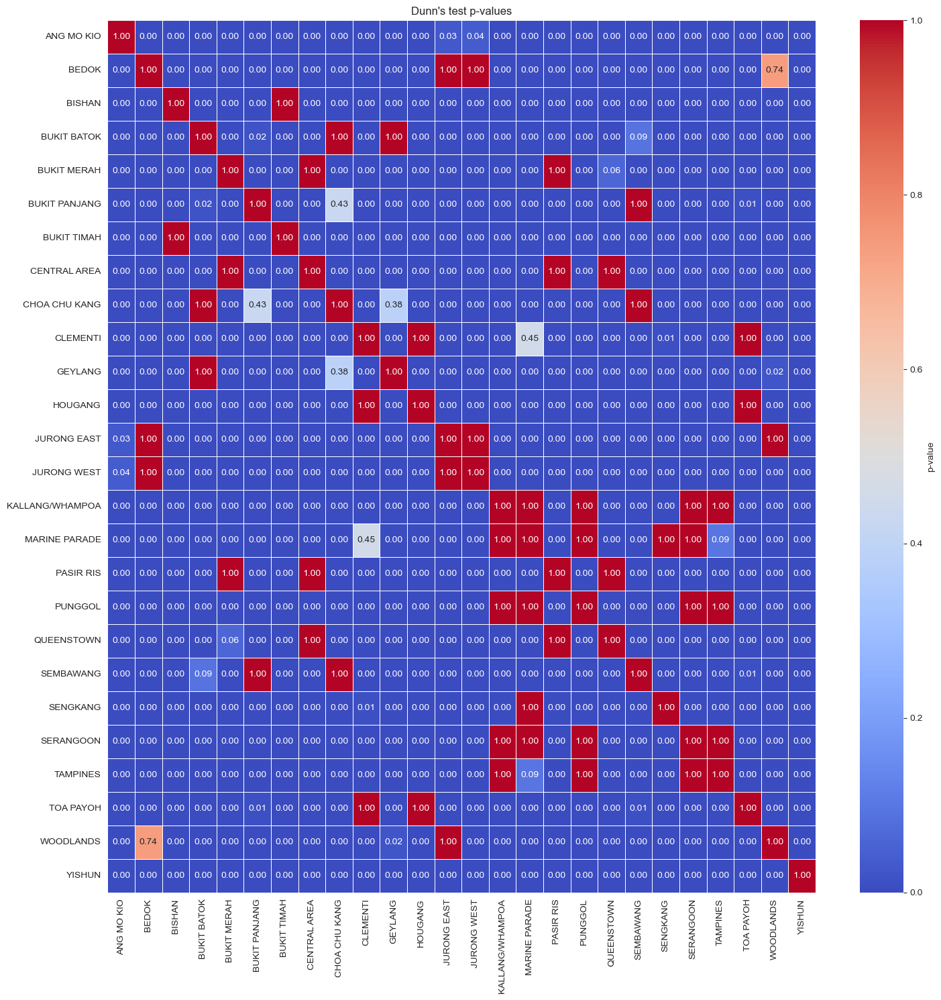


=== Effect size ===
η² = 0.100   ω² = 0.100   (≈0.01 ⇒ small, ≈0.06 ⇒ medium, ≈0.14 ⇒ large)

--- Kruskal-Wallis Effect Size ---
Kruskal-Wallis H = 17262.279, p = 0.000
ε² = 0.082   (medium effect) (≈0.01 ⇒ small, ≈0.06 ⇒ medium, ≈0.14 ⇒ large)
η²H = 0.082   (alternative non-parametric effect size)


In [96]:
plot_categorical_feature_with_target(df, 'town', rare_thresh=None)

**Box-plot with jitters charts shows that different town has different median. Dispersion also differs widely for each town. Some town has wider dispersion compared to others. CI plot shows that there are some town with overlapping CI, whereas some town differs widely.**

**Normality and Levene test shows that the distribution is not normal. Therefore, we will ignore ANOVA and rely on Krusal-Wallis test score. Krusal-Wallis shows that the town contain valuable information that could help in predicting the resale price. Post hoc Dunn chart confirms that most town is widely differs from each other. However there are some towns that are statistically similar with each other.** 

**Size effect says that 8% of the variance of housing price can be explained by town. For transparency and better interpretation, we will not group the town. We will use tree based model to handle the normality and heteroskedasticity.**

#### Categorical Feature Column: Flat Type with HDB Resale Price

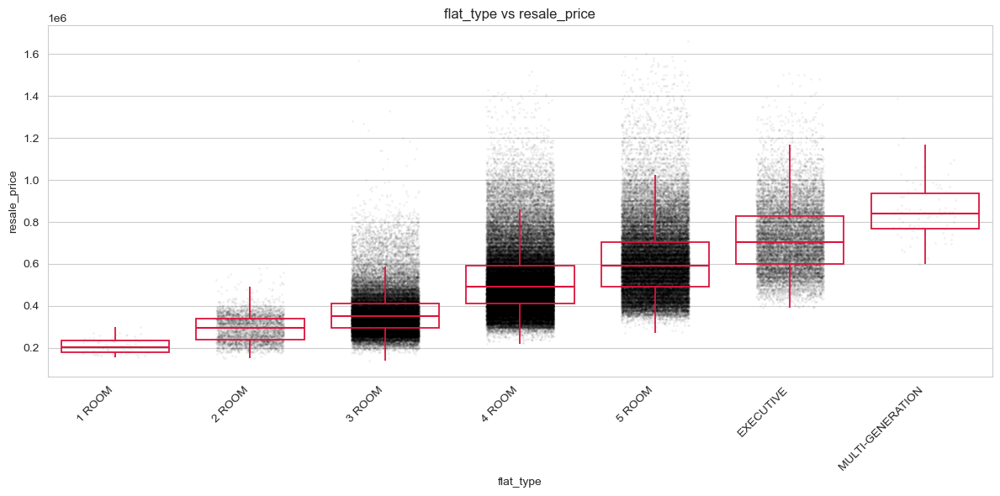

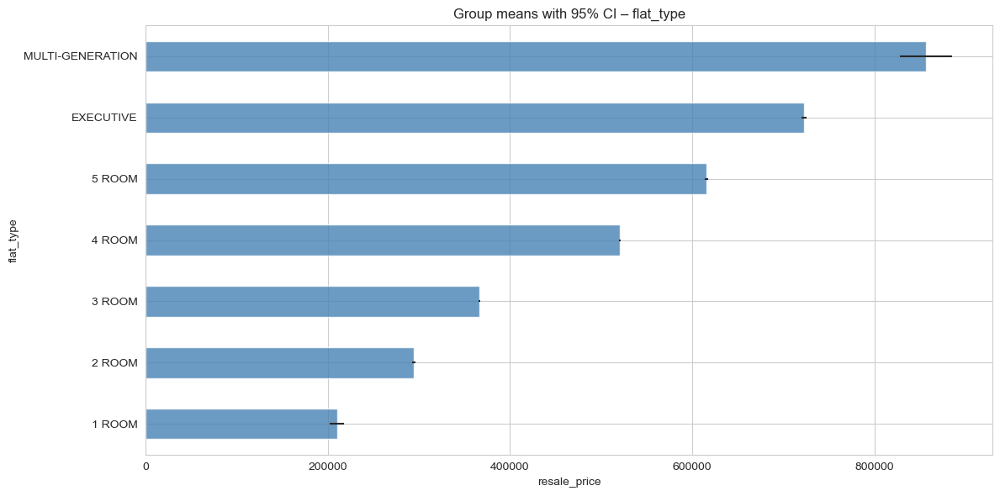

=== Assumption checks ===
Normality   (min p across groups): 0  → NOT normal
Homogeneity (Levene p)           : 0  → heteroscedastic

=== Omnibus tests ===
ANOVA          : F = 19472.433,  p = 0
Kruskal‑Wallis : H = 89426.613,  p = 0
Recommendation : ➜ **Kruskal‑Wallis** at α=0.05

=== Post-hoc comparisons ===
▸ Dunn (Bonferroni-adjusted):


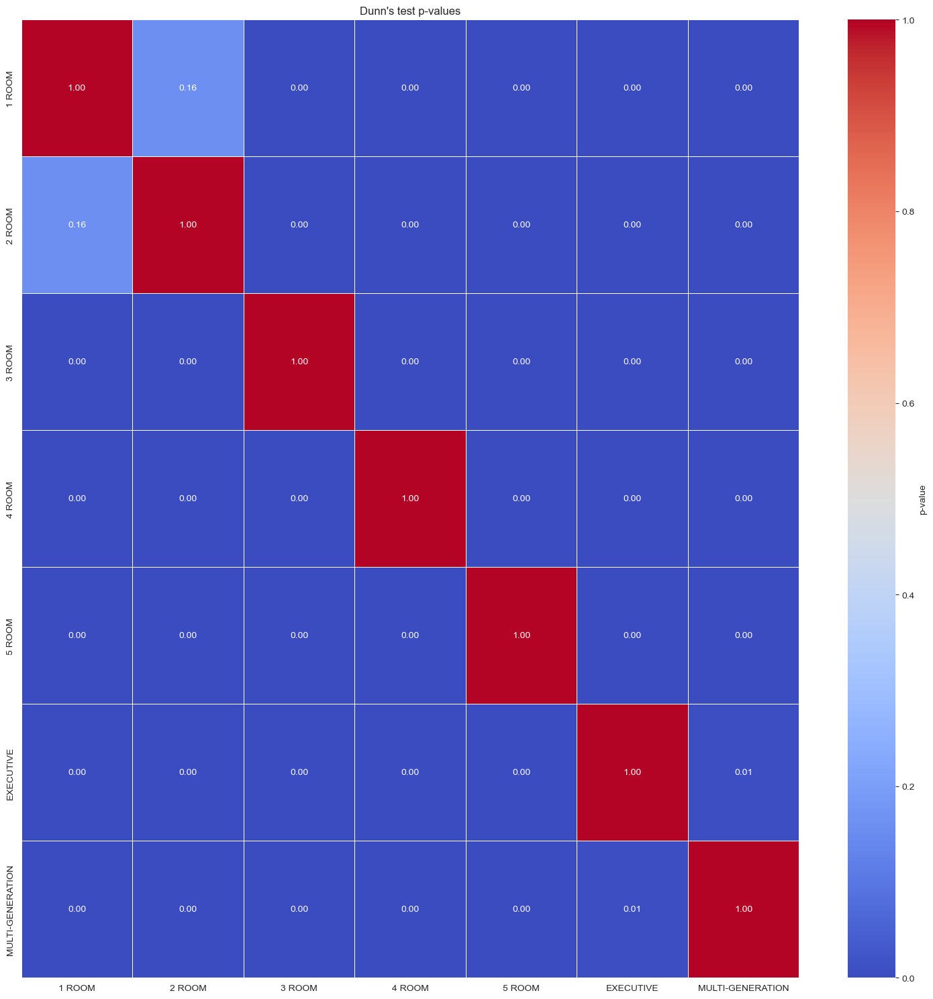


=== Effect size ===
η² = 0.357   ω² = 0.357   (≈0.01 ⇒ small, ≈0.06 ⇒ medium, ≈0.14 ⇒ large)

--- Kruskal-Wallis Effect Size ---
Kruskal-Wallis H = 89426.613, p = 0.000
ε² = 0.424   (large effect) (≈0.01 ⇒ small, ≈0.06 ⇒ medium, ≈0.14 ⇒ large)
η²H = 0.424   (alternative non-parametric effect size)


In [97]:
plot_categorical_feature_with_target(df, 'flat_type', rare_thresh=None)

#### Additional Plot

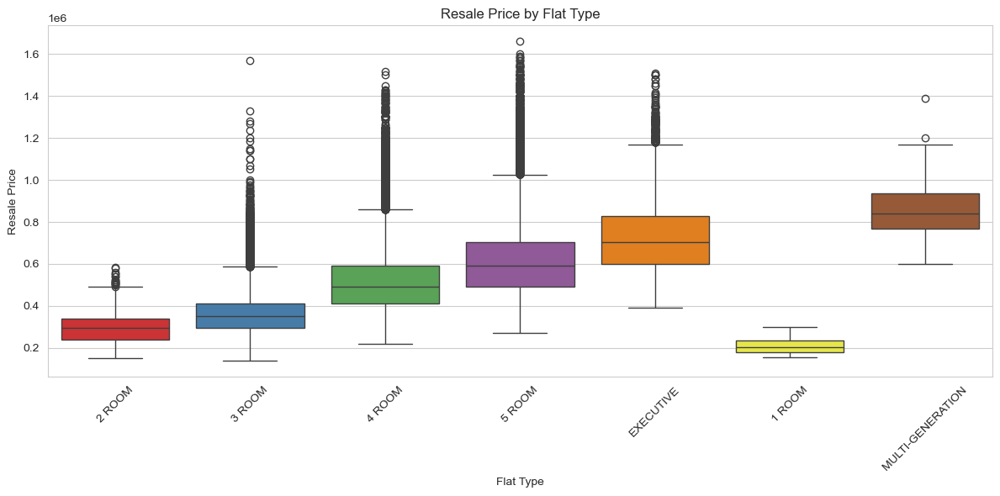

In [98]:
fig, ax = plt.subplots(figsize=plot_fig_size)  

sns.boxplot(data=df, x='flat_type', y='resale_price', hue='flat_type', palette='Set1')

ax.set_title('Resale Price by Flat Type')
ax.set_xlabel('Flat Type')
ax.set_ylabel('Resale Price')
ax.set_xticks(ax.get_xticks())
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

plt.tight_layout()
plt.show()

**There are many outliers for '2 ROOM', '3 ROOM', '4 ROOM', '5 ROOM', and 'EXECUTIVE' flats. Outliers likely happen maybe due to locations or renovation status.**

**Box-plot with jitters charts shows that different flat type has different median. Dispersion is wider for larger flat type. CI plot shows that different flat type the mean CI is not overlapping with each other.**

**Normality and Levene test shows that the distribution is not normal. Therefore, we will ignore ANOVA and rely on Krusal-Wallis test score. Krusal-Wallis shows that the feature flat type is distinct from each other. Only 1-Room and 2-Room is slight similar.** 

**0.42 size effect says that the variance of resales price can be explained by teh flat type 42% of the time. Since Flat Type is distinct. We will keep this feature. We will use tree based model to handle the normality and heteroskedasticity.**

#### Categorical Feature Column: Flat Model with HDB Resale Price

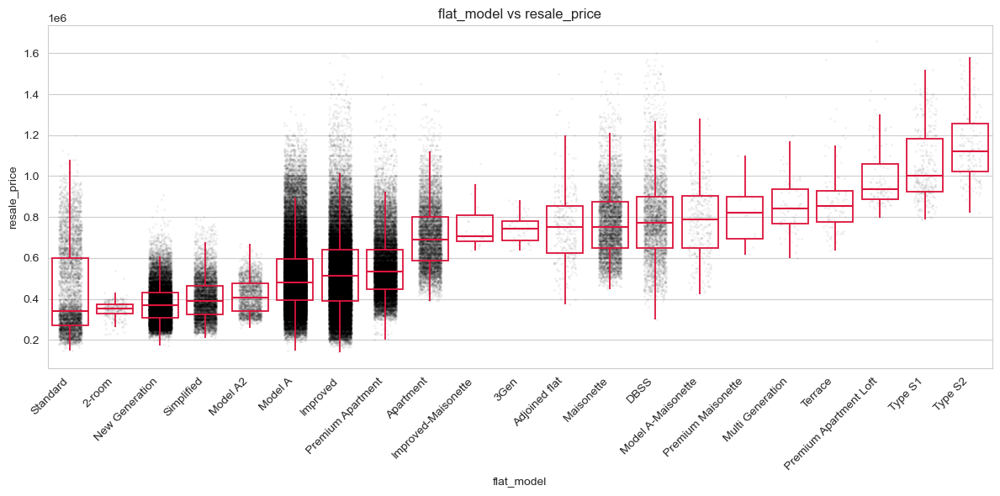

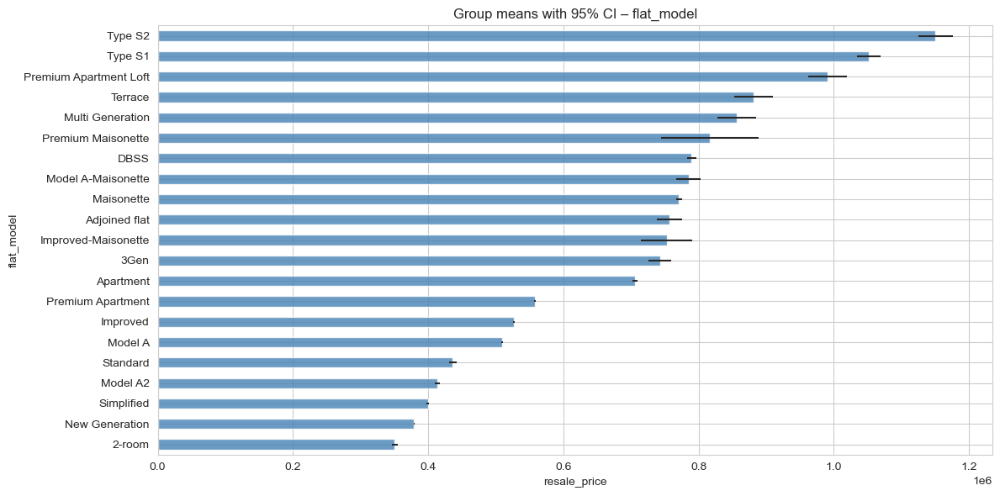

=== Assumption checks ===
Normality   (min p across groups): 0  → NOT normal
Homogeneity (Levene p)           : 0  → heteroscedastic

=== Omnibus tests ===
ANOVA          : F = 3889.977,  p = 0
Kruskal‑Wallis : H = 53622.808,  p = 0
Recommendation : ➜ **Kruskal‑Wallis** at α=0.05

=== Post-hoc comparisons ===


/var/folders/s3/29d7926n31b40hc3rtxz_m_w0000gq/T/ipykernel_57691/752033852.py:11: RuntimeWarning: Very small group (n<20): normality test unstable.
  warnings.warn("Very small group (n<20): normality test unstable.",


▸ Dunn (Bonferroni-adjusted):


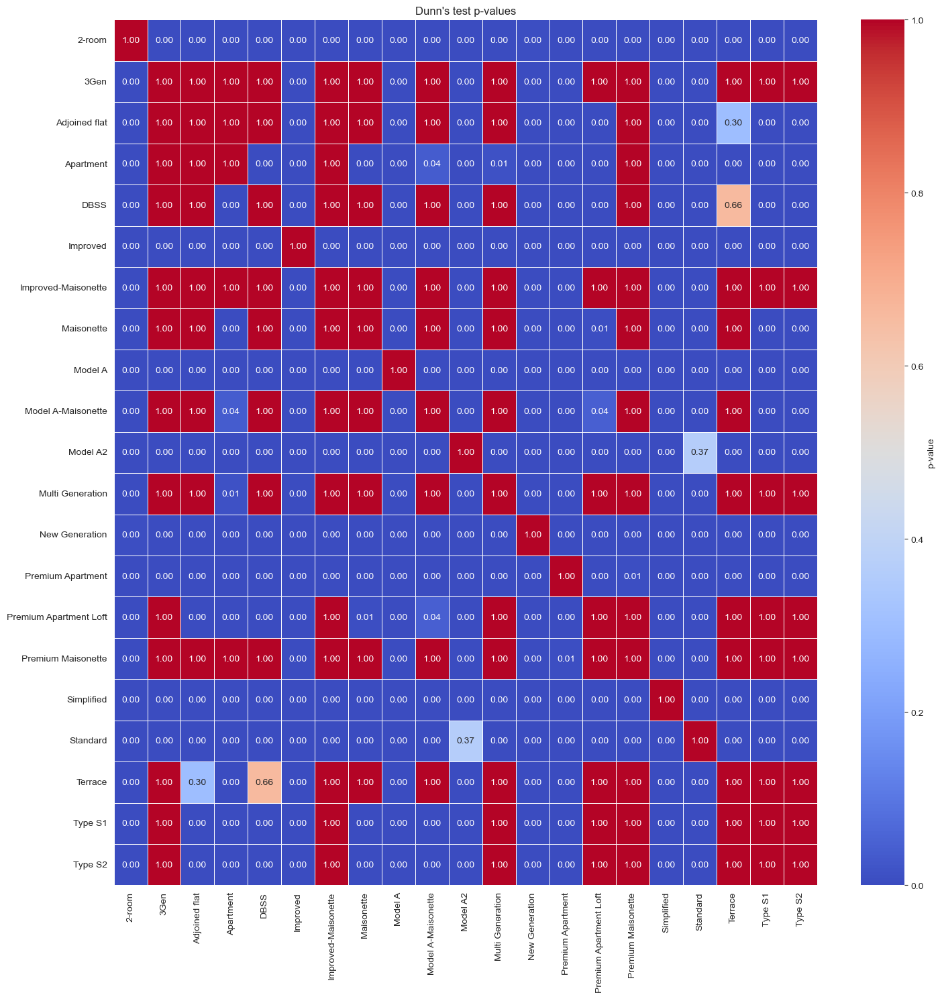


=== Effect size ===
η² = 0.270   ω² = 0.270   (≈0.01 ⇒ small, ≈0.06 ⇒ medium, ≈0.14 ⇒ large)

--- Kruskal-Wallis Effect Size ---
Kruskal-Wallis H = 53622.808, p = 0.000
ε² = 0.254   (large effect) (≈0.01 ⇒ small, ≈0.06 ⇒ medium, ≈0.14 ⇒ large)
η²H = 0.254   (alternative non-parametric effect size)


In [99]:
plot_categorical_feature_with_target(df, 'flat_model', rare_thresh=None)

**Box-plot with jitters charts shows some flat model differs from each other but there are some flat model that are similar in median and dispersion. Some flat model has wider dispersion is wider for larger flat type. CI plot shows that different flat model CI mean is not overlapping, however, some model overlap with each other.**

**Normality and Levene test shows that the distribution is not normal. Therefore, we will ignore ANOVA and rely on Krusal-Wallis test score. Krusal-Wallis shows that the feature flat model is distinct and will assist in predicting the resale price. Post hoc Dunn chart shows that also some categories and distinct from one another. There are some categories that are similar.** 

**Effect of size is 0.25 which means that this feature has some influence to the resale price. We will keep this feature. We will use tree based model to handle the normality and heteroskedasticity.**

### Temporal Feature Bivariate Analysis

In [100]:
def plot_temporal_feature_with_target(df: pd.DataFrame,
                                      date_col: str,
                                      target: str,
                                      freq: str = "M",      # resample rule: 'D', 'W', 'M', …
                                      roll: int | None = None,  # e.g. 30‑day smoother
                                      seasonal_period: int | None = None,  # e.g. 12 for monthly
                                      show_heatmap: bool = True,
                                      alpha: float = 0.05):
    """
    One-stop bivariate EDA for a datetime predictor.

    VISUALS
    -------
    1. Raw series (+ optional rolling mean)
    2. Resampled series at `freq`
    3. STL decomposition (trend / seasonal / residual)
    4. Boxplot by calendar unit (month or day-of-week)
    5. Year x month heatmap (optional)
    6. ACF & PACF panels

    STATS
    -----
    • Augmented Dickey-Fuller test for stationarity
    • Prints mean & std by resample bin for quick sanity

    NOTES
    -----
    * Keeps time index untouched (no differencing); this is exploratory, not modelling.
    * If `roll` is None, a 7-period rolling mean is drawn only when raw data are daily.
    """
    # ── 0. Prep ───────────────────────────────────────────────
    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col])
    df = df.set_index(date_col).sort_index()
    df = df[[target]].dropna()

    if roll is None and freq.lower().startswith("d"):
        roll = 7                         # one‑week smoother by default

    # ── 1. Raw line (plus rolling) ───────────────────────────
    fig, ax = plt.subplots(figsize=plot_fig_size)
    df[target].plot(ax=ax, linewidth=0.8, label='raw')
    if roll:
        df[target].rolling(roll).mean().plot(ax=ax, linewidth=2,
                                             label=f'{roll}-period MA')
    ax.set_title(f"{target} over time")
    ax.legend(); plt.tight_layout(); plt.show()

    # ── 2. Resampled series ─────────────────────────────────
    agg = df[target].resample(freq).mean()
    ma  = agg.rolling(window=roll, min_periods=1).mean()
    fig, ax = plt.subplots(figsize=plot_fig_size)
    agg.plot(ax=ax, marker='o')
    ma.plot(ax=ax, linewidth=3, label=f'{roll}-period MA')
    ax.set_title(f"{target} resampled to '{freq}' (mean) "
                 f"- μ={agg.mean():.1f}, alpha={agg.std():.1f}")
    plt.tight_layout(); plt.show()

    # ── 3. STL decomposition ───────────────────────────────
    period = seasonal_period
    if period is None:
        # crude guess: monthly data ⇒ period 12; weekly ⇒ 52; else fallback 7
        period = {'M':12, 'W':52, 'D':7}.get(freq[0].upper(), 7)
    stl = STL(df[target], period=period, robust=True).fit()
    stl.plot(); plt.show()

    # ── 4. Calendar‑boxplot ─────────────────────────────────
    if freq.upper().startswith('D'):
        df['dow'] = df.index.dayofweek
        order = ['Mon','Tue','Wed','Thu','Fri','Sat','Sun']
        fig, ax = plt.subplots(figsize=plot_fig_size)
        sns.boxplot(x=df['dow'].map(dict(zip(range(7), order))),
                    y=target, data=df, ax=ax)
        ax.set_title(f"{target} by day‑of‑week (median order)")
        plt.tight_layout(); plt.show()
    else:  # monthly or yearly data
        df['month'] = df.index.month_name().str[:3]
        month_order = ['Jan','Feb','Mar','Apr','May','Jun',
                       'Jul','Aug','Sep','Oct','Nov','Dec']
        fig, ax = plt.subplots(figsize=(12,5))
        sns.boxplot(x='month', y=target, data=df, order=month_order, ax=ax)
        ax.set_title(f"{target} by month (median order)")
        plt.tight_layout(); plt.show()

    # ── 5. Year×month heatmap ───────────────────────────────
    if show_heatmap and freq.upper().startswith('D'):
        pivot = df.pivot_table(index=df.index.year,
                               columns=df.index.month,
                               values=target, aggfunc='mean')
        fig, ax = plt.subplots(figsize=plot_heatmap)
        sns.heatmap(pivot, cmap='viridis', ax=ax, cbar_kws={'label':target})
        ax.set_xlabel("Month"); ax.set_ylabel("Year")
        ax.set_title(f"Heatmap of mean {target}")
        plt.tight_layout(); plt.show()

    # ── 6. ACF & PACF ──────────────────────────────────────
    fig, axes = plt.subplots(2, 1, figsize=plot_fig_size)
    plot_acf(df[target].dropna(), ax=axes[0], lags=40, alpha=0.05, zero=False)
    plot_pacf(df[target].dropna(), ax=axes[1], lags=40, alpha=0.05,
            method='ywm', zero=False)
    axes[0].set_title('ACF (95% band)')
    axes[1].set_title('PACF (95% band)')
    plt.tight_layout(); plt.show()

    # ── 7. ADF stationarity test ───────────────────────────
    print("=== Augmented Dickey-Fuller test ===")
    adf_stat, p, lags, n_obs, crit, _ = adfuller(df[target])
    print(f"ADF stat = {adf_stat:.3f}, p = {p:.4g}")
    for k, v in crit.items():
        print(f"  {k}% critical = {v:.3f}")
    if p < alpha:
        print(f"→ Reject H0 (series is likely stationary) at alpha={alpha}")
    else:
        print(f"→ Fail to reject H0 (series non-stationary) at alpha={alpha}")

    # ── Year × month heat‑map (now on by default) ────────────────────────
    print("\n=== Year x Month Heatmap ===")
    if show_heatmap:
        # build mean grid (rows=year, cols=month)
        tmp = (df.assign(_yy=df.index.year, _mm=df.index.month)
         .pivot_table(index='_yy',
                      columns='_mm',
                      values=target,
                      aggfunc='mean'))

        # cosmetic rename for plot
        tmp.index.name  = 'year'
        tmp.columns.name = 'month'

        fig, ax = plt.subplots(figsize=(12, 5))
        sns.heatmap(tmp,
                cmap='viridis',
                cbar_kws={'label': target},
                ax=ax)

        ax.set_xlabel("Month")
        ax.set_ylabel("Year")
        ax.set_title(f"Year-over-Year Mean {target}")
        plt.tight_layout()
        plt.show()

#### Temporal Feature Column: Month with HDB Resale Price

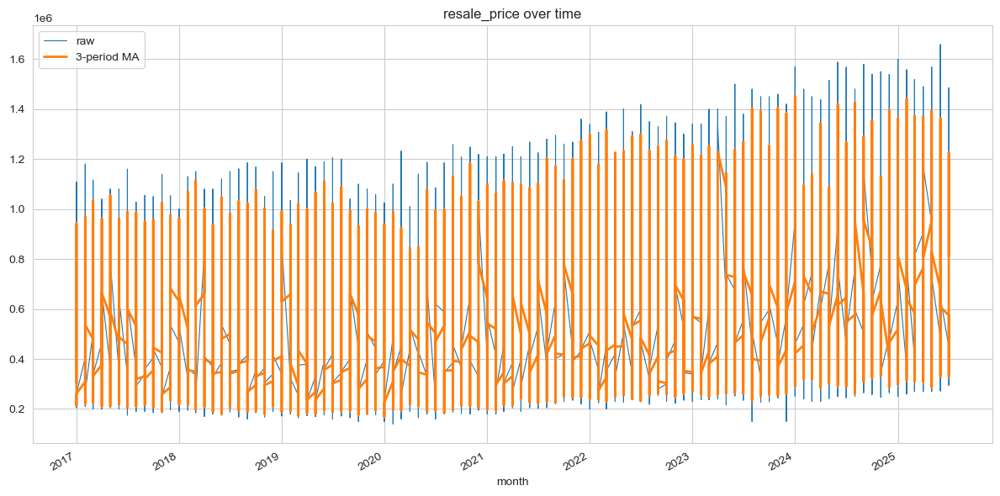

/var/folders/s3/29d7926n31b40hc3rtxz_m_w0000gq/T/ipykernel_57691/233451871.py:50: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  agg = df[target].resample(freq).mean()


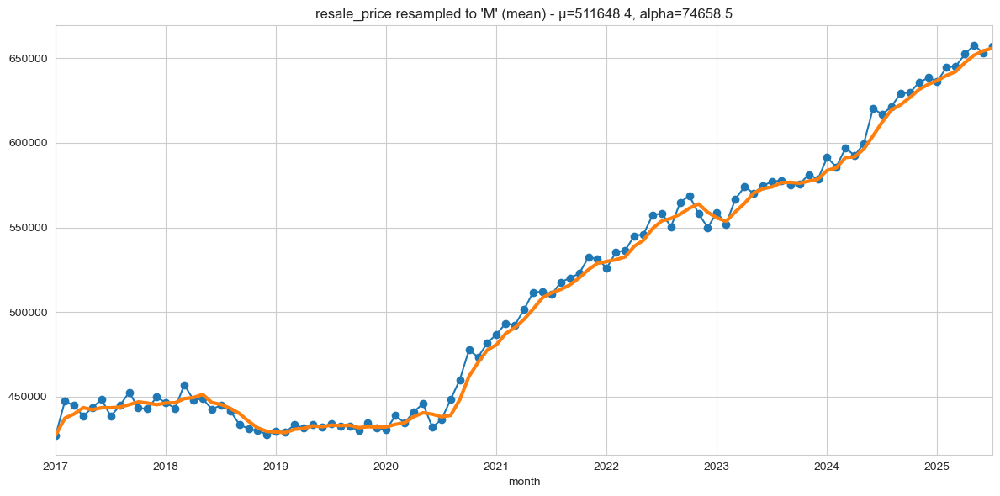

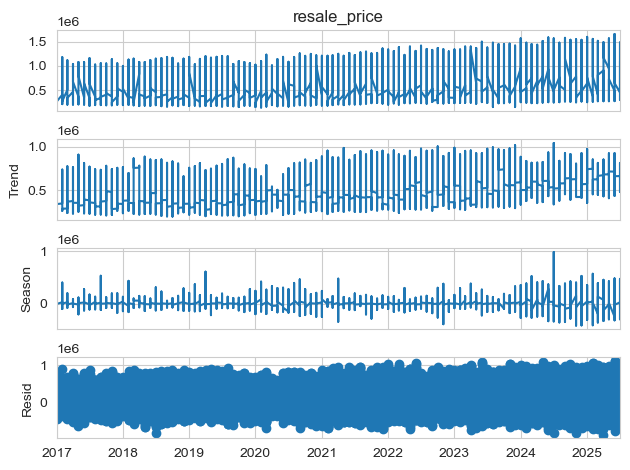

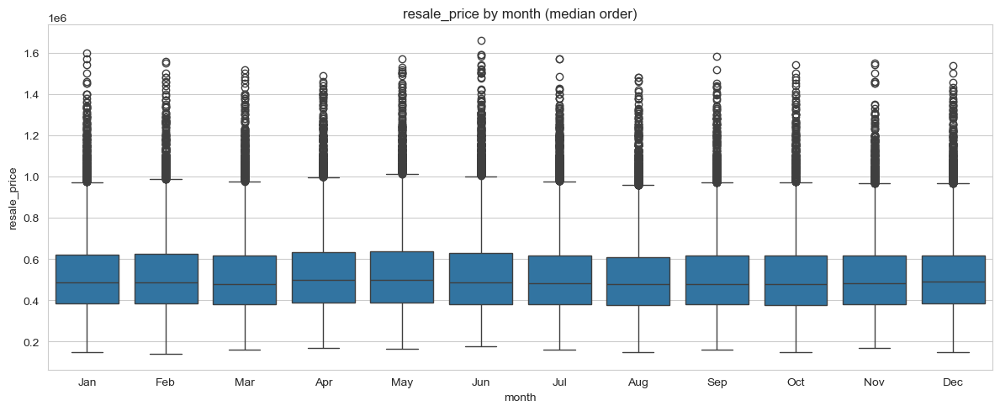

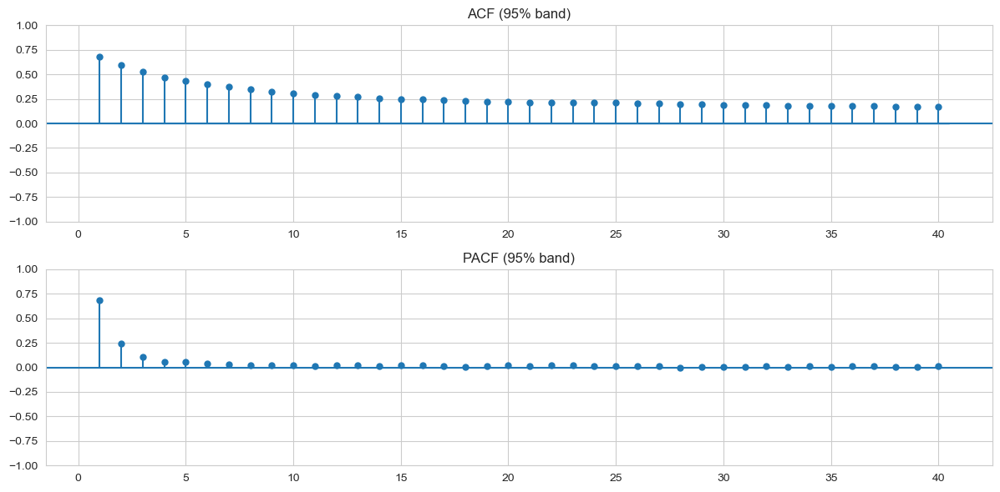

=== Augmented Dickey-Fuller test ===
ADF stat = -28.926, p = 0
  1%% critical = -3.430
  5%% critical = -2.862
  10%% critical = -2.567
→ Reject H0 (series is likely stationary) at alpha=0.05

=== Year x Month Heatmap ===


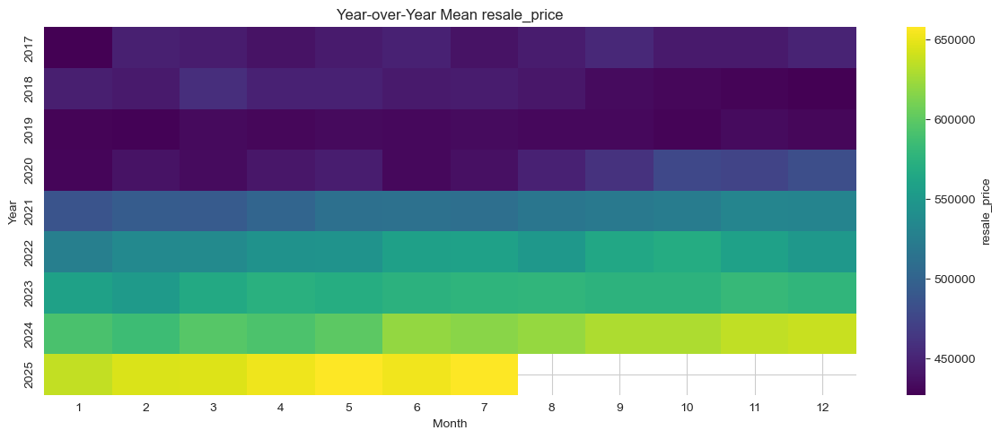

In [101]:
plot_temporal_feature_with_target(df, 'month', 'resale_price', freq='M', roll=3, seasonal_period=12,
                                  show_heatmap=True, alpha=0.05)

**The first chart shows that dispersion wider over time indicating an increasing variance or heteroscedasticity over time. The second chart shows that resale price was stable from 2017 to middle of 2020. Price start to climb from the middle of 2020 possibly due to pandemic lock down and low construction activities.**

**Seasonal decomposition shows that there is trend showing and seasonality is weak. The box-plot tell us that comparing month by month there is not much different in median. ACF showing slow decay, whereas PACF shows correlation for the first 2 lags with rapid decline. Augmented Dickey-Fuller test confirm that the series is likely stationary. Heatmap shows that the average resale price has been climbing since 2017.**

**There are contradiction between ACF vs. ADF. ACF showing slow decay may be misleading and the ADF test is the statistical confirmation, indicating stationarity.**

### Additional Analysis

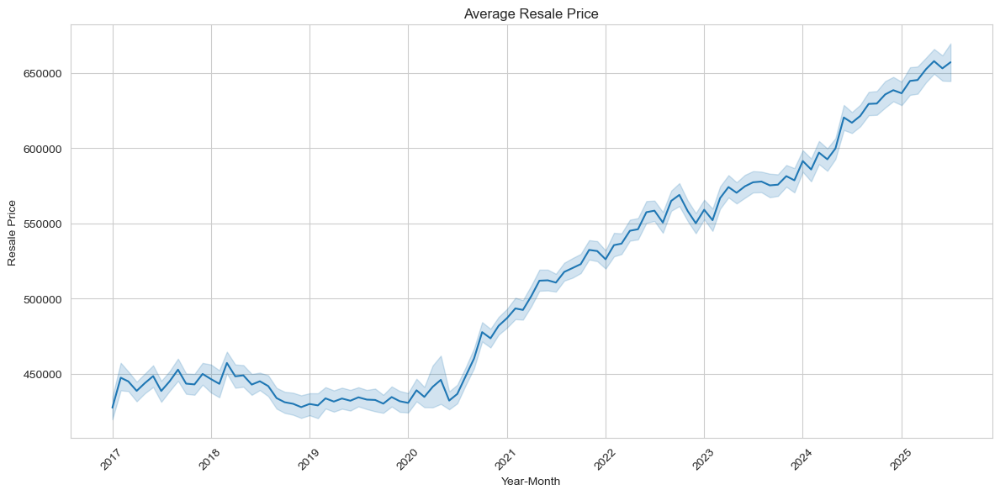

In [102]:
df_sorted = df.set_index('month').sort_index()

fig, ax = plt.subplots(figsize=plot_fig_size)  

sns.lineplot(data=df_sorted, x='month', y='resale_price', estimator='mean', ax=ax)

ax.set_title('Average Resale Price')
ax.set_xlabel('Year-Month')
ax.set_ylabel('Resale Price')
ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

### Cyclical Analysis of Resale Transaction

In [103]:
month_counts = df.month.value_counts().sort_index()
month_counts.head()

month
2017-01-01    1176
2017-02-01    1080
2017-03-01    1889
2017-04-01    1821
2017-05-01    1961
Name: count, dtype: int64

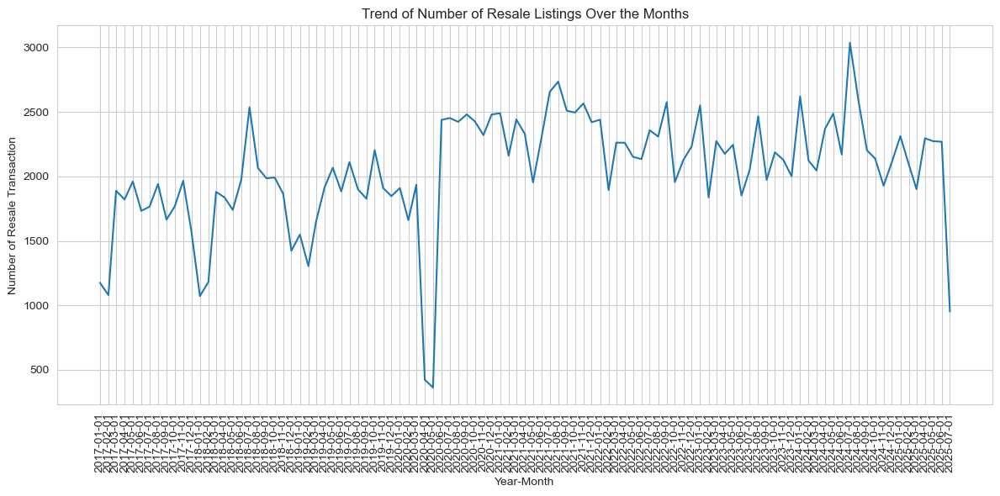

In [104]:
fig, ax = plt.subplots(figsize=plot_fig_size)  

sns.lineplot(x=month_counts.index, y=month_counts.values, ax=ax)

ax.set_title('Trend of Number of Resale Listings Over the Months')
ax.set_xlabel('Year-Month')
ax.set_ylabel('Number of Resale Transaction')
ax.tick_params(axis='x', rotation=90)
# Show every month for clarity
ax.set_xticks(month_counts.index[::1])


plt.grid(True)
plt.tight_layout()
plt.show()

**HDB resale is seasonal and the month of February has the lowers resale transaction.**

## Multivariate Analysis - Pair Plot

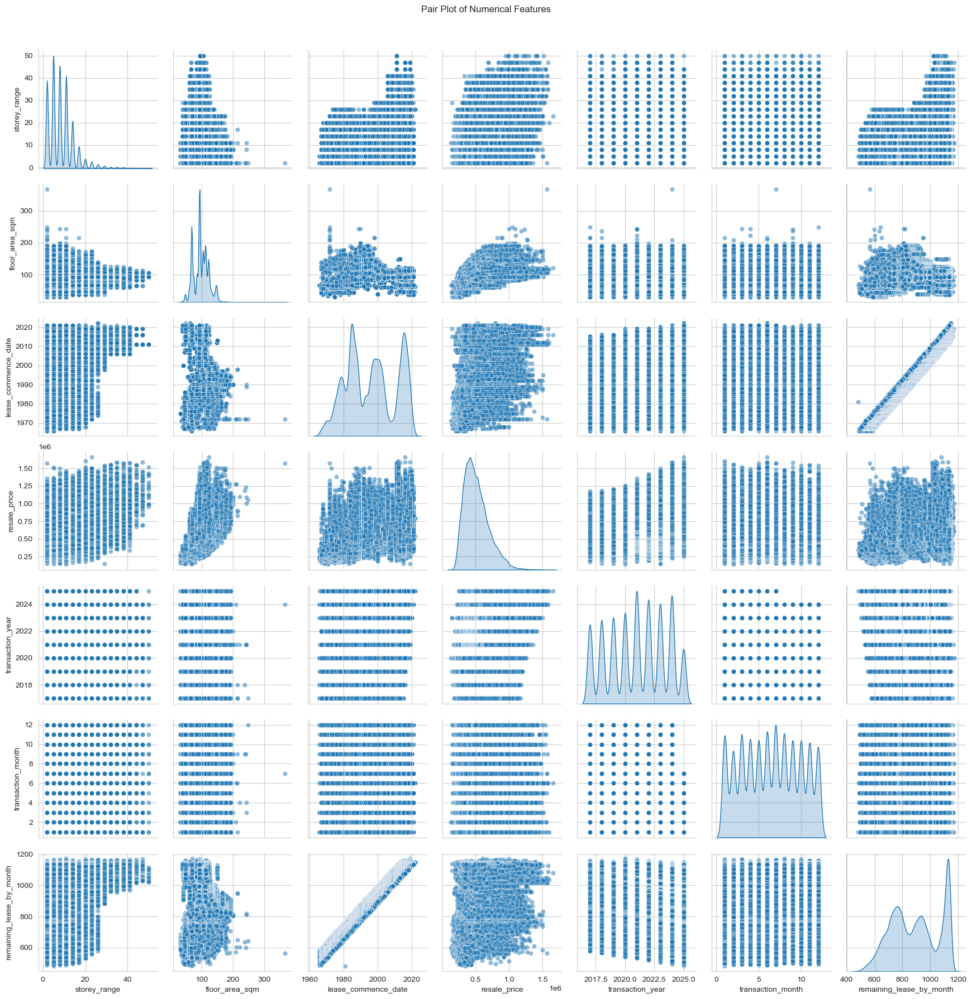

In [105]:
# pair plot
sns.pairplot(df[numerical_columns], diag_kind='kde', markers='o', plot_kws={'alpha': 0.5})
plt.suptitle('Pair Plot of Numerical Features', y=1.02)

plt.tight_layout()
plt.show()

**There is a linear trend between `lease_commence_date` and `remaining_lease_by_month`. Both are the same. Will confirm with correlation analysis.**

## Multivariate Analysis - Additional Analysis

### Flat Type and Floor Area

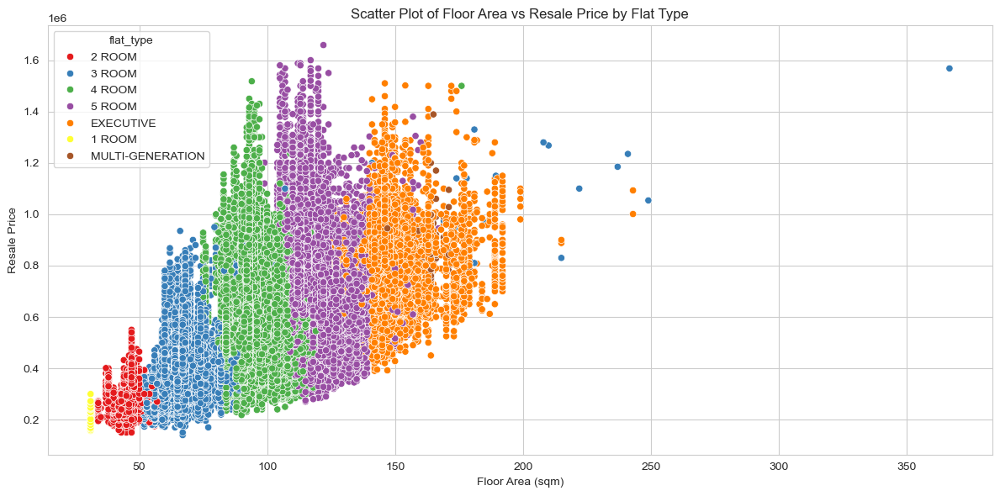

In [106]:
fig, ax = plt.subplots(figsize=plot_fig_size)  

sns.scatterplot(data=df, x='floor_area_sqm', y='resale_price', hue='flat_type', palette='Set1')

ax.set_title('Scatter Plot of Floor Area vs Resale Price by Flat Type')
ax.set_xlabel('Floor Area (sqm)')
ax.set_ylabel('Resale Price')

plt.tight_layout()
plt.show()

**Generally, the increase in floor area result in increase in resale price.**
  
**There are 3 ROOM flats that has a very high selling price and the floor area is also quite high. We need to investigate further.**

In [107]:
outliers_3_room = df[(df['flat_type'] == '3 ROOM') & (df['floor_area_sqm'] > 150) & (df['resale_price'] > 800000)]
outliers_3_room

,month,town,flat_type,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,transaction_year,transaction_month,remaining_lease_by_month,_log_price
7000,2017-05-01,KALLANG/WHAMPOA,3 ROOM,2.0,181.0,Terrace,1972,54 years 02 months,810000.0,2017,5,650,13.604790
8868,2017-06-01,KALLANG/WHAMPOA,3 ROOM,2.0,215.0,Terrace,1972,54 years 01 month,830000.0,2017,6,649,13.629181
19693,2017-12-01,KALLANG/WHAMPOA,3 ROOM,2.0,249.0,Terrace,1972,53 years 07 months,1053888.0,2017,12,643,13.867997
27292,2018-05-01,KALLANG/WHAMPOA,3 ROOM,2.0,185.0,Terrace,1972,53 years 02 months,968000.0,2018,5,638,13.782987
29231,2018-06-01,KALLANG/WHAMPOA,3 ROOM,2.0,174.0,Terrace,1972,53 years 02 months,950000.0,2018,6,638,13.764217
35797,2018-09-01,KALLANG/WHAMPOA,3 ROOM,2.0,237.0,Terrace,1972,52 years 10 months,1185000.0,2018,9,634,13.985253
53491,2019-07-01,KALLANG/WHAMPOA,3 ROOM,2.0,169.0,Terrace,1972,52 years 03 months,975000.0,2019,7,627,13.790193
79015,2020-09-01,KALLANG/WHAMPOA,3 ROOM,2.0,170.0,Terrace,1972,50 years 10 months,1000000.0,2020,9,610,13.815511
95808,2021-04-01,KALLANG/WHAMPOA,3 ROOM,2.0,222.0,Terrace,1972,50 years 03 months,1100000.0,2021,4,603,13.910821
95809,2021-04-01,KALLANG/WHAMPOA,3 ROOM,2.0,178.0,Terrace,1972,50 years 04 months,1140000.0,2021,4,604,13.946539


**The outliers are 3 ROOM flats that are built in 1972 where they have floor area of 180 sqm and above. Therefore, flat type is not good enough to differentiate the resale price. Flat model also plays an important differentiator.**

In [108]:
terrace_3_room = df[(df['flat_type'] == '3 ROOM') & (df['flat_model'] == "Terrace")]
terrace_3_room.describe()

,month,storey_range,floor_area_sqm,lease_commence_date,resale_price,transaction_year,transaction_month,remaining_lease_by_month,_log_price
count,104,104.0,104.000000,104.000000,1.040000e+02,104.000000,104.000000,104.000000,104.000000
mean,2021-02-06 01:36:55.384615424,2.0,114.643269,1971.461538,8.776762e+05,2020.615385,6.836538,598.875000,13.670472
min,2017-03-01 00:00:00,2.0,78.000000,1968.000000,6.350000e+05,2017.000000,1.000000,507.000000,13.361380
25%,2019-04-01 00:00:00,2.0,87.000000,1972.000000,7.750000e+05,2019.000000,4.000000,572.250000,13.560618
50%,2021-01-30 12:00:00,2.0,94.500000,1972.000000,8.475000e+05,2021.000000,7.000000,602.000000,13.650042
75%,2022-11-01 00:00:00,2.0,116.500000,1972.000000,9.300000e+05,2022.000000,10.000000,626.000000,13.742940
max,2025-05-01 00:00:00,2.0,366.700000,1972.000000,1.568000e+06,2025.000000,12.000000,652.000000,14.265311
std,NaN,0.0,48.178158,1.371861,1.596752e+05,2.361946,3.327177,31.606712,0.167163


- **Terrace was built between 1968 to 1972.**
- **Both floor area and resale price and very wide range.**
- **sqm range from 78 sqm to 280 sqm.**

Checking other similar situation.

In [109]:
df[['flat_type', 'flat_model', 'floor_area_sqm', 'resale_price']].groupby(['flat_type', 'flat_model']).mean()

floor_area_sqm  resale_price
flat_type        flat_model                                          
1 ROOM           Improved                     31.000000  2.098462e+05
2 ROOM           2-room                       45.117057  3.504695e+05
                 DBSS                         50.000000  3.675000e+05
                 Improved                     45.322404  2.511844e+05
                 Model A                      45.934070  3.082620e+05
                 Premium Apartment            52.514286  2.755111e+05
                 Standard                     45.102524  2.467825e+05
3 ROOM           DBSS                         65.163136  5.288459e+05
                 Improved                     65.347833  3.297278e+05
                 Model A                      70.146013  4.208843e+05
                 New Generation               70.027608  3.405962e+05
                 Premium Apartment            67.544487  4.749122e+05
                 Simplified                   64.312413  3.431274e+05
                 Standard                     60.812716  3.142748e+05
                 Terrace                     114.643269  8.776762e+05
4 ROOM           Adjoined flat               119.250000  6.440000e+05
                 DBSS                         88.881174  7.362184e+05
                 Improved                     85.320837  4.612547e+05
                 Model A                      97.486174  5.373194e+05
                 Model A2                     89.353949  4.136227e+05
                 New Generation               93.132364  4.467788e+05
                 Premium Apartment            94.182145  5.411453e+05
                 Premium Apartment Loft       97.876404  9.642281e+05
                 Simplified                   84.497721  4.198451e+05
                 Standard                     77.104167  4.389245e+05
                 Terrace                     121.100000  9.331429e+05
                 Type S1                      94.288630  1.051640e+06
5 ROOM           3Gen                        120.316667  7.427624e+05
                 Adjoined flat               135.357843  7.173545e+05
                 DBSS                        111.647594  9.184355e+05
                 Improved                    117.303855  6.014918e+05
                 Improved-Maisonette         136.333333  7.528851e+05
                 Model A                     134.396571  6.269473e+05
                 Model A-Maisonette          140.831099  7.849140e+05
                 Premium Apartment           113.646027  5.853435e+05
                 Premium Apartment Loft      140.960000  1.086377e+06
                 Standard                    118.835402  6.474265e+05
                 Type S2                     106.106742  1.150296e+06
EXECUTIVE        Adjoined flat               160.935484  8.504285e+05
                 Apartment                   144.428218  7.056359e+05
                 Maisonette                  148.005974  7.710544e+05
                 Premium Apartment           133.677956  6.188907e+05
                 Premium Maisonette          159.875000  8.164375e+05
MULTI-GENERATION Multi Generation            161.190476  8.567360e+05

**Besides 3 ROOM flat, other flat type also contains Terrace model. To get a more accurate prediction, flat type and flat model must be used together.**

### Average Resale Price By Town, Type and Model Analysis

In [110]:
town_breakdown = df[['town', 'floor_area_sqm', 'resale_price']].groupby(['town'])
town_breakdown[['floor_area_sqm']].describe()

floor_area_sqm                                             \
                         count        mean        std   min    25%    50%   
town                                                                        
ANG MO KIO              8629.0   85.125159  20.684202  44.0   68.0   82.0   
BEDOK                  11008.0   89.906432  24.467758  44.0   68.0   88.0   
BISHAN                  3711.0  107.619240  24.296512  63.0   88.0  105.0   
BUKIT BATOK             8663.0   94.151910  25.078179  37.0   73.0   93.0   
BUKIT MERAH             8070.0   87.072862  22.424584  31.0   67.0   90.0   
BUKIT PANJANG           7580.0  102.141425  20.735157  46.0   92.0  103.0   
BUKIT TIMAH              516.0  109.302326  26.120365  63.0   91.0  104.0   
CENTRAL AREA            1652.0   81.546005  19.267562  41.0   65.0   82.0   
CHOA CHU KANG           9566.0  108.212210  19.744291  46.0   93.0  106.0   
CLEMENTI                4669.0   86.426215  21.400563  44.0   67.0   82.0   
GEYLANG                 5172.0   83.476431  25.702552  40.0   60.3   84.0   
HOUGANG                10619.0   99.779640  24.786058  38.0   84.0  100.0   
JURONG EAST             4300.0   97.308372  26.717954  43.0   72.0   94.0   
JURONG WEST            13949.0  101.535666  23.456963  37.0   90.0  104.0   
KALLANG/WHAMPOA         6444.0   86.528181  23.693209  42.0   66.0   89.0   
MARINE PARADE           1288.0   86.243789  22.895347  42.0   65.0   82.0   
PASIR RIS               6087.0  119.988664  21.424432  47.0  105.0  122.0   
PUNGGOL                15399.0   95.553932  16.278248  37.0   92.0   93.0   
QUEENSTOWN              5749.0   82.433989  20.753158  43.0   65.0   83.0   
SEMBAWANG               6252.0   98.672585  21.287433  38.0   91.0   95.0   
SENGKANG               17295.0   99.132871  17.366492  38.0   92.0   94.0   
SERANGOON               3761.0  101.550651  27.268526  44.0   84.0  100.0   
TAMPINES               14339.0  104.116256  24.105312  45.0   84.0  104.0   
TOA PAYOH               6710.0   86.390313  24.039097  38.0   67.0   82.0   
WOODLANDS              14959.0  105.633532  25.574285  37.0   92.0  102.0   
YISHUN                 14395.0   92.672178  22.740222  38.0   74.0   92.0   

                               
                   75%    max  
town                           
ANG MO KIO        93.0  178.0  
BEDOK            105.0  176.0  
BISHAN           121.0  243.0  
BUKIT BATOK      110.0  165.0  
BUKIT MERAH      101.0  176.0  
BUKIT PANJANG    113.0  155.0  
BUKIT TIMAH      125.5  154.0  
CENTRAL AREA      95.0  146.0  
CHOA CHU KANG    121.0  215.0  
CLEMENTI          93.0  163.0  
GEYLANG           95.0  160.0  
HOUGANG          116.0  177.0  
JURONG EAST      120.0  173.0  
JURONG WEST      113.0  159.0  
KALLANG/WHAMPOA  101.0  366.7  
MARINE PARADE    117.0  157.0  
PASIR RIS        143.0  190.0  
PUNGGOL          110.0  149.0  
QUEENSTOWN        93.0  156.0  
SEMBAWANG        111.0  143.0  
SENGKANG         112.0  149.0  
SERANGOON        121.0  165.0  
TAMPINES         122.0  190.0  
TOA PAYOH        104.0  167.0  
WOODLANDS        121.0  192.0  
YISHUN           105.0  187.0

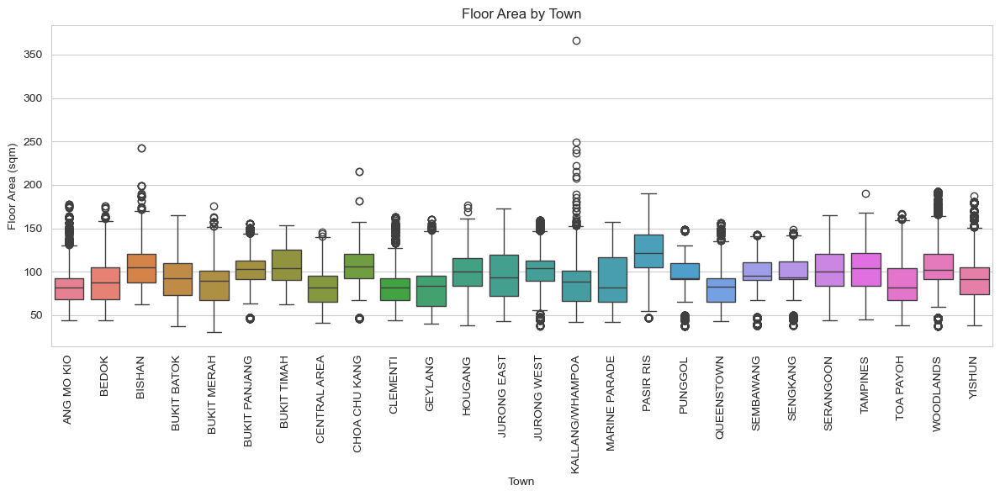

In [111]:
fig, ax = plt.subplots(figsize=plot_fig_size)  

sns.boxplot(data=df, x='town', y='floor_area_sqm', hue='town')

ax.set_title('Floor Area by Town')
ax.set_xlabel('Town')
ax.set_ylabel('Floor Area (sqm)')
ax.set_xticks(ax.get_xticks())
ax.set_xticklabels([label.get_text() for label in ax.get_xticklabels()], rotation=90)

plt.tight_layout()
plt.show()

**The chart shows that some town contains more outliers than other town in terms of floor area. KALLANG/WHAMPOA has many outliers that goes beyond 200 sqm. These are the 3 Room terrace that we discovered earlier.**

In [112]:
town_breakdown[['resale_price']].describe()

resale_price                                          \
                       count           mean            std       min   
town                                                                   
ANG MO KIO            8629.0  471795.987456  202015.212937  174000.0   
BEDOK                11008.0  473809.727471  177131.630552  180000.0   
BISHAN                3711.0  700576.109070  216339.699790  210000.0   
BUKIT BATOK           8663.0  492623.646833  173341.129299  208000.0   
BUKIT MERAH           8070.0  629909.781492  243424.376194  157000.0   
BUKIT PANJANG         7580.0  494626.395736  139230.050290  200000.0   
BUKIT TIMAH            516.0  766590.426124  249646.409840  300000.0   
CENTRAL AREA          1652.0  681580.699613  312536.648224  200000.0   
CHOA CHU KANG         9566.0  482317.847710  118829.029791  200000.0   
CLEMENTI              4669.0  544380.677875  222786.423191  205000.0   
GEYLANG               5172.0  499431.791914  223315.595467  150000.0   
HOUGANG              10619.0  512552.688344  164544.473429  195000.0   
JURONG EAST           4300.0  467871.519070  159427.284454  200000.0   
JURONG WEST          13949.0  455858.466863  129149.179253  175000.0   
KALLANG/WHAMPOA       6444.0  583402.305947  245218.058706  185000.0   
MARINE PARADE         1288.0  553055.917609  195945.272294  180000.0   
PASIR RIS             6087.0  575181.390320  140049.828564  180000.0   
PUNGGOL              15399.0  535457.675937  123849.430363  225000.0   
QUEENSTOWN            5749.0  629490.037530  259199.480918  182000.0   
SEMBAWANG             6252.0  491284.724549  128637.633114  195000.0   
SENGKANG             17295.0  518620.831664  122674.279409  196000.0   
SERANGOON             3761.0  556648.715469  192430.774513  170000.0   
TAMPINES             14339.0  552010.464599  157768.520033  150000.0   
TOA PAYOH             6710.0  556049.157639  275584.215469  140000.0   
WOODLANDS            14959.0  470734.347232  146702.451937  150000.0   
YISHUN               14395.0  443556.023394  135822.137644  190000.0   

                                                          
                      25%       50%       75%        max  
town                                                      
ANG MO KIO       326888.0  407000.0  570000.0  1500000.0  
BEDOK            338000.0  420000.0  590000.0  1270000.0  
BISHAN           545000.0  680000.0  835000.0  1568000.0  
BUKIT BATOK      355000.0  460000.0  620000.0  1088000.0  
BUKIT MERAH      400000.0  648444.0  818000.0  1588000.0  
BUKIT PANJANG    398000.0  475000.0  578916.0  1100000.0  
BUKIT TIMAH      570000.0  755000.0  925750.0  1501555.0  
CENTRAL AREA     435000.0  552500.0  940000.0  1580000.0  
CHOA CHU KANG    390000.0  480000.0  558000.0   980000.0  
CLEMENTI         363888.0  485000.0  709000.0  1400000.0  
GEYLANG          310000.0  448000.0  670000.0  1310000.0  
HOUGANG          385444.0  480000.0  620000.0  1280000.0  
JURONG EAST      350000.0  438944.0  562222.0  1186800.0  
JURONG WEST      360000.0  450000.0  540000.0   980000.0  
KALLANG/WHAMPOA  363000.0  555000.0  770000.0  1568000.0  
MARINE PARADE    405000.0  485000.0  695750.0  1380000.0  
PASIR RIS        470000.0  555000.0  663000.0  1238000.0  
PUNGGOL          445000.0  520000.0  616944.0  1230000.0  
QUEENSTOWN       375000.0  650000.0  832000.0  1658888.0  
SEMBAWANG        382000.0  480000.0  580000.0   878000.0  
SENGKANG         428000.0  505000.0  596000.0  1058000.0  
SERANGOON        404500.0  520000.0  675000.0  1268000.0  
TAMPINES         430000.0  530000.0  650000.0  1200000.0  
TOA PAYOH        320000.0  480000.0  766213.5  1600000.0  
WOODLANDS        360000.0  447000.0  556900.0  1190000.0  
YISHUN           340000.0  420000.0  528000.0  1288888.0

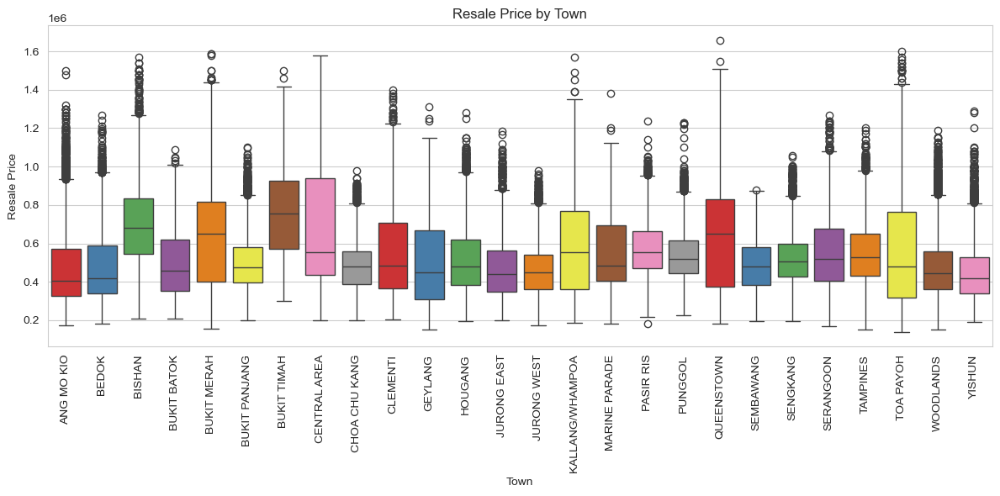

In [113]:
fig, ax = plt.subplots(figsize=plot_fig_size)  

sns.boxplot(data=df, x='town', y='resale_price', hue='town', palette='Set1')

ax.set_title('Resale Price by Town')
ax.set_xlabel('Town')
ax.set_ylabel('Resale Price')
ax.tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

**Some town command higher median selling price compared to other town.**

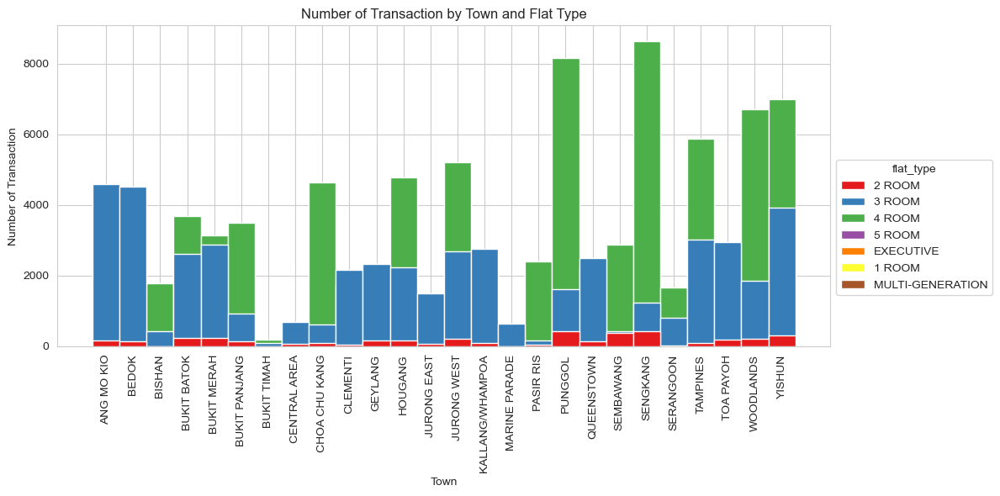

In [114]:
fig, ax = plt.subplots(figsize=plot_fig_size)  

f1 = sns.histplot(data=df, x='town', hue='flat_type', palette='Set1', alpha=1)
sns.move_legend(f1, "upper left", bbox_to_anchor=(1, 0.6))

ax.set_title('Number of Transaction by Town and Flat Type')
ax.set_xlabel('Town')
ax.set_ylabel('Number of Transaction')
ax.set_xticks(ax.get_xticks(), [label.get_text() for label in ax.get_xticklabels()], rotation=90)

plt.tight_layout()
plt.show()


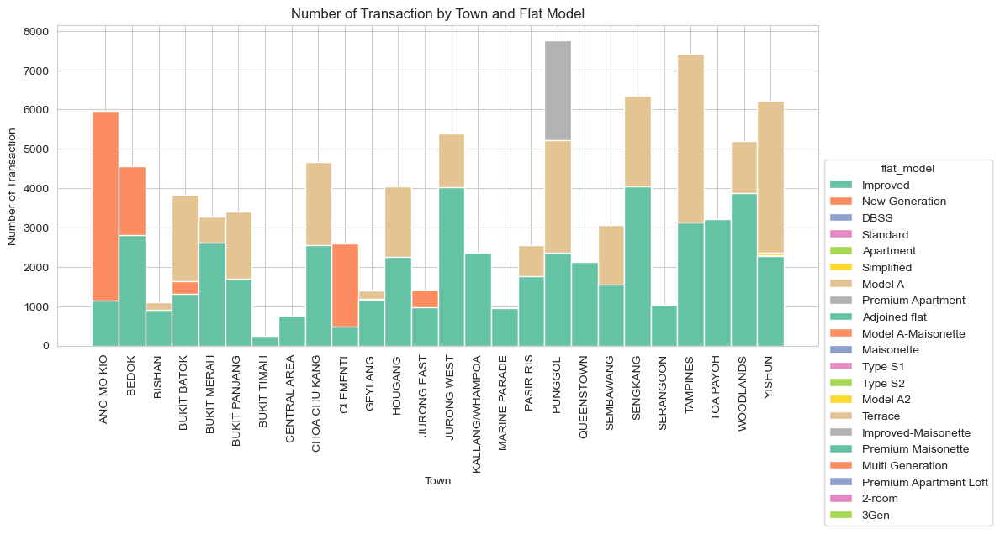

In [115]:
fig, ax = plt.subplots(figsize=plot_fig_size)  

f1 = sns.histplot(data=df, x='town', hue='flat_model', palette='Set2', alpha=1)
sns.move_legend(f1, "upper left", bbox_to_anchor=(1, 0.6))

ax.set_title('Number of Transaction by Town and Flat Model')
ax.set_xlabel('Town')
ax.set_ylabel('Number of Transaction')
ax.set_xticks(ax.get_xticks(), [label.get_text() for label in ax.get_xticklabels()], rotation=90)

plt.tight_layout()
plt.show()

**Some model is only available for sale at some town.**

In [116]:
town_type_breakdown = df[['town', 'flat_type', 'floor_area_sqm', 'resale_price']].groupby(['town', 'flat_type'])
print(town_type_breakdown[['floor_area_sqm']].describe().to_string())



                                 floor_area_sqm                                                           
                                          count        mean        std    min    25%    50%     75%    max
town            flat_type                                                                                 
ANG MO KIO      2 ROOM                    157.0   44.273885   0.636612   44.0   44.0   44.0   44.00   49.0
                3 ROOM                   4603.0   70.988920   5.941121   60.0   67.0   68.0   73.00   89.0
                4 ROOM                   2459.0   92.973160   3.676627   81.0   91.0   92.0   93.50  113.0
                5 ROOM                   1284.0  118.858255   7.187078  110.0  112.0  119.0  121.00  150.0
                EXECUTIVE                 126.0  155.531746   9.120251  142.0  148.0  154.0  163.00  178.0
BEDOK           2 ROOM                    147.0   45.068027   0.816440   44.0   45.0   45.0   45.00   47.0
                3 ROOM               

In [117]:
print(town_type_breakdown[['resale_price']].describe().to_string())

                                 resale_price                                                                                    
                                        count          mean            std       min         25%        50%        75%        max
town            flat_type                                                                                                        
ANG MO KIO      2 ROOM                  157.0  2.532270e+05   44794.230585  178000.0  210000.000   245000.0   293000.0   341000.0
                3 ROOM                 4603.0  3.493004e+05   79175.511759  174000.0  290000.000   340000.0   390000.0   794500.0
                4 ROOM                 2459.0  5.497584e+05  170084.112274  275000.0  420000.000   495000.0   638000.0  1128888.0
                5 ROOM                 1284.0  7.437456e+05  169313.625806  420000.0  615000.000   720000.0   840000.0  1500000.0
                EXECUTIVE               126.0  9.263192e+05  142988.022656  623000.0  8162

**If we breakdown the flat by town and flat type, the dispersion of the floor area and resale price is still wide. But the dispersion of floor area and resale price is narrower compared to just using one classification category. This is due to different flat model.**

In [118]:
full_breakdown = df[['town', 'flat_type', 'flat_model', 'floor_area_sqm', 'resale_price']].groupby(['town', 'flat_type', 'flat_model'])


In [119]:
print(full_breakdown[['floor_area_sqm']].describe().to_string())

                                                        floor_area_sqm                                                            
                                                                 count        mean        std    min     25%    50%     75%    max
town            flat_type        flat_model                                                                                       
ANG MO KIO      2 ROOM           Improved                        157.0   44.273885   0.636612   44.0   44.00   44.0   44.00   49.0
                3 ROOM           Improved                         82.0   61.524390   3.092107   60.0   60.00   60.0   61.00   69.0
                                 Model A                         197.0   68.680203   1.230673   67.0   68.00   68.0   70.00   70.0
                                 New Generation                 4324.0   71.273589   5.941720   67.0   67.00   68.0   73.00   89.0
                4 ROOM           DBSS                            108.0   90.490741 

In [120]:
print(full_breakdown[['resale_price']].describe().to_string())

                                                        resale_price                                                                                     
                                                               count          mean            std        min         25%        50%        75%        max
town            flat_type        flat_model                                                                                                              
ANG MO KIO      2 ROOM           Improved                      157.0  2.532270e+05   44794.230585   178000.0   210000.00   245000.0   293000.0   341000.0
                3 ROOM           Improved                       82.0  3.222456e+05   60229.412254   230000.0   269166.00   330000.0   360000.0   470000.0
                                 Model A                       197.0  5.585788e+05  105251.712666   370000.0   468000.00   550000.0   640000.0   794500.0
                                 New Generation               4324.0  3.4027

**If we breakdown the flat by town, flat type and flat model, for some location, there is no dispersion. However for some location, the dispersion of the floor area and resale price is much narrower compared to previous grouping and classification. However, some flat model still present a slightly wide dispersion in terms of flat model and resale price.**

In [121]:
group_flat_model_sqm = df[['flat_type', 'flat_model', 'floor_area_sqm', 'resale_price']].groupby(['flat_type', 'flat_model', 'floor_area_sqm']).mean()
print(group_flat_model_sqm.to_string())

                                                        resale_price
flat_type        flat_model             floor_area_sqm              
1 ROOM           Improved               31.0            2.098462e+05
2 ROOM           2-room                 37.0            3.093333e+05
                                        38.0            3.473060e+05
                                        40.0            2.650440e+05
                                        42.0            2.950000e+05
                                        43.0            2.990000e+05
                                        44.0            2.976667e+05
                                        46.0            2.870000e+05
                                        47.0            3.512106e+05
                                        48.0            3.759610e+05
                                        55.0            3.012500e+05
                 DBSS                   50.0            3.675000e+05
                 Improved         

**Even if we fine tuned the flat selection by model type, there are many variation in terms of floor area. For example, in a 5 Room Model A flat we have a range of 129 sqm to 157 sqm. This proves that if we narrow our selection to model type, we may not have accurate prediction without the indication of floor area.**

**Our initial conclusion is that the best feature to predict housing price is the floor area. However, we will keep the flat type and flat model to provide us segmentation information so that we can improve the prediction of resale price.**

### Selected Break Down of Resale Price

#### 4 ROOM with Model A by Town

In [122]:
four_model_A = df.loc[(df['flat_type']=='4 ROOM') & (df['flat_model']=='Model A'),['town', 'floor_area_sqm', 'resale_price']]

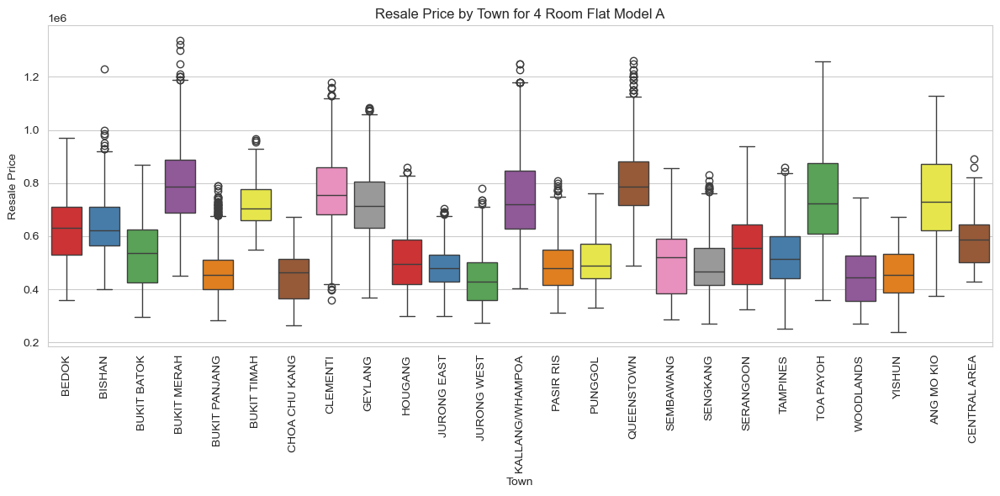

In [123]:
fig, ax = plt.subplots(figsize=plot_fig_size)  

sns.boxplot(data=four_model_A, x='town', y='resale_price', hue='town', palette='Set1')

ax.set_title('Resale Price by Town for 4 Room Flat Model A')
ax.set_xlabel('Town')
ax.set_ylabel('Resale Price')
ax.set_xticks(ax.get_xticks())
ax.set_xticklabels([label.get_text() for label in ax.get_xticklabels()], rotation=90)

plt.tight_layout()
plt.show()

**The more we breakdown by town, flat type and flat model, the less dispersion is the resale price. However, it is clear that not every town command the same resale price for the same type of flat with the same model.**

### Correlation Analysis

In [124]:
numerical_columns

Index(['storey_range', 'floor_area_sqm', 'lease_commence_date', 'resale_price',
       'transaction_year', 'transaction_month', 'remaining_lease_by_month'],
      dtype='object')

In [125]:
corr_column = df[numerical_columns]
corr_matrix_pear = corr_column.corr(method='pearson')
corr_matrix_pear

,storey_range,floor_area_sqm,lease_commence_date,resale_price,transaction_year,transaction_month,remaining_lease_by_month
storey_range,1.000000,-0.014410,0.273218,0.342520,0.011588,-0.003189,0.272940
floor_area_sqm,-0.014410,1.000000,0.101703,0.579277,-0.043744,0.005851,0.111033
lease_commence_date,0.273218,0.101703,1.000000,0.369411,0.129839,0.000321,0.985837
resale_price,0.342520,0.579277,0.369411,1.000000,0.377370,-0.016870,0.308908
transaction_year,0.011588,-0.043744,0.129839,0.377370,1.000000,-0.136763,-0.035914
transaction_month,-0.003189,0.005851,0.000321,-0.016870,-0.136763,1.000000,0.003903
remaining_lease_by_month,0.272940,0.111033,0.985837,0.308908,-0.035914,0.003903,1.000000


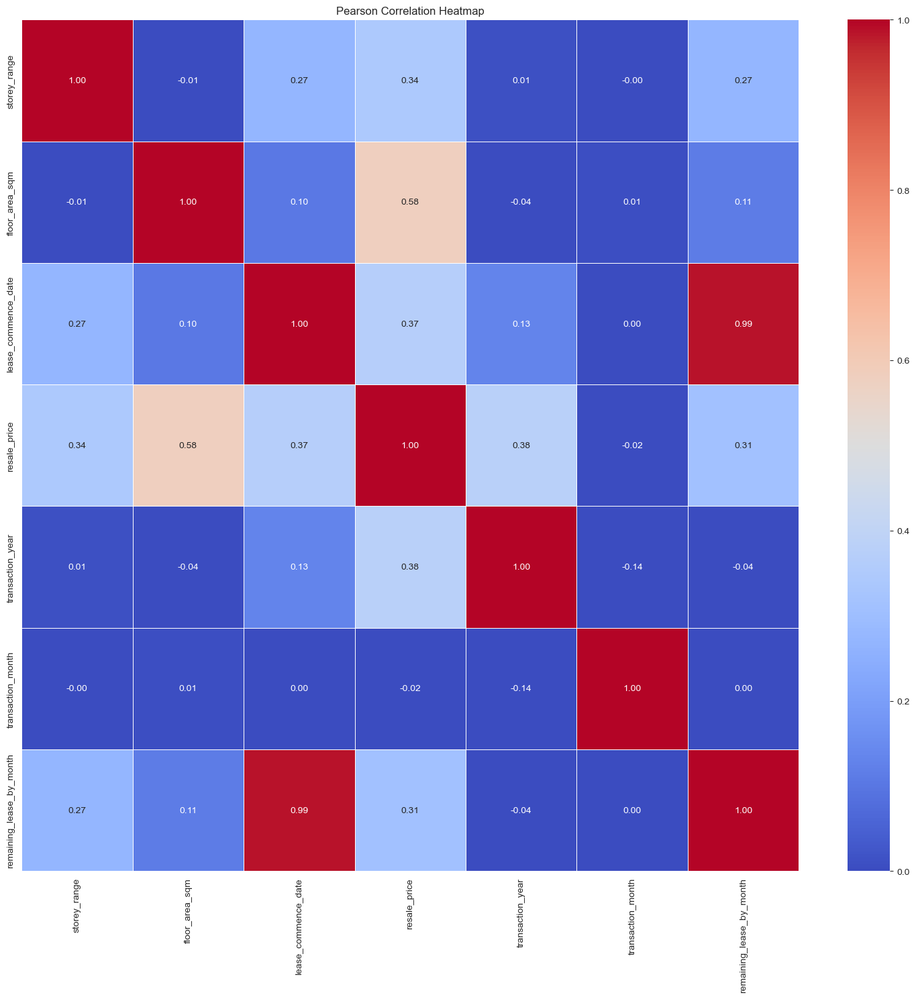

In [126]:
fig, ax = plt.subplots(figsize=plot_heatmap)  

sns.heatmap(corr_matrix_pear, annot=True, cmap='coolwarm', vmin=0, center=0.5, vmax=1, linewidths=0.5, fmt=".2f")

ax.set_title('Pearson Correlation Heatmap')

plt.tight_layout()
plt.show()

**There is a strong correlation between floor area and resale price. There is also moderate correlation between resale price and lease commence date, remaining lease by month which in turn indicating the age of the flat. The features, lease commence date and remaining lease in months are highly correlated. Therefore, we will drop one of the lease commence date. This also confirm our suspicion during the pair plot analysis. There is also moderate correlation between transaction year and storey range. Transaction month need to be one-hot encoded to assist in detecting seasonality.**

In [127]:
categorical_columns

Index(['town', 'flat_type', 'flat_model', 'remaining_lease'], dtype='object')

In [128]:
spearman_col = df[numerical_columns]
spearman_corr = spearman_col.corr(method='spearman')

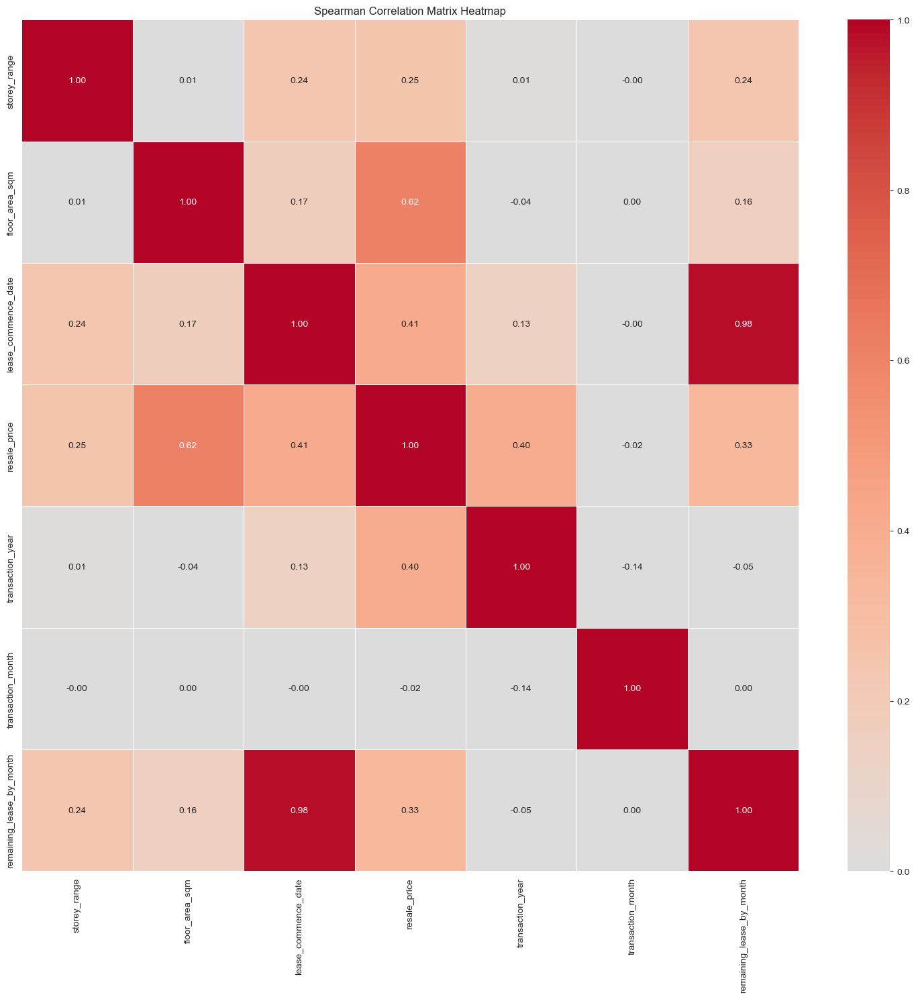

In [129]:
fig, ax = plt.subplots(figsize=plot_heatmap)  

sns.heatmap(spearman_corr, annot=True, cmap='coolwarm', vmin=0, center=0, vmax=1, linewidths=0.5, fmt=".2f")

ax.set_title('Spearman Correlation Matrix Heatmap')

plt.tight_layout()
plt.show()

In [133]:
# List Spearman Correlation for target resale price
resale_price_corr = spearman_corr['resale_price']
resale_price_corr.sort_values(ascending=False)

resale_price                1.000000
floor_area_sqm              0.616251
lease_commence_date         0.412372
transaction_year            0.400609
remaining_lease_by_month    0.334200
storey_range                0.248156
transaction_month          -0.015550
Name: resale_price, dtype: float64

**There is even stronger correlation between floor area and resale price. Hinting at the non-linearity. Moderate correlation between age of the flat and the resale price. Moderate to weak correlation between height of the flat and resale price. Similarly, there is high correlation between lease commence date and remaining lease in months. Remaining lease in months are more granular. Therefore, we can consider dropping lease commence date.**

In [198]:
# Compute VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calculate_vif(df: pd.DataFrame, features: list) -> pd.DataFrame:
    """
    Calculate Variance Inflation Factor (VIF) for each feature in the DataFrame.
    
    Args:
        df (pd.DataFrame): DataFrame containing the features.
        features (list): List of feature names to calculate VIF for.
        
    Returns:
        pd.DataFrame: DataFrame with features and their corresponding VIF values.
    """
    vif_data = pd.DataFrame()
    vif_data['Feature'] = features
    vif_data['VIF'] = [variance_inflation_factor(df[features].values, i) for i in range(len(features))]
    return vif_data

vif_df = calculate_vif(df, numerical_features)
print(vif_df)

                    Feature           VIF
0              storey_range  3.445527e+00
1            floor_area_sqm  1.756370e+01
2       lease_commence_date  4.363325e+07
3          transaction_year  4.043223e+07
4         transaction_month  8.181452e+00
5  remaining_lease_by_month  6.238878e+04


In [199]:
vif_df = calculate_vif(df, numerical_features.drop('lease_commence_date').to_list())
print(vif_df)

                    Feature        VIF
0              storey_range   3.441506
1            floor_area_sqm  17.484611
2          transaction_year  44.062466
3         transaction_month   4.632959
4  remaining_lease_by_month  31.300764


**VIF above 10 is a major problem. VIF between 5 to 10 is also a concern. VIF shows that high multicollinearity between transaction year, remaining lease by month and lease commence date.  After removing lease commence date. VIF still shows high multicollinearity between floor area, transaction year and remaining lease by month. Since we will be using tree-based model, we will keep these features as it provides important information.**

### Analysis of Floor Area and Resale Price

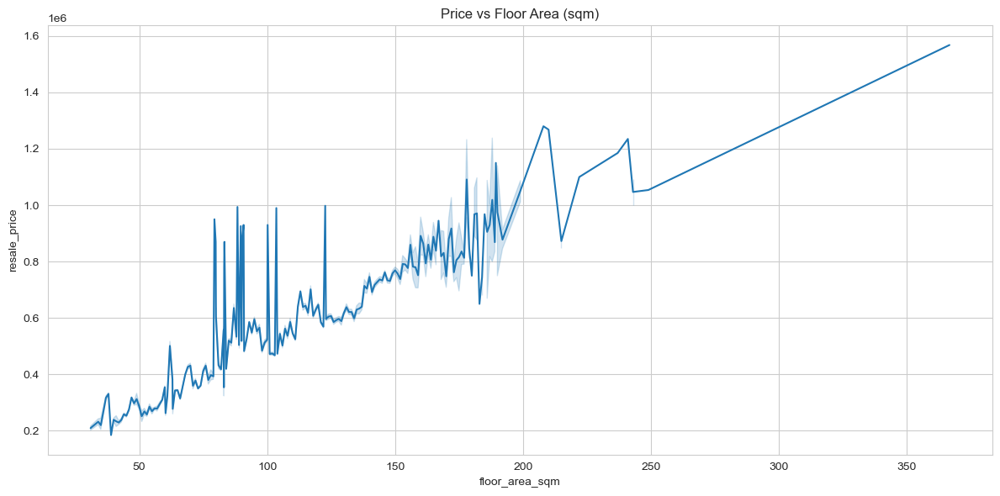

In [200]:
fig, ax = plt.subplots(figsize=plot_fig_size)  

sns.lineplot(df, x = df.floor_area_sqm, y=df.resale_price, estimator='mean')

ax.set_title('Price vs Floor Area (sqm)')

plt.tight_layout()
plt.show()

**There is a linear trend in terms of resale price and its biggest contributor.**

## Transformed Data Dictionary

**Numerical Features**
| Feature Names | Type Before  | Type After Conversion | Processing Steps  |
| ------------- |:-------------:| :-----: | :----------------| 
| floor_area_sqm | float | float | no change |
| transac_year | string | integer | convert from string column `month` to year by extracting the year using date time function |
| remaining_lease_by_months| string | integer | convert from string column to numeric data by calculating the years and months into months in total  |
| storey_range| string | integer | convert from string column to numeric data by calculating middle of the floor indicated in the string  |

**Categorical Features**
| Feature Names | Type Before | Type After Conversion | Processing Steps  |
| ------------- |:-------------:| :-------------: | :-----|
| flat_type | string | one-hot encoded | one-hot encoding |
| town_name | string | one-hot encoded | one-hot encoding |
| flat_model | string | one-hot encoded | one-hot encoding |
| transac_month | integer | one-hot encoded | convert from string column `month` to month by extracting the month using date time function then we use one-hot encoding |

## EDA Findings

### Conclusion

- **Floor area is the most important feature follow by age of the flat and the height of the flat.**
- **For the age of the flat, we will drop the column `lease_commence_date` and keep `remaining_lease_by_month`.** 
- **Other categorical features that are not in correlation analysis also provide important signal on pricing prediction as shown in bivariate analysis.**
- **We will keep the `flat_type` and `flat_model` (flat model) to improve the prediction by providing segmental information.**
- **Investigation in our EDA suggested that there are many variation in `flat_type`. For example, a 3-room flat, the floor area ranges from 78sqm to 280 sqm. Therefore, we think that `flat_type` should be nominal instead of ordinal.**
- **Lastly, we will keep transaction year and month, to help with the seasonal resale price prediction.**

### Model Selection

- **Base on the analysis and evidence above, we decided to use tree-based modeling as our main modeling class.** 
- **As an academic analysis, we may perform Linear or Ridge Regression to check if mitigation techniques are applied, can we achiever better performance.**
- **We will also explore Huber and Quantile Regression.**
- **For tree-based model, Decision Tree will be our baseline model.**
- **We will also explore ensemble techniques and gradient boosting model for optimal prediction.**
- **Since this HDB resale price is supplied month by month, we will follow the way we received data as the main data splitting method.**
- **After deployment of the tree-based model, we will explore additional time series element and model stacking as further improvement.**

## Auto Profiling

In [1]:
from ydata_profiling import ProfileReport
import pandas as pd

df2 = pd.read_csv('./data/hdb_resale_price.csv')

# Create the profile report
report = ProfileReport(df2, title="HDB Resale Price Data")
report.to_file("hdb_resale_price_data_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 11/11 [00:00<00:00, 57.35it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Data Preprocessing

In [137]:
# Load the dataset
df = pd.read_csv('./data/hdb_resale_price.csv')

In [138]:
# Remove duplicated items
df.drop_duplicates(inplace=True)
# Splitting column 'month' into year and month
df = convert_month_to_year_month(df)
# Convert column remaining lease to remaining lease by  months
df['remaining_lease_by_months'] = df.remaining_lease.apply(convert_lease_to_month)
# convert storey range to number middle value
df['storey_range'] = df.storey_range.apply(convert_storey_range)
# Dropping irrelevant columns for machine learning preparation
irrelevant_columns = ['block', 'street_name', 'remaining_lease', 'lease_commence_date']
df.drop(columns = irrelevant_columns, inplace=True)

In [139]:
X = df.set_index('month').sort_index().copy() 
y = X['resale_price']
X = X.drop(columns=['resale_price'])

In [140]:
# find split date for training and validation
split_date_train = df['month'].quantile(0.6)
# find split date for validation and test
split_date_validation = df['month'].quantile(0.8) 

In [141]:
# Split the data into training and testing sets in a temporal manner
X_train = X[X.index < split_date_train]
y_train = y[y.index < split_date_train]
X_validation = X[(X.index >= split_date_train) & (X.index < split_date_validation)]
y_validation = y[(y.index >= split_date_train) & (y.index < split_date_validation)]
X_test = X[X.index >= split_date_validation]
y_test = y[y.index >= split_date_validation]

In [142]:
# Display the shapes of the splits to verify
print("Training set shape:", X_train.shape, y_train.shape)
print("Validation set shape:", X_validation.shape, y_validation.shape)
print("Test set shape:", X_test.shape, y_test.shape)

Training set shape: (125284, 8) (125284,)
Validation set shape: (41584, 8) (41584,)
Test set shape: (43914, 8) (43914,)


### Numerical Preprocessing

In [146]:
# Select columns that are numerical for feature scaling preparation
numerical_features = ['floor_area_sqm', 'remaining_lease_by_months', 'transaction_year'] 

degree = 1  # Degree of polynomial features, can be adjusted
# Create a numerical transformer pipeline
numerical_transformer = Pipeline(steps=[
    ('polynomial_features', PolynomialFeatures(degree=degree)),  # Placeholder for polynomial features
    ('scaler', StandardScaler())
])

### Nominal Preprocessing

In [147]:
# Select columns that need to be one-hot encoded
nominal_features = ['transaction_month', 'town', 'flat_model', 'flat_type']

# Setting pipeline for one-hot encoding
nominal_transformer = Pipeline(steps=[
    ('one_hot', OneHotEncoder(handle_unknown='ignore'))
])

### Passthrough Preprocessing

In [148]:
# Select the columns that do not required further processing 
passthrough_features = ['storey_range']

### Preprocessor

In [170]:
# tree base preprocessor
tree_base_preprocessor = ColumnTransformer(
    transformers=[
        ('num', 'passthrough', numerical_features),
        ('nom', nominal_transformer, nominal_features),
        ('pass', 'passthrough', passthrough_features) 
    ],
    remainder='passthrough',
    n_jobs=-1
    )

In [171]:
# print numerical, nominal and passthrough features
print("Numerical features:", numerical_features)
print("Nominal features:", nominal_features)    
print("Passthrough features:", passthrough_features)

Numerical features: ['floor_area_sqm', 'remaining_lease_by_months', 'transaction_year']
Nominal features: ['transaction_month', 'town', 'flat_model', 'flat_type']
Passthrough features: ['storey_range']


In [172]:
tree_base_preprocessor

ColumnTransformer(n_jobs=-1, remainder='passthrough',
                  transformers=[('num', 'passthrough',
                                 ['floor_area_sqm', 'remaining_lease_by_months',
                                  'transaction_year']),
                                ('nom',
                                 Pipeline(steps=[('one_hot',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 ['transaction_month', 'town', 'flat_model',
                                  'flat_type']),
                                ('pass', 'passthrough', ['storey_range'])])

## Feature Selection

### Manual Selection

In [173]:
resale_price_corr.sort_values(ascending=False)

resale_price                1.000000
floor_area_sqm              0.616251
lease_commence_date         0.412372
transaction_year            0.400609
remaining_lease_by_month    0.334200
storey_range                0.248156
transaction_month          -0.015550
Name: resale_price, dtype: float64

| Feature Names | Features Type  | Data Type | Justification  |
| ------------- |:-------------:| :-----: | :----------------| 
| floor_area_sqm | Numerical Features | float | Best Spearman correlation of 0.62 |
| transaction_year | Numerical Features | integer | Since the data is split by time, we need transaction year to differentiate sales in different year. Moderate Spearman correlation of 0.4 |
| remaining_lease_by_months| Numerical Features | integer | Moderate to low Spearman correlation of 0.33. This is age of the flat.  |
| storey_range| Numerical Features | integer | Moderate to low Spearman correlation of 0.25. |
| flat_type | Categorical Features | one-hot encoded | May contain important information as per analysis |
| town_name | Categorical Features | one-hot encoded | Different town has different resales price median |
| flat_model | Categorical Features | one-hot encoded | May contain important information as per analysis |
| transaction_month | Categorical Features | one-hot encoded | This has the lowest correlation, but we need month to detect cyclical information. This is the only feature to detect cyclical information. We will keep this incase there is more prominent cyclical trend emerge.  |

### Recursive Feature Elimination

In [174]:
xgbr = XGBRegressor(random_state=42)

selector = RFECV(
    estimator=xgbr,
    step=1,                     # drop one feature per round
    cv=KFold(5, shuffle=True, random_state=42),
    scoring='neg_mean_absolute_error',
    n_jobs=-1
)

In [175]:
# RFE Regressor Pipeline

rfe_pipeline = Pipeline(steps=[
    ('preprocessor', tree_base_preprocessor),
    ('selector', selector),
    ('regressor', xgbr)
])  

In [176]:
rfe_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('num', 'passthrough',
                                                  ['floor_area_sqm',
                                                   'remaining_lease_by_months',
                                                   'transaction_year']),
                                                 ('nom',
                                                  Pipeline(steps=[('one_hot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['transaction_month', 'town',
                                                   'flat_model', 'flat_type']),
                                                 ('pass', 'passthrough',
                                                  ['storey_ra...
                              feature_types=None, feature_weights=None,
                              gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=None, n_jobs=None,
                              num_parallel_tree=None, ...))])

In [177]:
print(f"Selected {rfe_pipeline.named_steps['selector'].n_features_} features")
print(f"Test MAE: {rfe_pipeline.score(X_test, y_test):.2f}")

Selected 64 features
Test MAE: 0.60


In [178]:
print(f"Selected {rfe_pipeline.named_steps['selector'].n_features_} features")
print(f"Selected Features: {rfe_pipeline.named_steps['selector'].support_}")
print(f"Feature Ranking: {rfe_pipeline.named_steps['selector'].ranking_}")

Selected 64 features
Selected Features: [ True  True  True  True  True  True  True False False  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True False  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True False  True  True  True  True  True False  True]
Feature Ranking: [1 1 1 1 1 1 1 3 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 6 1 1 1 1 1 5 1]


In [188]:
feature_names_all = rfe_pipeline.named_steps['preprocessor'].get_feature_names_out()  
mask = rfe_pipeline.named_steps['selector'].support_
anti_mask = ~mask
non_selected_names = feature_names_all[anti_mask]

In [189]:
print(f"{len(non_selected_names)} features kept:")
print(non_selected_names.tolist())

5 features kept:
['nom__transaction_month_5', 'nom__transaction_month_6', 'nom__flat_model_2-room', 'nom__flat_type_1 ROOM', 'nom__flat_type_MULTI-GENERATION']


**RFE confirms that our manually selected features are significant. However, some groups in the features seems to add extra noise. Since only 5 group is not selected in RFE. We will perform modeling with RFE fitted features and modeling without RFE fitted features and compare the result. We will make a data driven call.**  

## END